<img src="images/dengue_mosquito.jpg" style="width:85%">
<i><center>The Aedes mosquito, the main vector that transmits the viruses that cause Dengue Fever</center></i>

<img src="images/project_title.png" style="width:85%">

In [17]:
# Import required libraries and functions
import math
import numpy as np
import pandas as pd
#import random
#from pprint import pprint
#from operator import itemgetter
from datetime import date
from statsmodels.graphics.tsaplots import acf, plot_acf, pacf, plot_pacf 
from statsmodels.tsa.seasonal import seasonal_decompose 
from sklearn.preprocessing import StandardScaler, Imputer
#from matplotlib.pyplot import fill
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, ElasticNetCV, ElasticNet
from sklearn.model_selection import cross_val_score, cross_val_predict, KFold, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline


%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [18]:
# Set display option to display all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [19]:
# Set matplotlib plotting parameters
plt.rcParams.update({'axes.facecolor': 'whitesmoke',
                     'axes.titlesize': 12,
                     'axes.edgecolor': 'black',
                     'axes.linewidth': 0.6,
                     'axes.titlepad': 12,
                     'axes.labelsize': 12,
                     'axes.labelpad': 12,
                     'xtick.labelsize':12,
                     'ytick.labelsize':12,
                     'legend.fontsize': 10,
                     'legend.edgecolor': 'black',
                     'legend.loc': 'lower right',
                     'legend.framealpha': 1 })

# Model Performance Snapshot

<img src="../images/model_summary.png" style="width:900px">

# Model data

Load model data created in Part 3 (see part3-EDA-and-cleaning.ipynb) of Capstone project.

In [20]:
# Define data directory
data_directory = 'data/'

In [21]:
# Define dataframes for the San Juan and Iquitos model data, reading the data 
# from the csv files previously created.  Set week_start_date as the df index.

sj_df = pd.read_csv(data_directory+'sj_model_data_4_26weeks.csv', index_col='week_start_date',
                    parse_dates = ['week_start_date'])


iq_df = pd.read_csv(data_directory+'iq_model_data_4_26weeks.csv', index_col='week_start_date',
                    parse_dates = ['week_start_date'])

Inspect data to confirm it's been loaded correctly.

In [22]:
# Print sj_df shape and display head
print(sj_df.shape)
sj_df.head()

(988, 37)


,season,month,season_week,ST_mean_Tmin_11,ST_mean_Tavg_11,ST_min_Tmin_11,ST_mean_Tmax_12,RA_max_Tair_9,RA_max_Tavg_9,RA_mean_Tmin_9,RA_mean_Tair_9,RA_max_Tmax_10,RA_min_Tmin_9,RA_mean_Tavg_10,RA_mean_Tdp_10,ST_max_Tmax_11,RA_mean_RHsp_9,RA_max_Tdp_10,RA_max_RHsp_10,RA_min_RHsp_9,RA_min_Tdp_9,RA_min_Tair_10,RA_mean_Tmax_10,RA_min_Tavg_10,SA_PRECIP_GT1_7,RA_mean_RHpc_5,ST_mean_Tdtr_26,RA_max_RHpc_4,RA_min_RHpc_11,ST_max_Tdtr_26,RA_mean_Pday_4,ndvi_se_16,RA_mean_Tdtr_4,RA_min_Tdtr_4,SA_PRECIP_GT10_26,ST_PRCP_GT1_25,total_cases
week_start_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1990-04-30,1990/1991,Apr,1,21.442857,24.957143,20.6,28.171429,24.53,24.90,22.921429,23.910000,24.95,22.55,23.642857,19.098571,31.1,13.955714,19.58,14.14,13.35,18.63,23.36,24.678571,23.05,3.0,75.132857,6.442857,81.55,70.82,7.8,1.300000,0.281100,3.200000,2.6,3.0,4.0,4
1990-05-07,1990/1991,May,2,21.128571,24.471429,20.6,28.414286,24.44,24.75,22.664286,23.648571,26.45,21.65,24.185714,19.310000,28.3,13.981429,19.94,14.50,13.10,18.33,23.43,25.450000,23.70,0.0,77.818571,6.771429,80.75,73.38,7.3,0.631429,0.116900,2.428571,1.9,0.0,5.0,5
1990-05-14,1990/1991,May,3,21.600000,25.042857,20.0,27.771429,24.13,24.35,22.807143,23.697143,26.15,22.05,23.878571,19.340000,30.6,14.587143,20.00,14.58,13.69,19.02,22.57,25.092857,22.65,0.0,75.242857,6.457143,84.25,73.50,8.4,3.485714,0.127586,2.614286,1.7,0.0,3.0,4
1990-05-21,1990/1991,May,4,21.285714,24.571429,20.6,28.485714,24.53,24.80,23.221429,24.221429,25.75,22.95,23.864286,20.018571,29.4,14.287143,20.83,15.35,13.47,18.77,22.63,24.921429,22.60,0.0,77.755714,8.042857,85.35,73.55,10.0,4.557143,0.268467,2.957143,1.0,3.0,1.0,3
1990-05-28,1990/1991,May,5,21.657143,24.528571,20.0,27.857143,24.13,24.00,22.735714,23.601429,26.25,22.35,24.478571,19.694286,28.3,13.625714,20.60,15.11,13.09,18.27,23.69,25.735714,23.90,0.0,72.415714,8.257143,81.30,73.58,10.0,2.377143,0.171800,2.385714,1.8,0.0,0.0,6


In [23]:
# Inspect descriptive statistics to ensure no surprises
sj_df.describe()

,season_week,ST_mean_Tmin_11,ST_mean_Tavg_11,ST_min_Tmin_11,ST_mean_Tmax_12,RA_max_Tair_9,RA_max_Tavg_9,RA_mean_Tmin_9,RA_mean_Tair_9,RA_max_Tmax_10,RA_min_Tmin_9,RA_mean_Tavg_10,RA_mean_Tdp_10,ST_max_Tmax_11,RA_mean_RHsp_9,RA_max_Tdp_10,RA_max_RHsp_10,RA_min_RHsp_9,RA_min_Tdp_9,RA_min_Tair_10,RA_mean_Tmax_10,RA_min_Tavg_10,SA_PRECIP_GT1_7,RA_mean_RHpc_5,ST_mean_Tdtr_26,RA_max_RHpc_4,RA_min_RHpc_11,ST_max_Tdtr_26,RA_mean_Pday_4,ndvi_se_16,RA_mean_Tdtr_4,RA_min_Tdtr_4,SA_PRECIP_GT10_26,ST_PRCP_GT1_25,total_cases
count,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.000000,988.00000
mean,26.500000,23.629666,26.994530,22.596559,30.359735,26.601184,26.775759,24.861035,26.010924,28.256883,24.144534,26.123012,21.942175,31.563968,16.535465,22.718978,17.316862,15.715010,21.099858,25.364453,27.386145,25.407844,2.697368,78.487562,6.754470,83.002490,74.141326,8.275000,4.299359,0.178377,2.527741,1.659109,1.103239,2.765182,33.42915
std,15.015932,1.406972,1.421040,1.532924,1.543079,1.229111,1.224758,1.198124,1.242549,1.288792,1.282274,1.226549,1.570614,1.727288,1.561089,1.430460,1.495941,1.749282,1.859189,1.317784,1.302978,1.300123,2.272365,3.361908,0.840587,3.607005,3.846240,1.194835,4.968302,0.057718,0.506860,0.488187,1.350999,1.714567,50.21397
min,1.000000,19.200000,22.085714,17.800000,25.014286,23.190000,23.150000,20.435714,22.067143,24.750000,19.450000,22.014286,15.491429,26.100000,10.985714,17.170000,12.170000,9.400000,13.180000,20.830000,23.592857,20.800000,0.000000,66.538571,4.214286,72.430000,57.150000,5.000000,0.000000,-0.015533,1.442857,0.400000,0.000000,0.000000,0.00000
25%,13.750000,22.457143,25.785714,21.700000,29.185714,25.590000,25.800000,23.835714,24.986786,27.250000,23.150000,25.133929,20.678929,30.600000,15.237857,21.610000,16.107500,14.437500,19.850000,24.310000,26.364286,24.450000,0.000000,76.210714,6.200000,80.445000,71.880000,7.300000,1.471429,0.139255,2.171429,1.300000,0.000000,1.000000,9.00000
50%,26.500000,23.800000,27.207143,22.800000,30.628571,26.750000,26.900000,25.007143,26.151429,28.350000,24.350000,26.235714,22.298571,31.700000,16.837857,23.000000,17.570000,16.070000,21.550000,25.415000,27.464286,25.450000,3.000000,78.532857,6.721429,83.040000,74.530000,8.300000,3.020714,0.177450,2.457143,1.600000,1.000000,3.000000,19.00000
75%,39.250000,24.828571,28.185714,23.900000,31.600000,27.640000,27.800000,25.867857,27.033214,29.250000,25.150000,27.128571,23.266786,32.800000,17.863571,23.880000,18.530000,17.192500,22.650000,26.390000,28.407143,26.400000,5.000000,80.874643,7.314286,85.850000,76.685000,8.900000,5.444643,0.213646,2.800000,1.900000,2.000000,4.000000,37.00000
max,52.000000,26.671429,30.100000,26.100000,33.971429,29.300000,29.300000,27.135714,28.708571,31.150000,26.650000,28.685714,24.435714,35.600000,19.198571,25.200000,20.090000,18.860000,24.130000,28.140000,30.764286,28.200000,7.000000,88.500000,9.985714,92.850000,85.970000,13.300000,82.042857,0.393129,4.471429,3.500000,7.000000,7.000000,461.00000


Data is aligned with expectations.

In [24]:
# Confirm no null values in df
sj_df.isnull().sum().sum()

0

In [25]:
# Print iq_df shape and display head
print(iq_df.shape)
iq_df.head()

(468, 43)


,season,month,season_week,RA_mean_RHsp_4,ST_min_Tmin_4,RA_mean_Tdp_4,RA_max_RHsp_4,RA_mean_Tmin_4,RA_max_Tdp_4,ST_mean_Tmin_4,RA_min_Tmin_4,RA_max_Tdtr_18,RA_min_RHsp_4,RA_min_Tdp_4,RA_mean_Tdtr_18,RA_min_Tdtr_16,RA_max_Tmax_15,RA_mean_Tair_8,ST_mean_Tmax_7,RA_mean_Tavg_8,RA_mean_Tmax_15,RA_max_Tavg_8,RA_min_Tair_8,RA_min_Tavg_4,RA_max_Tair_7,ndvi_sw_15,SA_max_Pday_4,ST_min_Tdtr_22,ndvi_ne_15,ndvi_nw_15,SA_PRECIP_GT30_4,RA_min_RHpc_15,RA_max_Pday_19,SA_mean_Pday_17,ndvi_se_23,ST_max_Tmax_24,RA_mean_Pday_18,SA_PRECIP_GT10_17,RA_mean_RHpc_18,SA_PRECIP_GT1_26,RA_max_RHpc_18,ST_mean_Tavg_25,total_cases
week_start_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-07-01,2000/2001,Jul,1,16.621429,20.9,22.021429,17.39,20.378571,22.77,21.300000,19.05,9.3,15.79,21.20,7.200000,9.0,33.35,23.535714,31.375,24.464286,30.721429,25.55,23.12,23.35,24.74,0.230114,15.37,11.0,0.219786,0.222414,0.0,85.10,21.4,13.118571,0.236317,33.6,19.320000,4.0,94.908571,6.0,98.98,27.425000,0
2000-07-08,2000/2001,Jul,2,16.325714,21.0,21.681429,18.28,20.535714,23.50,21.280000,18.35,9.2,14.44,19.77,5.685714,3.0,30.75,23.682857,30.500,24.685714,28.421429,25.55,22.77,23.75,23.45,0.231000,41.53,13.0,0.250425,0.222080,1.0,90.63,76.3,9.164286,0.264886,32.0,14.808571,2.0,93.875714,6.0,98.88,27.338889,0
2000-07-15,2000/2001,Jul,3,16.835714,19.8,22.217143,18.65,20.907143,23.93,20.833333,18.65,11.9,15.19,20.60,10.714286,4.3,29.55,22.785714,32.800,23.942857,27.192857,25.35,22.41,24.00,24.22,0.121743,21.47,10.0,0.145757,0.136329,0.0,91.65,31.2,11.267143,0.419967,34.0,7.482857,3.0,87.910000,4.0,94.75,27.252778,0
2000-07-22,2000/2001,Jul,4,16.504286,20.7,21.877143,17.19,20.121429,22.52,21.000000,17.95,13.3,15.72,21.10,8.871429,3.5,31.75,23.307143,31.400,24.700000,28.421429,26.70,21.95,24.70,23.46,0.306067,10.45,10.7,0.291257,0.335267,0.0,86.90,14.8,16.944286,0.231000,35.5,24.291429,5.0,91.770000,7.0,99.45,27.166667,0
2000-07-29,2000/2001,Jul,5,17.182857,20.7,22.542857,17.69,20.592857,23.00,20.925000,19.45,9.7,16.26,21.63,7.400000,4.6,31.15,23.110000,32.600,23.942857,30.178571,24.95,22.43,23.45,25.40,0.296817,32.36,9.5,0.271857,0.191300,2.0,88.30,133.7,14.692857,0.248071,36.0,6.524286,2.0,93.142857,4.0,96.90,27.933333,0


In [26]:
# Inspect descriptive statistics to ensure no surprises
iq_df.describe()

,season_week,RA_mean_RHsp_4,ST_min_Tmin_4,RA_mean_Tdp_4,RA_max_RHsp_4,RA_mean_Tmin_4,RA_max_Tdp_4,ST_mean_Tmin_4,RA_min_Tmin_4,RA_max_Tdtr_18,RA_min_RHsp_4,RA_min_Tdp_4,RA_mean_Tdtr_18,RA_min_Tdtr_16,RA_max_Tmax_15,RA_mean_Tair_8,ST_mean_Tmax_7,RA_mean_Tavg_8,RA_mean_Tmax_15,RA_max_Tavg_8,RA_min_Tair_8,RA_min_Tavg_4,RA_max_Tair_7,ndvi_sw_15,SA_max_Pday_4,ST_min_Tdtr_22,ndvi_ne_15,ndvi_nw_15,SA_PRECIP_GT30_4,RA_min_RHpc_15,RA_max_Pday_19,SA_mean_Pday_17,ndvi_se_23,ST_max_Tmax_24,RA_mean_Pday_18,SA_PRECIP_GT10_17,RA_mean_RHpc_18,SA_PRECIP_GT1_26,RA_max_RHpc_18,ST_mean_Tavg_25,total_cases
count,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.00000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000,468.000000
mean,26.500000,16.998546,21.158013,22.252141,18.364017,21.304170,23.556175,22.051229,19.611111,13.353419,15.502927,20.749637,9.254334,4.913248,33.842094,24.660090,32.695276,25.919509,30.540891,27.644338,23.396261,24.054487,25.94750,0.267165,27.691303,9.471261,0.266391,0.239297,0.504274,79.347094,24.216346,9.307575,0.253543,33.831090,7.959880,2.269231,88.423684,5.198718,95.837500,27.441871,7.773504
std,15.024391,1.426843,1.295816,1.405828,1.334566,1.125302,1.203623,0.922242,1.638922,2.982025,1.766918,1.908728,2.460983,2.379866,2.440215,1.161439,1.250706,1.322699,2.299346,1.422357,1.197142,1.496610,1.41024,0.086550,16.180570,1.686086,0.081194,0.077020,0.697182,10.851896,27.970309,5.183554,0.075653,1.320432,6.958854,1.412757,7.713169,1.580475,5.247128,0.876207,11.209891
min,1.000000,12.398571,14.700000,17.325714,13.310000,16.892857,18.400000,16.950000,13.750000,4.000000,9.330000,12.890000,2.942857,0.800000,26.650000,21.485714,29.100000,21.642857,24.178571,23.350000,18.880000,19.250000,22.47000,0.064183,0.000000,3.900000,0.061729,0.035860,0.000000,41.580000,0.000000,0.000000,0.029880,30.100000,0.000000,0.000000,58.981429,0.000000,68.900000,22.600000,0.000000
25%,13.750000,16.024643,20.500000,21.322857,17.517500,20.632143,22.837500,21.479167,18.750000,11.000000,14.352500,19.595000,7.285714,3.000000,31.925000,23.888571,31.885000,25.048214,28.932143,26.550000,22.627500,23.100000,24.93500,0.205246,16.217500,8.400000,0.201025,0.179530,0.000000,70.932500,8.775000,5.715000,0.196743,33.000000,3.325000,1.000000,83.681786,4.000000,94.687500,26.895000,1.000000
50%,26.500000,17.295714,21.300000,22.607143,18.600000,21.542857,23.820000,22.116667,19.750000,13.150000,15.785000,21.120000,8.957143,4.350000,33.650000,24.586429,32.733333,25.842857,30.243750,27.600000,23.485000,24.075000,25.79500,0.262350,25.195000,9.500000,0.267543,0.232498,0.000000,81.790000,15.450000,8.923571,0.252907,33.800000,6.116429,2.000000,90.912143,5.000000,98.000000,27.466667,5.000000
75%,39.250000,18.072946,22.000000,23.298214,19.392500,22.135714,24.470000,22.740000,20.850000,15.400000,16.835000,22.150000,11.085714,6.400000,35.550000,25.369643,33.427500,26.925000,32.175000,28.700000,24.172500,25.012500,26.85500,0.325216,36.575000,10.500000,0.320814,0.295687,1.000000,88.655000,24.625000,12.425357,0.306384,34.525000,10.811667,3.000000,94.513259,6.000000,99.120000,28.000000,9.000000
max,52.000000,19.718571,23.800000,24.688571,20.920000,23.592857,25.700000,23.900000,22.750000,21.500000,19.100000,24.090000,16.028571,13.200000,40.850000,28.984286,36.760000,30.035714,37.207143,32.050000,27.020000,28.400000,30.94000,0.546017,86.600000,15.300000,0.511956,0.445000,4.000000,97.900000,163.800000,30.118571,0.473400,42.200000,53.061429,6.000000,99.102857,8.000000,99.930000,30.200000,116.000000


Data is aligned with expectations.

In [27]:
# Confirm no null values in df
iq_df.isnull().sum().sum()

0

## The Target

In [28]:
# Define function to plot weekly dengue fever cases counts with 8, 13 and 52 week (non-centered) rolling means
# This function will overlay the train-test split on the plot, along with the 95th and 99th percentile for total_counts

def plot_case_counts(df, city, leg_loc):
    
    ''' This function takes a df with a datetime index and the column total_cases, 
    and plots total_cases along with 8, 13 and 52 week (non-centered) rolling means.  
    The 95th and 99th percentile of total_cases will also be plotted, along with the train-test split.
    The city and leg_loc string arguments are used to customise the chart title and legend location.'''
  
    top5_percentile = round(df.total_cases.quantile(0.95))
    top1_percentile = round(df.total_cases.quantile(0.99))
  
    plt.figure(figsize=(14, 8))
    plt.plot(df['total_cases'], 'r', lw=1.2, label='Weekly count')
    plt.plot(df.total_cases.rolling(window=8).mean(), 'xkcd:bright blue', 
             lw=1.2, label='8 week rolling mean')
    plt.plot(df.total_cases.rolling(window=13).mean(), 'xkcd:shamrock green',  
             lw=1.2, label='13 week rolling mean')
    plt.plot(df.total_cases.rolling(window=52).mean(), 'k-', 
             lw=1.2, label='52 week rolling mean')
    
    plt.axhline(top5_percentile, color='xkcd:dirty blue', linestyle='--', linewidth=1.2, 
                    label=f'95th percentile ({round(top5_percentile)} cases)')
    
    plt.axhline(top1_percentile, color='xkcd:royal purple', linestyle='--', linewidth=1.2, 
                label=f'99th percentile ({round(top1_percentile)} cases)')
    
    # Plot a vertical line to separate the train and test data
    if city == 'San Juan':
        plt.axvline('2005-04-30', color='xkcd:yellow orange', linestyle='--', linewidth=2, 
                    label='Train-test split')
    elif city == 'Iquitos':
        plt.axvline('2007-07-01', color='xkcd:yellow orange', linestyle='--', linewidth=2, 
                    label='Train-test split')
        
    plt.legend(loc=leg_loc)
    plt.ylabel('Count')
    plt.ylim(0, df['total_cases'].max()*1.05)
    plt.xlabel('Year')
    plt.xlim(df.index.min(), df.index.max())
    plt.title(city + ': dengue fever weekly case count') ;


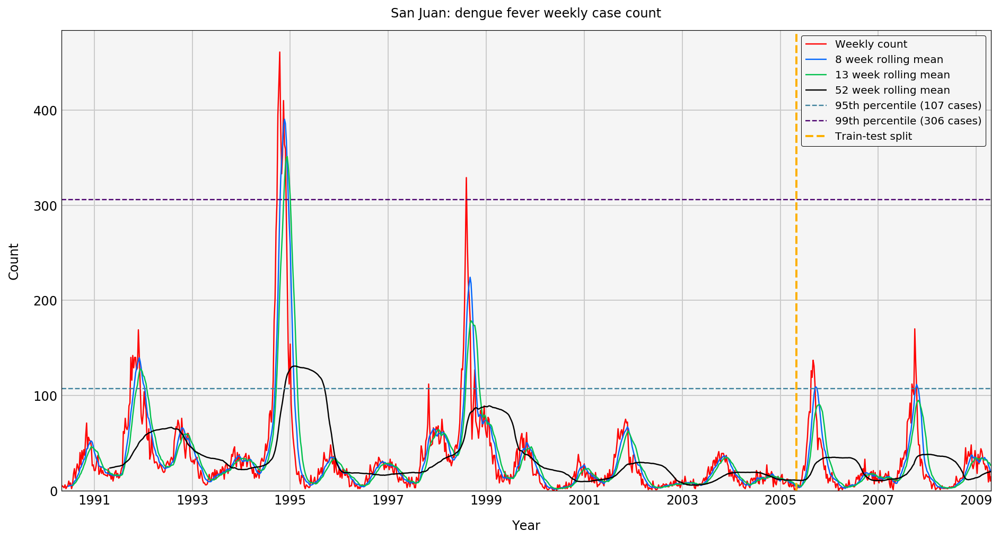

In [29]:
# Plot dengue case counts for San Juan
plot_case_counts(sj_df, 'San Juan', 'upper right')

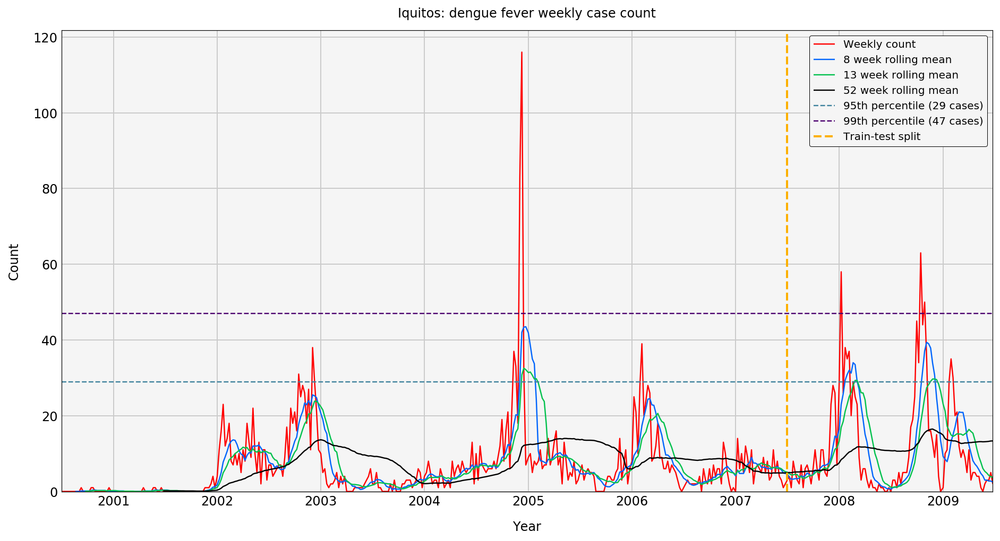

In [30]:
# Plot dengue case counts for Iquitos
plot_case_counts(iq_df, 'Iquitos', 'upper right')

## Predictor data

### Lagged dengue case counts

I'll now insert the lagged weekly dengue case counts into the model data, identified as predictors during the previous EDA.

#### San Juan

In [33]:
# Insert 4-week, 8-week, 12-week and 4-year lagged dengue case counts into dataframe for San Juan and 
# backfill NaNs created by lag at beginning of each time series for the 4, 8 and 12 week lags with the 
# first dengue case count (4)
mask = sj_df.index >= '1990-05-28'
sj_df.loc[mask,'dengue_4w'] = sj_df.total_cases[:-4].values
sj_df.dengue_4w.fillna(method='bfill', inplace=True)

sj_df.loc[mask,'dengue_8w'] = sj_df.dengue_4w[:-4].values
sj_df.dengue_8w.fillna(method='bfill', inplace=True)

sj_df.loc[mask,'dengue_12w'] = sj_df.dengue_8w[:-4].values
sj_df.dengue_12w.fillna(method='bfill', inplace=True)

# Do not backfill NaNs created with 4 year lagged case count
mask = sj_df.index >= '1994-04-30'
sj_df.loc[mask,'dengue_4y'] = sj_df.total_cases[:-208].values

In [38]:
# Inspect first 20 rows of df to ensure correct insertion of lagged weekly dengue case counts
sj_df.head(20)

,season,month,season_week,ST_mean_Tmin_11,ST_mean_Tavg_11,ST_min_Tmin_11,ST_mean_Tmax_12,RA_max_Tair_9,RA_max_Tavg_9,RA_mean_Tmin_9,RA_mean_Tair_9,RA_max_Tmax_10,RA_min_Tmin_9,RA_mean_Tavg_10,RA_mean_Tdp_10,ST_max_Tmax_11,RA_mean_RHsp_9,RA_max_Tdp_10,RA_max_RHsp_10,RA_min_RHsp_9,RA_min_Tdp_9,RA_min_Tair_10,RA_mean_Tmax_10,RA_min_Tavg_10,SA_PRECIP_GT1_7,RA_mean_RHpc_5,ST_mean_Tdtr_26,RA_max_RHpc_4,RA_min_RHpc_11,ST_max_Tdtr_26,RA_mean_Pday_4,ndvi_se_16,RA_mean_Tdtr_4,RA_min_Tdtr_4,SA_PRECIP_GT10_26,ST_PRCP_GT1_25,total_cases,dengue_4w,dengue_8w,dengue_12w,dengue_4y
week_start_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1990-04-30,1990/1991,Apr,1,21.442857,24.957143,20.6,28.171429,24.53,24.90,22.921429,23.910000,24.95,22.55,23.642857,19.098571,31.1,13.955714,19.58,14.14,13.35,18.63,23.36,24.678571,23.05,3.0,75.132857,6.442857,81.55,70.82,7.8,1.300000,0.281100,3.200000,2.6,3.0,4.0,4,4.0,4.0,4.0,NaN
1990-05-07,1990/1991,May,2,21.128571,24.471429,20.6,28.414286,24.44,24.75,22.664286,23.648571,26.45,21.65,24.185714,19.310000,28.3,13.981429,19.94,14.50,13.10,18.33,23.43,25.450000,23.70,0.0,77.818571,6.771429,80.75,73.38,7.3,0.631429,0.116900,2.428571,1.9,0.0,5.0,5,4.0,4.0,4.0,NaN
1990-05-14,1990/1991,May,3,21.600000,25.042857,20.0,27.771429,24.13,24.35,22.807143,23.697143,26.15,22.05,23.878571,19.340000,30.6,14.587143,20.00,14.58,13.69,19.02,22.57,25.092857,22.65,0.0,75.242857,6.457143,84.25,73.50,8.4,3.485714,0.127586,2.614286,1.7,0.0,3.0,4,4.0,4.0,4.0,NaN
1990-05-21,1990/1991,May,4,21.285714,24.571429,20.6,28.485714,24.53,24.80,23.221429,24.221429,25.75,22.95,23.864286,20.018571,29.4,14.287143,20.83,15.35,13.47,18.77,22.63,24.921429,22.60,0.0,77.755714,8.042857,85.35,73.55,10.0,4.557143,0.268467,2.957143,1.0,3.0,1.0,3,4.0,4.0,4.0,NaN
1990-05-28,1990/1991,May,5,21.657143,24.528571,20.0,27.857143,24.13,24.00,22.735714,23.601429,26.25,22.35,24.478571,19.694286,28.3,13.625714,20.60,15.11,13.09,18.27,23.69,25.735714,23.90,0.0,72.415714,8.257143,81.30,73.58,10.0,2.377143,0.171800,2.385714,1.8,0.0,0.0,6,4.0,4.0,4.0,NaN
1990-06-04,1990/1991,Jun,6,21.357143,24.985714,20.6,27.385714,25.65,26.10,23.750000,25.094286,25.55,22.95,23.671429,18.930000,29.4,15.460000,19.25,13.87,14.32,19.73,23.30,24.607143,23.10,1.0,75.397143,9.985714,87.47,72.03,12.2,3.271429,0.299657,2.242857,1.4,0.0,1.0,2,5.0,4.0,4.0,NaN
1990-06-11,1990/1991,Jun,7,20.900000,24.642857,20.0,28.628571,25.51,25.75,24.135714,25.127143,28.15,23.55,25.350000,20.918571,28.9,14.965714,21.97,16.50,14.61,20.00,24.21,26.950000,24.65,1.0,82.521429,8.100000,85.37,73.42,8.9,2.642857,0.129171,2.442857,1.5,0.0,3.0,4,4.0,4.0,4.0,NaN
1990-06-18,1990/1991,Jun,8,22.471429,27.000000,21.7,28.328571,25.60,25.95,23.592857,24.764286,26.95,22.55,25.350000,20.404286,33.3,15.181429,21.43,15.94,12.70,17.75,24.90,26.564286,25.10,2.0,79.954286,8.557143,84.95,74.10,10.0,1.042857,0.277475,3.085714,1.7,0.0,4.0,5,3.0,4.0,4.0,NaN
1990-06-25,1990/1991,Jun,9,22.542857,26.242857,21.7,31.528571,24.66,24.85,22.964286,24.300000,27.75,21.65,24.900000,20.561429,30.6,13.742857,21.82,16.32,11.43,16.08,23.92,26.207143,24.10,4.0,79.817143,8.525000,86.65,72.62,11.1,3.598571,0.198500,2.200000,1.6,0.0,3.0,10,6.0,4.0,4.0,NaN


#### Iquitos

In [39]:
# Insert 4-week, 8-week, 12-week and 4-year lagged dengue case counts into dataframe for Iquitos and 
# backfill NaNs created by lag at beginning of each time series for the 4, 8 and 12 week lags with the 
# first dengue case count (0)

mask = iq_df.index >= '2000-07-29'
iq_df.loc[mask,'dengue_4w'] = iq_df.total_cases[:-4].values
iq_df.dengue_4w.fillna(method='bfill', inplace=True)

iq_df.loc[mask,'dengue_8w'] = iq_df.dengue_4w[:-4].values
iq_df.dengue_8w.fillna(method='bfill', inplace=True)

iq_df.loc[mask,'dengue_12w'] = iq_df.dengue_8w[:-4].values
iq_df.dengue_12w.fillna(method='bfill', inplace=True)

In [45]:
# Inspect first 20 rows of df to ensure correct insertion of lagged weekly dengue case counts
iq_df.head(20)

,season,month,season_week,RA_mean_RHsp_4,ST_min_Tmin_4,RA_mean_Tdp_4,RA_max_RHsp_4,RA_mean_Tmin_4,RA_max_Tdp_4,ST_mean_Tmin_4,RA_min_Tmin_4,RA_max_Tdtr_18,RA_min_RHsp_4,RA_min_Tdp_4,RA_mean_Tdtr_18,RA_min_Tdtr_16,RA_max_Tmax_15,RA_mean_Tair_8,ST_mean_Tmax_7,RA_mean_Tavg_8,RA_mean_Tmax_15,RA_max_Tavg_8,RA_min_Tair_8,RA_min_Tavg_4,RA_max_Tair_7,ndvi_sw_15,SA_max_Pday_4,ST_min_Tdtr_22,ndvi_ne_15,ndvi_nw_15,SA_PRECIP_GT30_4,RA_min_RHpc_15,RA_max_Pday_19,SA_mean_Pday_17,ndvi_se_23,ST_max_Tmax_24,RA_mean_Pday_18,SA_PRECIP_GT10_17,RA_mean_RHpc_18,SA_PRECIP_GT1_26,RA_max_RHpc_18,ST_mean_Tavg_25,total_cases,dengue_4w,dengue_8w,dengue_12w
week_start_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-07-01,2000/2001,Jul,1,16.621429,20.9,22.021429,17.39,20.378571,22.77,21.300000,19.05,9.3,15.79,21.20,7.200000,9.0,33.35,23.535714,31.375000,24.464286,30.721429,25.55,23.12,23.35,24.74,0.230114,15.37,11.0,0.219786,0.222414,0.0,85.10,21.40,13.118571,0.236317,33.6,19.320000,4.0,94.908571,6.0,98.98,27.425000,0,0.0,0.0,0.0
2000-07-08,2000/2001,Jul,2,16.325714,21.0,21.681429,18.28,20.535714,23.50,21.280000,18.35,9.2,14.44,19.77,5.685714,3.0,30.75,23.682857,30.500000,24.685714,28.421429,25.55,22.77,23.75,23.45,0.231000,41.53,13.0,0.250425,0.222080,1.0,90.63,76.30,9.164286,0.264886,32.0,14.808571,2.0,93.875714,6.0,98.88,27.338889,0,0.0,0.0,0.0
2000-07-15,2000/2001,Jul,3,16.835714,19.8,22.217143,18.65,20.907143,23.93,20.833333,18.65,11.9,15.19,20.60,10.714286,4.3,29.55,22.785714,32.800000,23.942857,27.192857,25.35,22.41,24.00,24.22,0.121743,21.47,10.0,0.145757,0.136329,0.0,91.65,31.20,11.267143,0.419967,34.0,7.482857,3.0,87.910000,4.0,94.75,27.252778,0,0.0,0.0,0.0
2000-07-22,2000/2001,Jul,4,16.504286,20.7,21.877143,17.19,20.121429,22.52,21.000000,17.95,13.3,15.72,21.10,8.871429,3.5,31.75,23.307143,31.400000,24.700000,28.421429,26.70,21.95,24.70,23.46,0.306067,10.45,10.7,0.291257,0.335267,0.0,86.90,14.80,16.944286,0.231000,35.5,24.291429,5.0,91.770000,7.0,99.45,27.166667,0,0.0,0.0,0.0
2000-07-29,2000/2001,Jul,5,17.182857,20.7,22.542857,17.69,20.592857,23.00,20.925000,19.45,9.7,16.26,21.63,7.400000,4.6,31.15,23.110000,32.600000,23.942857,30.178571,24.95,22.43,23.45,25.40,0.296817,32.36,9.5,0.271857,0.191300,2.0,88.30,133.70,14.692857,0.248071,36.0,6.524286,2.0,93.142857,4.0,96.90,27.933333,0,0.0,0.0,0.0
2000-08-05,2000/2001,Aug,6,16.140000,18.0,21.430000,17.76,20.178571,23.05,20.766667,18.95,7.9,12.42,17.43,5.600000,5.2,30.35,23.924286,31.420000,25.364286,27.950000,27.60,22.89,22.45,24.36,0.268986,9.58,10.3,0.259933,0.272267,0.0,92.12,15.87,11.857143,0.226700,33.0,10.628571,2.0,96.242857,4.0,98.85,28.025000,0,0.0,0.0,0.0
2000-08-12,2000/2001,Aug,7,14.451429,14.7,19.694286,16.68,18.535714,22.10,18.833333,15.45,10.5,12.45,17.45,7.157143,5.2,31.85,23.595714,32.625000,24.957143,29.550000,26.25,22.55,22.95,25.02,0.346560,25.89,10.2,0.267271,0.332020,0.0,91.38,18.00,11.887143,0.322600,33.0,6.585714,4.0,92.010000,4.0,96.70,26.775000,0,0.0,0.0,0.0
2000-08-19,2000/2001,Aug,8,14.265714,17.0,19.511429,15.85,18.264286,21.32,19.980000,15.35,9.2,12.44,17.40,7.928571,3.4,29.55,23.724286,31.800000,25.664286,27.435714,27.25,22.87,21.10,23.79,0.170800,25.61,11.6,0.191100,0.152771,0.0,90.47,20.40,8.695714,0.387686,33.0,8.128571,3.0,92.025714,6.0,97.48,26.380000,0,0.0,0.0,0.0
2000-08-26,2000/2001,Aug,9,14.750000,19.0,20.030000,17.06,20.150000,22.43,20.800000,17.95,8.7,13.25,18.38,6.771429,3.0,30.55,23.451429,30.583333,24.464286,28.321429,25.55,23.15,24.65,23.60,0.244971,51.87,9.6,0.198200,0.272886,1.0,88.98,18.80,20.651429,0.222200,34.0,7.021429,6.0,94.447143,7.0,98.70,26.933333,0,0.0,0.0,0.0


## Train-Test Split

Split data into train-test sets, and define dataframes for predictor and outcome data.

I'll also insert the seasonal cycle (calculated from the training data only to simulate a pure hold-out test set), identified as a potential predictor during the EDA phase.  

### San Juan 

In [47]:
# Slice train (15 years) and test data (4 years) by start and end dates
sj_train_df = sj_df.loc['1990-04-30':'2005-04-23',:]
sj_test_df = sj_df.loc['2005-04-30':'2009-04-23',:]

# Print shape of resulting data frames
print(sj_train_df.shape)
print(sj_test_df.shape)

(780, 41)
(208, 41)


In [48]:
# Calculate mean of total_cases for each season_week (from training data only), to represent the seasonal cycle 
# Insert repeated seasonal cycle into train and test data
sj_weekly_means = list(round(sj_train_df.groupby(['season_week'])['total_cases'].mean(),2))
sj_train_df = sj_train_df.copy()
sj_test_df = sj_test_df.copy()
sj_train_df.insert(len(sj_train_df.columns)-1, 'seasonal_cycle', sj_weekly_means * 15)
sj_test_df.insert(len(sj_test_df.columns)-1, 'seasonal_cycle', sj_weekly_means * 4)

In [50]:
# Define training and test, predictor and outcome data.  Omit season and month fields.
sj_X_train_df = sj_train_df.iloc[:,2:].drop('total_cases', axis=1)
sj_y_train_df = sj_train_df[['total_cases']]
sj_X_test_df = sj_test_df.iloc[:,2:].drop('total_cases', axis=1)
sj_y_test_df = sj_test_df[['total_cases']]

# Print shape of training and test predictor and outcome dfs
print()
print('Shape of X_train:', sj_X_train_df.shape)
print('Shape of y_train:', sj_y_train_df.shape)
print('Shape of X_test:', sj_X_test_df.shape)
print('Shape of y_test:', sj_y_test_df.shape)


Shape of X_train: (780, 39)
Shape of y_train: (780, 1)
Shape of X_test: (208, 39)
Shape of y_test: (208, 1)


Shape of dfs is aligned with expectations.

### Iquitos

In [51]:
# Slice train (7 years) and test data (2 years) by start and end dates
iq_train_df = iq_df.loc['2000-07-01':'2007-06-25',:]
iq_test_df = iq_df.loc['2007-07-01':'2009-06-25',:]

print(iq_train_df.shape)
print(iq_test_df.shape)

(364, 46)
(104, 46)


Insert seasonal cycle in train and test data, as calculated from train data.

In [52]:
# Calculate mean of total_cases for each season_week (from training data only), to represent the seasonal cycle 
# Insert repeated seasonal cycle into train and test data
iq_weekly_means = list(round(iq_train_df.groupby(['season_week'])['total_cases'].mean(),2))
iq_train_df = iq_train_df.copy()
iq_test_df = iq_test_df.copy()
iq_train_df.insert(len(iq_train_df.columns)-1, 'seasonal_cycle', iq_weekly_means * 7)
iq_test_df.insert(len(iq_test_df.columns)-1, 'seasonal_cycle', iq_weekly_means * 2)

In [53]:
# Define training and test, predictor and outcome data.  Omit season and month fields.
iq_X_train_df = iq_train_df.iloc[:,2:].drop('total_cases', axis=1)
iq_y_train_df = iq_train_df[['total_cases']]
iq_X_test_df = iq_test_df.iloc[:,2:].drop('total_cases', axis=1)
iq_y_test_df = iq_test_df[['total_cases']]

# Print shape of training and test predictor and outcome dfs
print()
print('Shape of X_train:', iq_X_train_df.shape)
print('Shape of y_train:', iq_y_train_df.shape)
print('Shape of X_test:', iq_X_test_df.shape)
print('Shape of y_test:', iq_y_test_df.shape)


Shape of X_train: (364, 44)
Shape of y_train: (364, 1)
Shape of X_test: (104, 44)
Shape of y_test: (104, 1)


Shape of dfs is aligned with expectations.

## Review correlations within training predictor data

I'm conscious that a lot of the predictor fields will be strongly correlated e.g. max, min and average temperature fields, and am keen to understand the extent of this correlation - especially since multi linear regression requires independence of predictors. 

### San Juan

In [54]:
# Verify that correlations between total_cases and lagged predictors are aligned
# with lagged correlation analysis calculated in Part 3 of project
sj_train_df.corr()[['total_cases']].head()

,total_cases
season_week,-0.003333
ST_mean_Tmin_11,0.364193
ST_mean_Tavg_11,0.358469
ST_min_Tmin_11,0.346755
ST_mean_Tmax_12,0.325652


The correlation coefficients above remain aligned with my analysis in Part 3.

In [57]:
# Define a function to plot a heatmap of the correlation matrix for features within the training data

def plot_correlation_heat_map(df, city):
    '''This function accepts a dataframe of correlation coefficients between a range of features
    and plots a heatmap of their values.  The city string argument is used to customise the chart title.'''

    # Set the default matplotlib figure size:
    fig, ax = plt.subplots(figsize=(12,11))

    # Generate a mask for the upper triangle 
    mask = np.zeros_like(df, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    
    # Define title string using the city argument passed to the function
    title = f'{city}: Heatmap of correlation coefficients between predictors (and target)'
    
    # Plot the heatmap with seaborn.
    ax = sns.heatmap(df, mask=mask, vmin=-1, vmax=1, linewidths=0.5, linecolor='white',
                     center=0, cmap='RdBu_r', )
    ax.set_facecolor('white')
    ax.set_title(title)
    
    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=10, rotation=85)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=10, rotation=0)
    
    # Change font size of colormap
    cax = plt.gcf().axes[-1]
    cax.tick_params(labelsize=12) ;

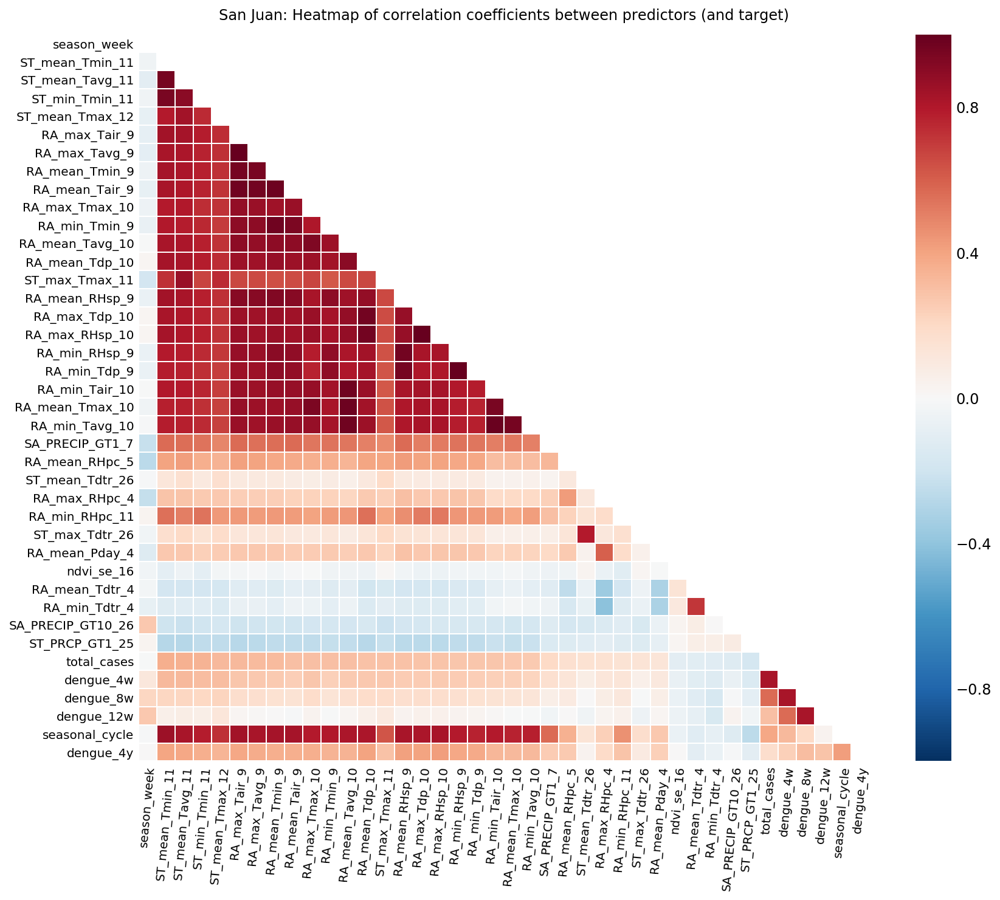

In [58]:
# Plot a heatmap of the feature correlation matrix
plot_correlation_heat_map(sj_train_df.corr(), 'San Juan')

As expected, there are strong correlations between several predictors.  I'll include a step in my pipeline to transform these into independent predictors through PCA for my multi linear regression modeling.  Inclusion of this as a step in the pipeline will also facilitate efficient analysis of the impacts of this transformation on model performance.

### Iquitos

In [59]:
# Verify that correlations between total_cases and lagged predictors are aligned
# with lagged correlation analysis from Part 3 of project
iq_train_df.corr()[['total_cases']].head()

,total_cases
season_week,0.042484
RA_mean_RHsp_4,0.237571
ST_min_Tmin_4,0.236060
RA_mean_Tdp_4,0.230374
RA_max_RHsp_4,0.225306


The correlation coefficients above align with my analysis in Part 3.

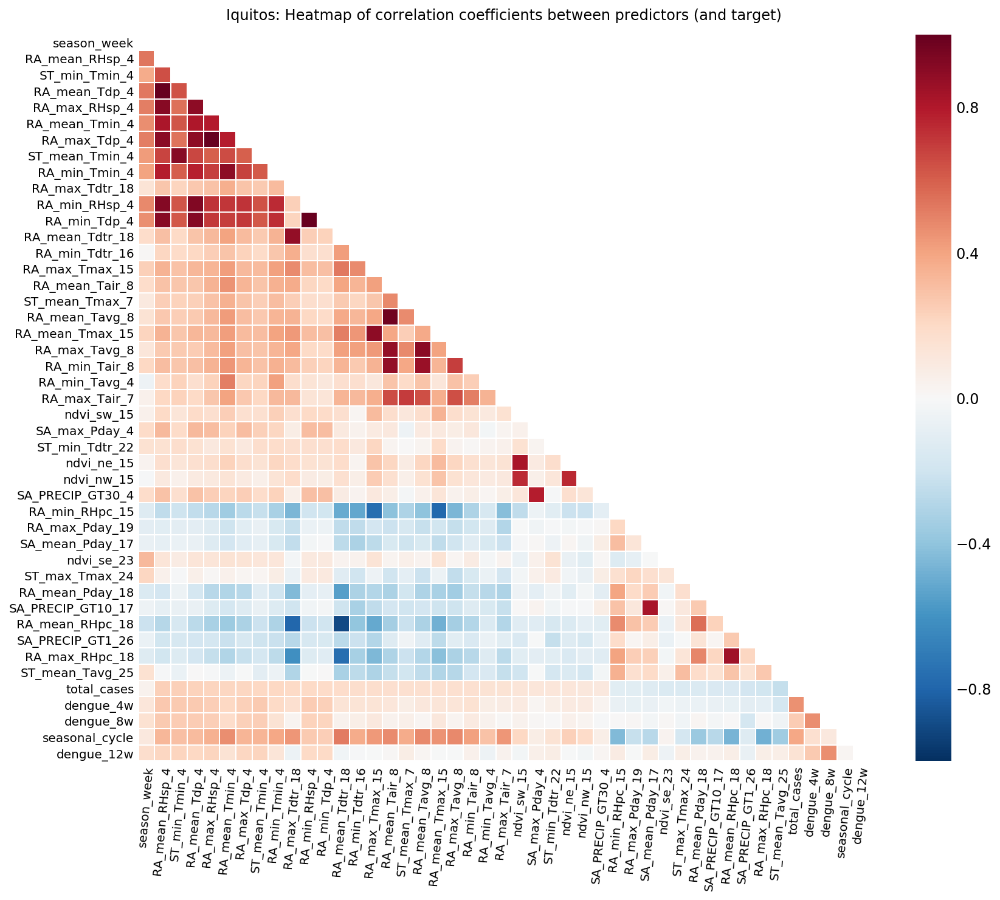

In [60]:
# Plot a heatmap of the feature correlation matrix
plot_correlation_heat_map(iq_train_df.corr(), 'Iquitos')

Again, as expected, there are strong correlations between several predictors.  I'll include a step in my pipeline to transform these into independent predictors through PCA for my multi linear regression modeling.  Inclusion of this as a step in the pipeline will also facilitate efficient analysis of the impacts of this transformation on model performance.

# Model creation

## Predictor data: PCA 

The analysis below will inform me how many principal components are needed to explain the variance in the training predictor dataset however, I won't be transforming the data to these principal components here.  I'll conduct this transformation in a pipeline when I create my models.

### San Juan

<b> PCA without the lagged 4 year dengue fever case count predictor</b>

In [61]:
# Standardise training predictor data, excluding the 4 year lag field 
# (as this field contains 4 years of null values)
sj_ss = StandardScaler()
sj_X_train_ss = pd.DataFrame(sj_ss.fit_transform(sj_X_train_df.iloc[:,:-1]), 
                             columns=sj_X_train_df.columns[:-1])

# Verify that mean and std of standardised training feature data is 0 and 1 respectively
print(sj_X_train_ss.mean().mean())
print(sj_X_train_ss.std().mean())

-1.0334925298227057e-16
1.0006416426710902


In [62]:
# Fit principal components on standardised training feature data to reduce dimensions
# and drive predictor independence
sj_pca = PCA(n_components=sj_X_train_ss.shape[1])
sj_pca.fit(sj_X_train_ss)

# Review PCA information
print(f'Number of principal components: \n{sj_pca.n_components_}')
print(f'\nExplained variance: \n{np.round(sj_pca.explained_variance_,3)}')   #eigenvalues
print(f'\nExplained variance ratio: \n {np.round(sj_pca.explained_variance_ratio_,3)}')
sj_cum_var_exp = [round(elem) for elem in np.cumsum(sj_pca.explained_variance_ratio_)*100]
print(f'\nComponent number with cumulative % variance explained: \n {list(enumerate(sj_cum_var_exp, start=1))}')

Number of principal components: 
38

Explained variance: 
[1.9642e+01 2.7060e+00 2.3740e+00 1.8300e+00 1.3850e+00 1.0770e+00
 9.0700e-01 9.0000e-01 8.6600e-01 7.8800e-01 7.0200e-01 6.5000e-01
 5.6300e-01 4.9500e-01 4.2400e-01 3.8400e-01 3.5800e-01 3.0300e-01
 2.7900e-01 2.4300e-01 2.3300e-01 1.9500e-01 1.7400e-01 1.5600e-01
 1.1600e-01 8.4000e-02 4.9000e-02 3.9000e-02 3.1000e-02 2.4000e-02
 2.1000e-02 1.5000e-02 1.1000e-02 8.0000e-03 7.0000e-03 5.0000e-03
 2.0000e-03 1.0000e-03]

Explained variance ratio: 
 [0.516 0.071 0.062 0.048 0.036 0.028 0.024 0.024 0.023 0.021 0.018 0.017
 0.015 0.013 0.011 0.01  0.009 0.008 0.007 0.006 0.006 0.005 0.005 0.004
 0.003 0.002 0.001 0.001 0.001 0.001 0.001 0.    0.    0.    0.    0.
 0.    0.   ]

Component number with cumulative % variance explained: 
 [(1, 52.0), (2, 59.0), (3, 65.0), (4, 70.0), (5, 73.0), (6, 76.0), (7, 79.0), (8, 81.0), (9, 83.0), (10, 85.0), (11, 87.0), (12, 89.0), (13, 90.0), (14, 92.0), (15, 93.0), (16, 94.0), (17, 95.0), (18

In [75]:
# Define a function to plot the cumulative variance explained by the principal components

def plot_pca_var_explained(cum_var_exp, city):
    '''This function accepts an array of cumulative variance explained percentages and a 
    city string as arguments, and plots the cumulative variance explained as a line plot.
    The city string is used to customise the chart title.'''
    
    plt.figure(figsize=(8, 8))

    comps = list(range(1, len(cum_var_exp)+1))

    plt.plot(comps, cum_var_exp, lw=3, color='g')

    plt.axhline(y=0, linewidth=2, color='crimson', ls='dashed')
    plt.axhline(y=100, linewidth=2, color='crimson', ls='dashed')

    ax = plt.gca()
    ax.set_xlim(np.min(comps), np.max(comps))
    ax.set_ylim([-2, 102])

    ax.set_ylabel('Percentage (%)')
    ax.set_xlabel('Components')
    ax.set_xticks(list(range(1,41,2)))
    ax.set_title(f'{city}: Cumulative percentage variance explained by principal components') ;

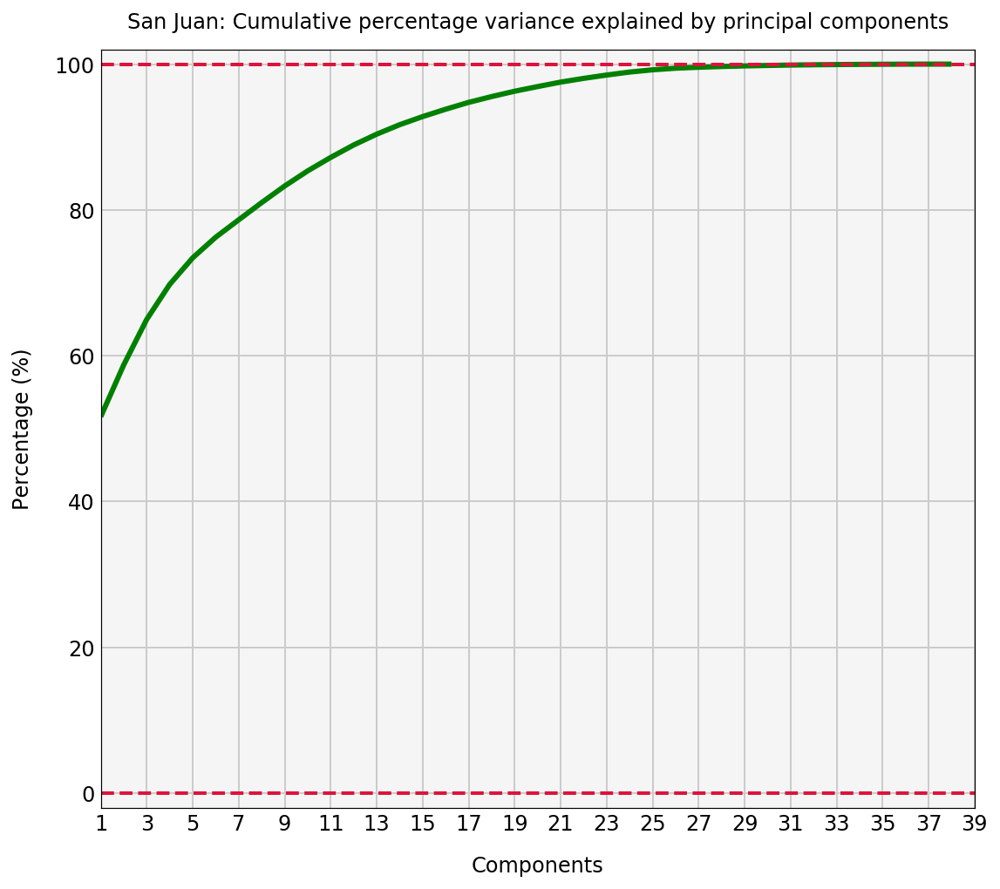

In [76]:
# Call function to plot cumulative variance explained vs number of components
plot_pca_var_explained(np.cumsum(sj_pca.explained_variance_ratio_)*100, 'San Juan')

17 principal components explain 95.0% of the variance in the standardised predictor training data, with the 4 year lagged dengue case count predictor excluded.

In [77]:
# Project standardised training feature data onto all principal components,
# and truncate transformed data at the 17th principal component
pca_cols = ['PC_'+str(i) for i in list(range(1, sj_X_train_ss.shape[1]+1))]
sj_X_train_pca = pd.DataFrame(sj_pca.transform(sj_X_train_ss), columns=pca_cols).iloc[:,:17]
sj_X_train_pca.head()

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,PC_11,PC_12,PC_13,PC_14,PC_15,PC_16,PC_17
0,7.847148,-1.787428,0.216365,0.435816,2.186260,0.862957,1.550505,1.584632,0.354887,-0.488355,0.178242,1.164481,0.107559,0.409988,0.115170,-0.072254,-0.199341
1,7.664602,-0.574712,-0.747317,-0.350589,1.066496,-1.734454,-0.020577,-1.161930,0.080086,0.134092,-0.190587,0.005950,0.187654,0.908136,0.598841,0.223307,-0.070101
2,7.557464,-0.010286,-1.532754,0.086203,1.153708,-1.251388,-0.515027,-0.011957,0.200221,0.472888,-0.141286,1.036737,-0.608566,0.683223,-0.077604,-0.235382,0.384546
3,6.860400,0.429735,-2.423046,1.594457,-0.084062,1.786610,-0.198992,1.648146,0.497961,-0.325474,-0.695018,0.625031,0.175785,1.419945,0.267864,-0.799308,0.429551
4,7.250092,-0.209870,-1.552522,2.395730,-0.213604,-0.303527,-2.053418,0.104525,-0.140084,0.922732,0.480699,0.863192,1.029317,1.402799,0.176034,0.010585,0.301342


In [78]:
# Verify 0 correlation between the principal components
np.allclose(np.corrcoef(sj_X_train_pca.T),np.eye(len(sj_X_train_pca.T)))

True

This can also be verified by plotting the correlation heatmap of the principal components (in the code below).

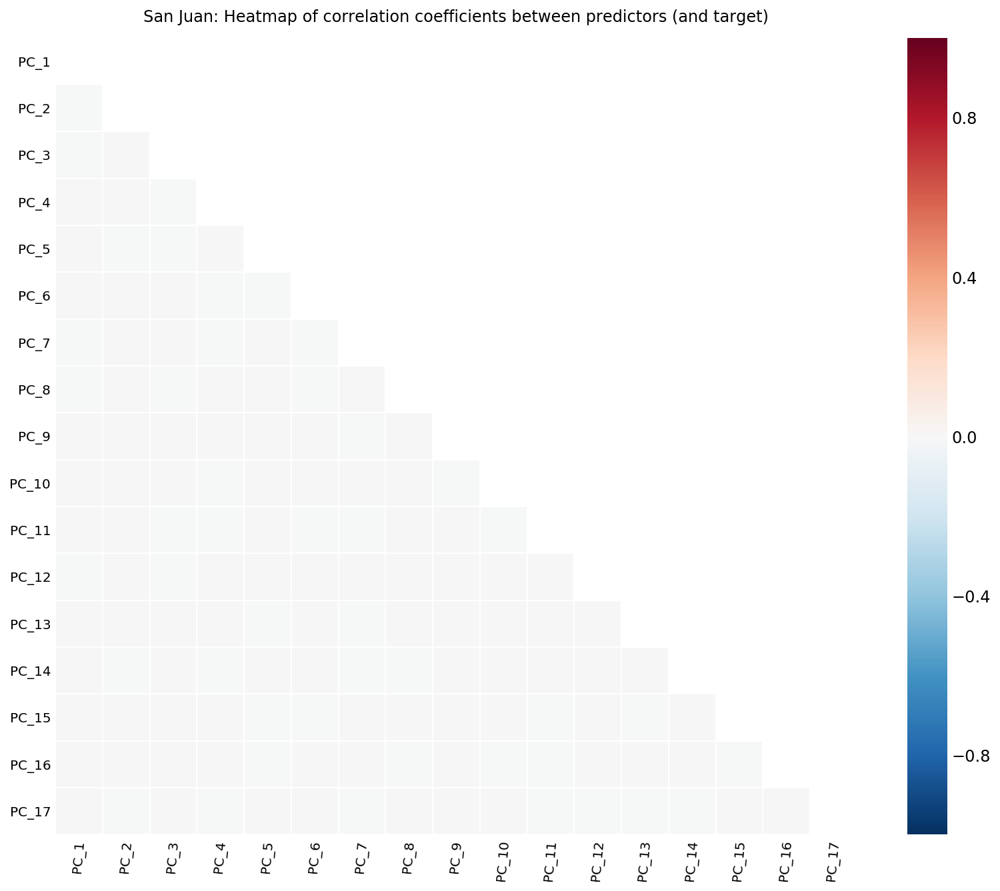

In [80]:
# Plot correlation heatmap of principal components
plot_correlation_heat_map(pd.DataFrame(sj_X_train_pca.corr(), columns=sj_X_train_pca.columns), 'San Juan')

<b> PCA with the lagged 4 year dengue fever case count predictor</b>

In [81]:
# Standardise training predictor data, including the 4 year lag field
# Exclude first 4 years of NaNs at beginning of 4-year lagged data
sj_4y_ss = StandardScaler()
sj_X_train_4y_ss = pd.DataFrame(sj_4y_ss.fit_transform(sj_X_train_df.loc['1994-04-30':,:]), 
                                columns=sj_X_train_df.columns)

# Verify that mean and std of standardised training feature data is 0 and 1 respectively
print(sj_X_train_4y_ss.mean().mean())
print(sj_X_train_4y_ss.std().mean())

2.5670299269394637e-17
1.0008752736905397


In [82]:
# Fit principal components on standardised training feature data to reduce dimensions
# and drive feature independence
sj_4y_pca = PCA(n_components=sj_X_train_4y_ss.shape[1])
sj_4y_pca.fit(sj_X_train_4y_ss)

# Review PCA information
print(f'Number of principal components: \n{sj_4y_pca.n_components_}')
print(f'\nExplained variance: \n{np.round(sj_4y_pca.explained_variance_,3)}')   #eigenvalues
print(f'\nExplained variance ratio: \n {np.round(sj_4y_pca.explained_variance_ratio_,3)}')
sj_cum_var_exp = [round(elem) for elem in np.cumsum(sj_4y_pca.explained_variance_ratio_)*100]
print(f'\nComponent number with cumulative % variance explained: \n {list(enumerate(sj_cum_var_exp, start=1))}')

Number of principal components: 
39

Explained variance: 
[2.004e+01 2.806e+00 2.204e+00 1.884e+00 1.443e+00 1.062e+00 9.650e-01
 9.230e-01 8.870e-01 8.070e-01 7.400e-01 6.460e-01 6.170e-01 5.390e-01
 5.050e-01 4.370e-01 3.530e-01 3.250e-01 2.860e-01 2.600e-01 2.270e-01
 2.080e-01 1.920e-01 1.680e-01 1.520e-01 1.090e-01 8.100e-02 4.800e-02
 3.800e-02 2.800e-02 2.200e-02 1.900e-02 1.400e-02 1.200e-02 9.000e-03
 7.000e-03 5.000e-03 2.000e-03 1.000e-03]

Explained variance ratio: 
 [0.513 0.072 0.056 0.048 0.037 0.027 0.025 0.024 0.023 0.021 0.019 0.017
 0.016 0.014 0.013 0.011 0.009 0.008 0.007 0.007 0.006 0.005 0.005 0.004
 0.004 0.003 0.002 0.001 0.001 0.001 0.001 0.    0.    0.    0.    0.
 0.    0.    0.   ]

Component number with cumulative % variance explained: 
 [(1, 51.0), (2, 58.0), (3, 64.0), (4, 69.0), (5, 73.0), (6, 75.0), (7, 78.0), (8, 80.0), (9, 82.0), (10, 85.0), (11, 86.0), (12, 88.0), (13, 90.0), (14, 91.0), (15, 92.0), (16, 93.0), (17, 94.0), (18, 95.0), (19, 96.0), (2

18 principal components explain 95.0% of the variance in the standardised feature training data, with the 4 year lagged dengue case count predictor included.

In [83]:
# Project standardised training feature data onto all principal components,
# and truncate transformed data at the 23rd principal component
pca_cols = ['PC_'+str(i) for i in list(range(1, sj_X_train_4y_ss.shape[1]+1))]
sj_X_train_4y_pca = pd.DataFrame(sj_4y_pca.transform(sj_X_train_4y_ss), columns=pca_cols).iloc[:,:17]

# Verify 0 correlation between the principal components
np.allclose(np.corrcoef(sj_X_train_4y_pca.T),np.eye(len(sj_X_train_4y_pca.T)))


True

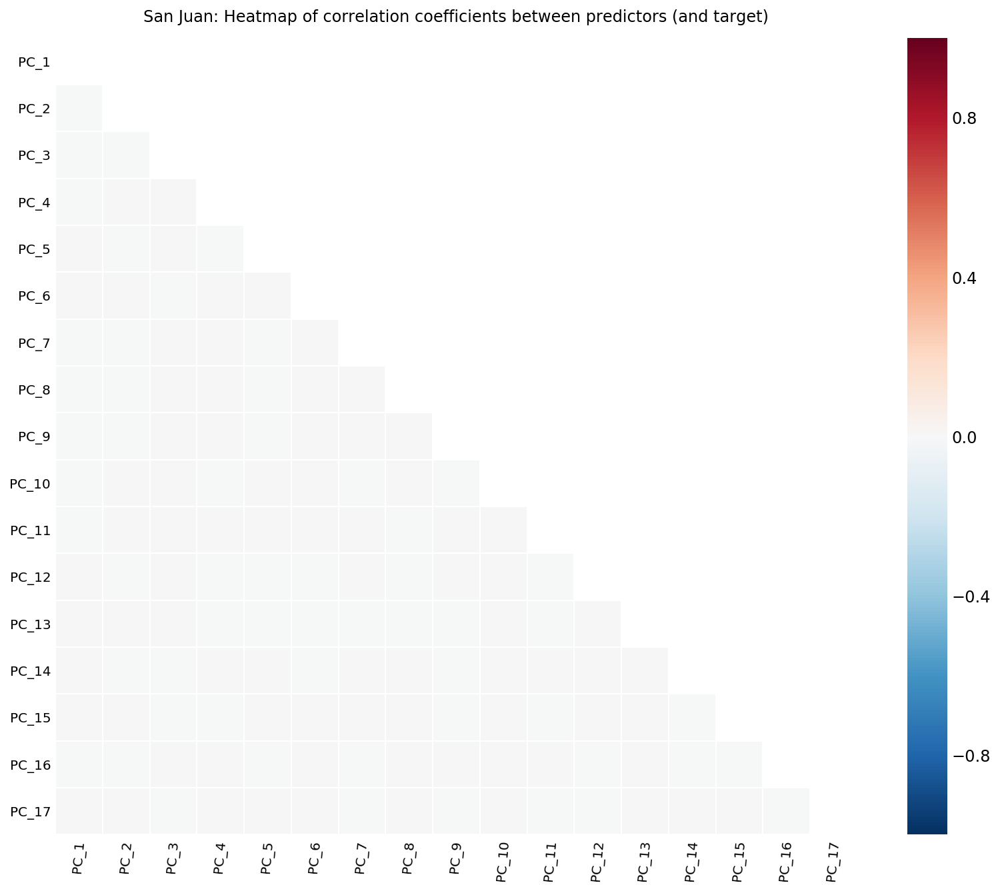

In [84]:
# Plot correlation heatmap of principal components
plot_correlation_heat_map(pd.DataFrame(sj_X_train_4y_pca.corr(), 
                                       columns=sj_X_train_4y_pca.columns), 'San Juan')

### Iquitos

In [85]:
# Standardise training predictor data
iq_ss = StandardScaler()
iq_X_train_ss = pd.DataFrame(iq_ss.fit_transform(iq_X_train_df), 
                             columns=iq_X_train_df.columns)

# Verify that mean and std of standardised training feature data is 0 and 1 respectively
print(iq_X_train_ss.mean().mean())
print(iq_X_train_ss.std().mean())

9.237294197671151e-17
1.0013764631429274


In [86]:
# Fit principal components on standardised training feature data to reduce dimensions
# and drive feature independence
iq_pca = PCA(n_components=iq_X_train_ss.shape[1])
iq_pca.fit(iq_X_train_ss)

# Review PCA information
print(f'Number of principal components: \n{iq_pca.n_components_}')
print(f'\nExplained variance: \n{np.round(iq_pca.explained_variance_,3)}')   #eigenvalues
print(f'\nExplained variance ratio: \n {np.round(iq_pca.explained_variance_ratio_,3)}')
iq_cum_var_exp = [round(elem) for elem in np.cumsum(iq_pca.explained_variance_ratio_)*100]
print(f'\nComponent number with cumulative % variance explained: \n {list(enumerate(iq_cum_var_exp, start=1))}')

Number of principal components: 
44

Explained variance: 
[1.2604e+01 5.2790e+00 2.7160e+00 2.5680e+00 1.9200e+00 1.6380e+00
 1.5530e+00 1.4340e+00 1.2170e+00 1.0970e+00 1.0190e+00 9.8400e-01
 9.2300e-01 8.5400e-01 7.9900e-01 7.5800e-01 7.3200e-01 5.9900e-01
 5.8300e-01 5.1100e-01 4.9300e-01 4.6500e-01 4.1700e-01 4.0500e-01
 3.7100e-01 2.7500e-01 2.5700e-01 2.3800e-01 2.1300e-01 2.0900e-01
 1.9400e-01 1.5600e-01 1.3600e-01 9.9000e-02 8.7000e-02 7.7000e-02
 6.4000e-02 6.0000e-02 5.3000e-02 3.7000e-02 2.2000e-02 4.0000e-03
 1.0000e-03 0.0000e+00]

Explained variance ratio: 
 [0.286 0.12  0.062 0.058 0.044 0.037 0.035 0.033 0.028 0.025 0.023 0.022
 0.021 0.019 0.018 0.017 0.017 0.014 0.013 0.012 0.011 0.011 0.009 0.009
 0.008 0.006 0.006 0.005 0.005 0.005 0.004 0.004 0.003 0.002 0.002 0.002
 0.001 0.001 0.001 0.001 0.001 0.    0.    0.   ]

Component number with cumulative % variance explained: 
 [(1, 29.0), (2, 41.0), (3, 47.0), (4, 53.0), (5, 57.0), (6, 61.0), (7, 64.0), (8, 67.0), (9, 

25 principal components explain 95.0% of the variance in the standardised feature training data..

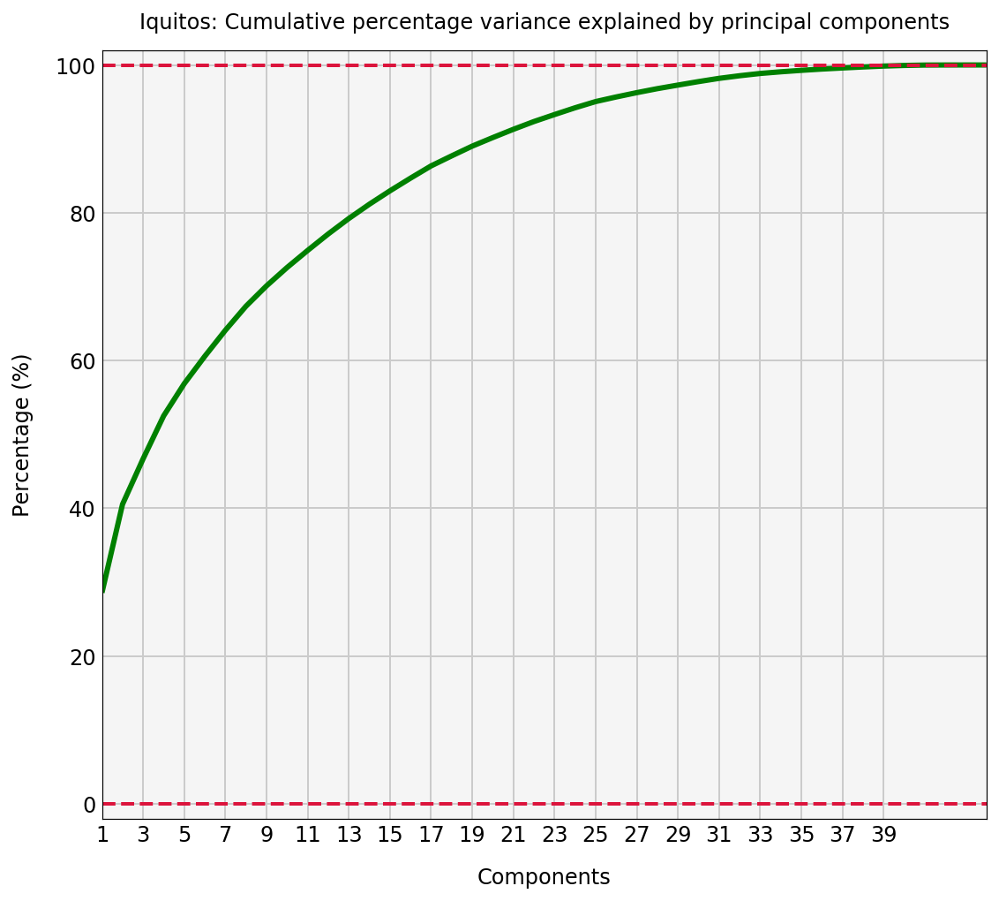

In [87]:
# Call function to plot cumulative variance explained vs number of components
plot_pca_var_explained(np.cumsum(iq_pca.explained_variance_ratio_)*100, 'Iquitos')

For Iquitos, we see that 25 principal components are sufficient to explain 95% of the variance within training data set.

## Modeling

### San Juan

#### Multi Linear Regression Model

<b> Multi Linear regression, excluding the 4-year time lagged dengue counts</b>

In [88]:
sj_X_train_df.head()

,season_week,ST_mean_Tmin_11,ST_mean_Tavg_11,ST_min_Tmin_11,ST_mean_Tmax_12,RA_max_Tair_9,RA_max_Tavg_9,RA_mean_Tmin_9,RA_mean_Tair_9,RA_max_Tmax_10,RA_min_Tmin_9,RA_mean_Tavg_10,RA_mean_Tdp_10,ST_max_Tmax_11,RA_mean_RHsp_9,RA_max_Tdp_10,RA_max_RHsp_10,RA_min_RHsp_9,RA_min_Tdp_9,RA_min_Tair_10,RA_mean_Tmax_10,RA_min_Tavg_10,SA_PRECIP_GT1_7,RA_mean_RHpc_5,ST_mean_Tdtr_26,RA_max_RHpc_4,RA_min_RHpc_11,ST_max_Tdtr_26,RA_mean_Pday_4,ndvi_se_16,RA_mean_Tdtr_4,RA_min_Tdtr_4,SA_PRECIP_GT10_26,ST_PRCP_GT1_25,dengue_4w,dengue_8w,dengue_12w,seasonal_cycle,dengue_4y
week_start_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1990-04-30,1,21.442857,24.957143,20.6,28.171429,24.53,24.90,22.921429,23.910000,24.95,22.55,23.642857,19.098571,31.1,13.955714,19.58,14.14,13.35,18.63,23.36,24.678571,23.05,3.0,75.132857,6.442857,81.55,70.82,7.8,1.300000,0.281100,3.200000,2.6,3.0,4.0,4.0,4.0,4.0,11.13,NaN
1990-05-07,2,21.128571,24.471429,20.6,28.414286,24.44,24.75,22.664286,23.648571,26.45,21.65,24.185714,19.310000,28.3,13.981429,19.94,14.50,13.10,18.33,23.43,25.450000,23.70,0.0,77.818571,6.771429,80.75,73.38,7.3,0.631429,0.116900,2.428571,1.9,0.0,5.0,4.0,4.0,4.0,11.93,NaN
1990-05-14,3,21.600000,25.042857,20.0,27.771429,24.13,24.35,22.807143,23.697143,26.15,22.05,23.878571,19.340000,30.6,14.587143,20.00,14.58,13.69,19.02,22.57,25.092857,22.65,0.0,75.242857,6.457143,84.25,73.50,8.4,3.485714,0.127586,2.614286,1.7,0.0,3.0,4.0,4.0,4.0,11.13,NaN
1990-05-21,4,21.285714,24.571429,20.6,28.485714,24.53,24.80,23.221429,24.221429,25.75,22.95,23.864286,20.018571,29.4,14.287143,20.83,15.35,13.47,18.77,22.63,24.921429,22.60,0.0,77.755714,8.042857,85.35,73.55,10.0,4.557143,0.268467,2.957143,1.0,3.0,1.0,4.0,4.0,4.0,11.00,NaN
1990-05-28,5,21.657143,24.528571,20.0,27.857143,24.13,24.00,22.735714,23.601429,26.25,22.35,24.478571,19.694286,28.3,13.625714,20.60,15.11,13.09,18.27,23.69,25.735714,23.90,0.0,72.415714,8.257143,81.30,73.58,10.0,2.377143,0.171800,2.385714,1.8,0.0,0.0,4.0,4.0,4.0,13.20,NaN


In [97]:
# Define Linear Regression pipeline
# Optional PCA step included in pipeline (defined with 17 principal components, as per analysis above)
LR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=17)),       
                        ('linreg', LinearRegression())])

In [98]:
# Fit Linear Regression pipeline to data, excluding the 4y lagged dengue case field
LR_Pipeline.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df)

# Save cross validation scores to scores list
scores = cross_val_score(LR_Pipeline, sj_X_train_df.iloc[:,:-1], sj_y_train_df, 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]

# Calculate mse on test data
mse = mean_squared_error(sj_y_test_df, LR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(LR_Pipeline.score(sj_X_train_df.iloc[:,:-1], sj_y_train_df),3)}')
print(f'R2 score on test data: {round(LR_Pipeline.score(sj_X_test_df.iloc[:,:-1], sj_y_test_df),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.705, 0.531, 0.755, 0.744, 0.74]
Mean cross validation score on training data: 0.695
R2 score on full training data set: 0.746
R2 score on test data: 0.491
Root mean square error on test data: 21


In [99]:
# Print the baseline prediction (i.e. the weekly mean) of the test set, along with the train set for comparison
print(f'Baseline prediction (i.e. the mean) of weekly dengue case counts on train set: \
{round(np.mean(sj_y_train_df.total_cases))}')
print(f'Baseline prediction (i.e. the mean) of weekly dengue case counts on test set: \
{round(np.mean(sj_y_test_df.total_cases))}')
print()
print(f'Variance of weekly dengue case counts on train set: {round(sj_y_train_df.total_cases.var(),2)}')
print(f'Variance of weekly dengue case counts on test set: {round(sj_y_test_df.total_cases.var(),2)}')

Baseline prediction (i.e. the mean) of weekly dengue case counts on train set: 36
Baseline prediction (i.e. the mean) of weekly dengue case counts on test set: 26

Variance of weekly dengue case counts on train set: 2934.5
Variance of weekly dengue case counts on test set: 901.64


The multi linear regression model has a mean cross validation score of 0.695 on the training data set, which means that the predictor variables explain 69.5% of the variance in the outcome variable not explained by the baseline prediction of 36.

The R2 score on the test data is 0.491, so the model hasn't generalised so well to the test data.  There is a warning of this provided by the variation in the individual cross validation scores.  I'll investigate whether I can improve the model performance with an ElasticNet Gridsearch to regularise the model, as a next step.  

Another potential (and very likely) driver for the lower accuracy score for the model on the test data is that the baseline model (i.e. mean) will perform much worse on the training data as a result of the much higher variance in this component of the time series, leading to a higher accuracy score of the model on the training data.  

I'll now define some helper functions to assist in the review of the models and their performance.

In [101]:
# Define function to plot modeled vs actual weekly dengue case count time series as a line plot

def plot_actual_vs_pred_line(df, city, model_text, leg_loc):
    '''This function accepts a dataframe with total_cases and model_predictions columns and 
    plots a line plot of both fields for comparison.  The city and model_text string arguments are used 
    to customise the chart title, and the loc_leg string argument is used to position the legend.'''
  
    plt.figure(figsize=(13, 9))
    plt.plot(df['total_cases'], 'r', lw=1.5, label='Actual weekly case counts')
    plt.plot(df['model_predictions'], 'xkcd:cerulean', lw=1, label='Predicted weekly case counts')
        
    # Plot vertical dotted line to separate train and test data on plot
    if city == 'San Juan':
        plt.axvline('2005-04-30', color='xkcd:yellow orange', linestyle='--', linewidth=2, 
                    label='Train-test split')
    elif city == 'Iquitos':
        plt.axvline('2007-07-01', color='xkcd:yellow orange', linestyle='--', linewidth=2, 
                    label='Train-test split')
    
    plt.legend(loc=leg_loc)
    plt.ylabel('Count')
    plt.ylim(-30, df['total_cases'].max()*1.05)
    plt.xlabel('Year')
    plt.xlim(df.index.min(), df.index.max())
    plt.title(f'{city}: Actual and predicted weekly dengue case counts with {model_text}') ;

In [104]:
# Define function to plot modeled vs actual weekly dengue case counts as a scatter plot

def plot_actual_vs_pred_scatter(df, city, model_text, leg_loc):
    '''This function accepts a dataframe with total_cases and model_predictions columns and 
    plots a line plot of both fields for comparison.  The city and model_text string arguments are used 
    to customise the chart title, and the loc_leg string argument is used to position the legend.'''

    plt.figure(figsize=(10,10))
    plt.scatter(df.total_cases, df.model_predictions, s=7, c='r', alpha=0.6, label=None)
    plt.plot([0, df.total_cases.max()], [0, df.total_cases.max()], 'xkcd:cerulean', lw=2, 
             linestyle='dashed', alpha=0.9, label='Perfect model')
    
    plt.ylabel('Predicted case counts')
    plt.xlabel('Actual case counts')
    plt.title(f'{city} test data: Predicted vs actual weekly dengue case counts with {model_text}')
    plt.legend(loc=leg_loc) ;

In [109]:
# Define function to return r2 score and rmse for ndarray of predictions, where negative values 
# are adjusted to 0

def return_r2_rmse(predictions, df):
    '''This funcion accepts an ndarray of predictions and a dataframe of actuals, 
    adjusts negative predictions to 0 and returns the r2 and rmse calcualtions.'''
    
    predictions[predictions < 0] = 0  # Set value to 0 if less than 0
    predictions = [prediction for prediction in predictions]   # Convert to a list
    return round(r2_score(df, predictions),3), int(mean_squared_error(df, predictions)**0.5)

In [110]:
# Define function to return dataframe of sorted coefficients from a pipeline object/estimator

def display_coeffs(train_df, gs_estimator):
    '''This function accepts a df and an estimator, where the df contains the feature names
    used by the estimator.  The dataframe of model coefficients is returned in descending order.'''
    
    coeffs = pd.DataFrame({'variable': train_df.columns,
                           'coef': gs_estimator.best_estimator_.steps[1][1].coef_.tolist(),
                           'abs_coef': np.abs(gs_estimator.best_estimator_.steps[1][1].coef_.tolist())
                          })
    
    coeffs.sort_values('abs_coef', ascending=False, inplace=True)
    return coeffs

In [129]:
# Define a function to create a bar chart of model coefficients

def plot_coefs(df, city, model):
    '''The function accepts a df with a coef (model coefficients) column and index of 
    predictor names and plots a horizontal bar chart of the model coefficient values.  
    The city and model string arguments are used to customise the chart title.'''
    
    plt.figure(figsize=(13, 6))
    
    # Define color palette
    pal = ['crimson', 'darkorange', 'c', 'b', 'm', 'k', 'crimson', 'darkorange']

    df.coef.plot(kind='barh', color=pal, width=0.8) 

    plt.xlabel('Predictor coefficient values')
    plt.title(f'{city}: Linear Regression, most significant predictors {model}') ;

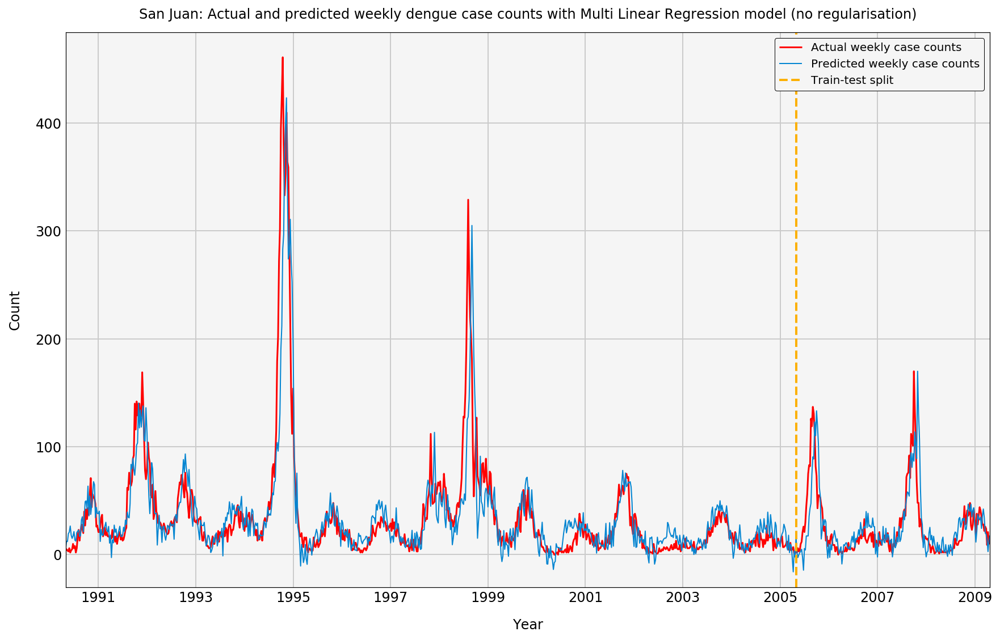

In [102]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = LR_Pipeline.predict(sj_X_train_df.iloc[:,:-1]).tolist() + \
              LR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]).tolist()
sj_predictions['model_predictions'] = [prediction[0] for prediction in predictions]

# Call function to plot actuals vs predicted time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Multi Linear Regression model (no regularisation)', 
                        'upper right')

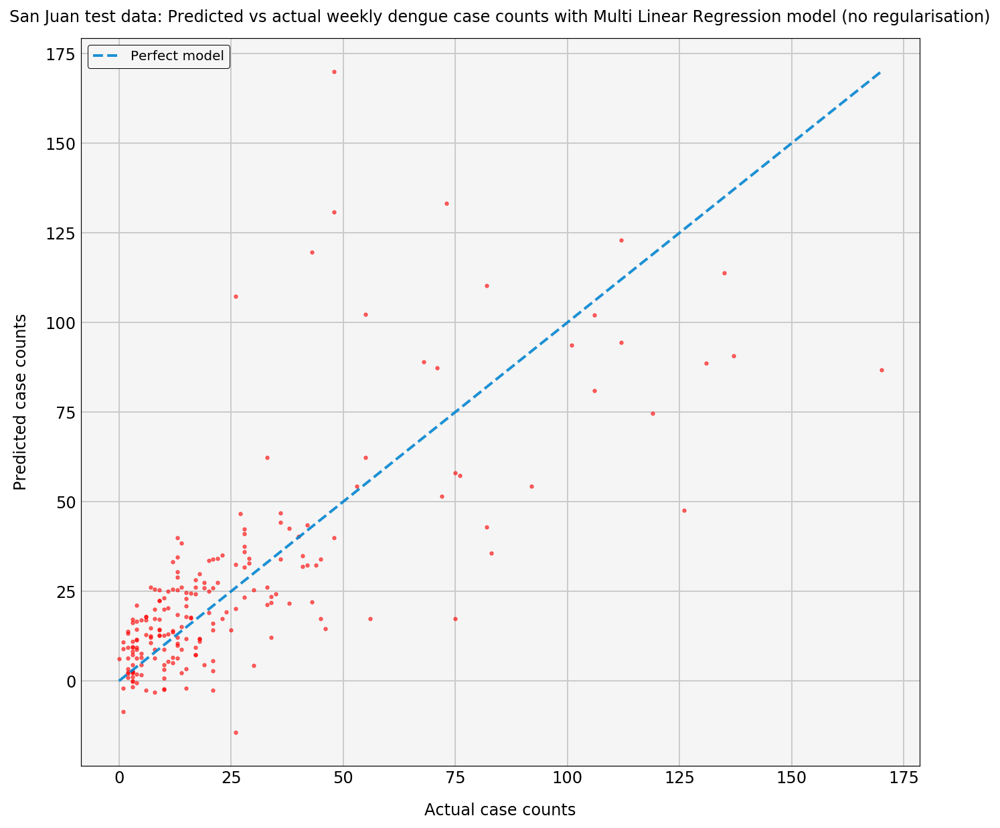

In [105]:
# Call function to plot actuals vs predicted time series test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':'2009-04-23',:], 
                            'San Juan', 'Multi Linear Regression model (no regularisation)', 'upper left')

A few points to note on the charts above:
- the model is doing a good job of predicting the shape of the actual weekly dengue case count time series in the test data.  It does particularly well to predict the short, sharp peaks in actual case counts, though the model tends to lag the timing of these peaks slightly - which would impact the accuracy scores.  This isn't surprising given that we're using lagged dengue case counts as predictors.
- the predicted time series is considerably noisier than the actual time series, which would be contributing to the accuracy scores being lower than you might expect when first looking at the comparison of the two time series.
- the model predicts weekly dengue case counts less than zero quite a few times, which would be impacting the accuracy scores.
- the model doesn't appear to perform notably worse on the test data than the training data, however (as previously explained), the baseline model will perform considerably worse on the training component of the data as a result of the higher variance in this component of the time series resulting in higher model accuracy scores on the training data.
- the scatter plot shows that the model performs worse at predicting the test data as the number of actual weekly dengue cases increases.  This isn't immediately obvious from the line plot.
- the model predicts some negative values in the test set.  These could immediately be set to zero as we know that the number of weekly dengue case counts cannot be negative.

<b> I'll now do a grid search with ElasticNet to see if I can improve the model with regularisation</b>

In [106]:
# Define ElasticNet pipeline and fit best model from GridSearch results
EN_Pipeline = Pipeline([('ss', StandardScaler()),
                       #('pca', PCA(n_components=17)),       
                        ('en', ElasticNet(random_state=1))])

# Define ElasticNet parameters
EN_params = {'en__l1_ratio': np.linspace(0, 1, 300),
             'en__alpha': np.logspace(-2, 2, 50)}

EN_gs = GridSearchCV(EN_Pipeline, EN_params, verbose=1, 
                     cv=KFold(n_splits=5, shuffle=True, random_state=1))

EN_gs.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df)


Fitting 5 folds for each of 15000 candidates, totalling 75000 fits


/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('en', ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=1, selection='cyclic', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'en__l1_ratio': array([0.     , 0.00334, ..., 0.99666, 1.     ]), 'en__alpha': array([1.00000e-02, 1.20679e-02, 1.45635e-02, 1.75751e-02, 2.12095e-02,
       2.55955e-02, 3.08884e-02, 3.72759e-02, 4.49843e-02, 5.42868e-02,
       6.55129e-02, 7.90604e-02, 9.54095e-02, 1.15140e-01, 1.3895... 3.23746e+01, 3.90694e+01,
       4.71487e+01, 5.68987e+01, 6.86649e+01, 8.28643e+01, 1.00000e+02])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [107]:
# Print optimal ElasticNet regularisation strength and ratio
print(f"Optimum alpha: {EN_gs.best_params_['en__alpha']}")
print(f"Optimum l1_ratio: {EN_gs.best_params_['en__l1_ratio']}")

Optimum alpha: 0.35564803062231287
Optimum l1_ratio: 0.9899665551839465


In [108]:
# Calculate MSE on test data using best model found in gridsearch
predictions = EN_gs.predict(sj_X_test_df.iloc[:,:-1])
mse = mean_squared_error(sj_y_test_df, EN_gs.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Best mean cross-validated score from gridsearch : {round(EN_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(EN_gs.score(sj_X_train_df.iloc[:,:-1], sj_y_train_df),3)}')
print(f'R2 score on test data: {round(EN_gs.score(sj_X_test_df.iloc[:,:-1], sj_y_test_df),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Best mean cross-validated score from gridsearch : 0.704
Best R2 score on full training data set: 0.739
R2 score on test data: 0.535
Root mean square error on test data: 20


In [112]:
# Print zero adjusted R2 and RMSEs, with top 10 coefficients
print(f'Adjusted R2 and RMSE with negative values adjusted to 0: {return_r2_rmse(EN_gs.predict(sj_X_test_df.iloc[:,:-1]), sj_y_test_df)}')

# Call function to display pipeline object coefficients in descending order
display_coeffs(sj_X_train_df.iloc[:,:-1], EN_gs).head(10)

Adjusted R2 and RMSE with negative values adjusted to 0: (0.537, 20)


,variable,coef,abs_coef
34,dengue_4w,50.740512,50.740512
36,dengue_12w,-6.714151,6.714151
37,seasonal_cycle,6.062457,6.062457
35,dengue_8w,-5.798018,5.798018
0,season_week,-2.488816,2.488816
17,RA_min_RHsp_9,-2.277718,2.277718
24,ST_mean_Tdtr_26,2.263117,2.263117
10,RA_min_Tmin_9,2.105350,2.105350
29,ndvi_se_16,-2.072628,2.072628
32,SA_PRECIP_GT10_26,-1.085791,1.085791


In [64]:
# test_mean = np.full((208,), np.mean(sj_y_test_df.total_cases))
# print(int(mean_squared_error(sj_y_test_df, test_mean)**0.5))
# print(int(mean_squared_error(sj_y_test_df, predictions)**0.5))
# print(1 - (mean_squared_error(sj_y_test_df, predictions)/mean_squared_error(sj_y_test_df, test_mean)))

The cross validation score on the training data has improved slightly, while the accuracy score on the test data has improved from 0.491 to 0.535. 

Additional grid search experiments, with resulting R2 scores for test data are displayed below:
- 17 PCA: 0.535.  Comparable R2 score with 17 principal components (86% cumulative vaariance explained) to that resulting from no PCA.
- 5 PCA: 0.355.  Understandably lower R2, given 57% of variance explained in predictor data with 5 components.
- 27 PCA: 0.512.  Surprisingly, a lower R2 score with 27 principal components (96% of cumulative variance explained) than that achieved without PCA.
- with 4-week lag predictos only: 0.533
- with environmental factors only: 0.159
- no season week: 0.528

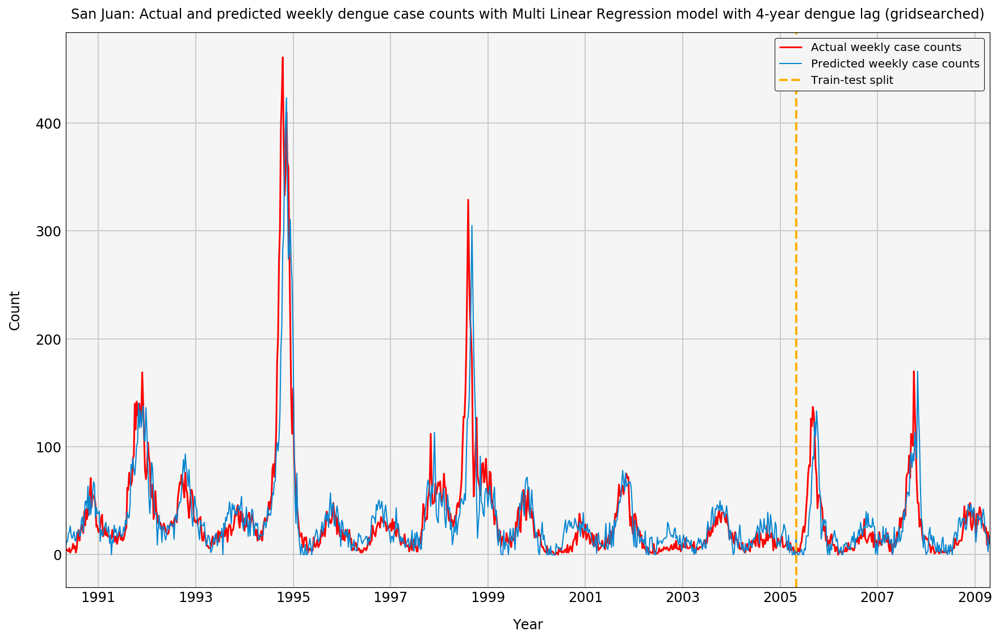

In [115]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = LR_Pipeline.predict(sj_X_train_df.iloc[:,:-1]).tolist() + \
              LR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]).tolist()

sj_predictions['model_predictions'] = np.nan
sj_predictions.loc[:,'model_predictions'] = [prediction[0] for prediction in predictions]

# Adjust values less than 0 to 0
sj_predictions.model_predictions.clip(lower=0, inplace=True)

# Plot actuals vs predicted values
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 
                        'Multi Linear Regression model with 4-year dengue lag (gridsearched)',
                        'upper right')

<b> Linear regression with the 4-year time lagged dengue counts</B>

In [116]:
# Fit Linear Regression model to data with the 4y lagged dengue cases.  
# Truncate forst 4 years of training data.
LR_Pipeline.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df[208:])

scores = cross_val_score(LR_Pipeline, sj_X_train_df.iloc[208:,:], sj_y_train_df[208:], 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df,LR_Pipeline.predict(sj_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(LR_Pipeline.score(sj_X_train_df.iloc[208:,:], \
sj_y_train_df[208:]),3)}')
print(f'R2 score on test data: {round(LR_Pipeline.score(sj_X_test_df, \
sj_y_test_df),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Individual cross validation scores on training data: [0.73, 0.585, 0.499, 0.655, 0.765]
Mean cross validation score on training data: 0.647
R2 score on full training data set: 0.749
R2 score on test data: 0.464
Root mean square error on test data: 21


Including the 4-year lagged dengue case counts has decreased the accuracy of the model on the test set.

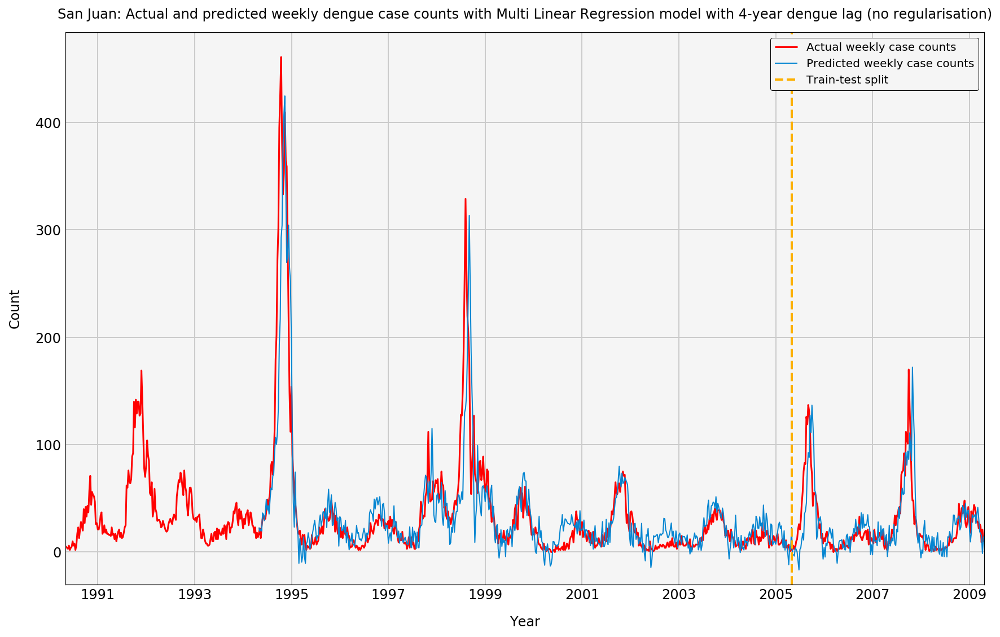

In [117]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = LR_Pipeline.predict(sj_X_train_df.iloc[208:,:]).tolist() + \
              LR_Pipeline.predict(sj_X_test_df).tolist()
sj_predictions['model_predictions'] = np.nan
sj_predictions.loc['1994-04-30':,'model_predictions'] = [prediction[0] for prediction in predictions]

# Plot actuals vs predicted values
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 
                         'Multi Linear Regression model with 4-year dengue lag (no regularisation)',
                        'upper right')

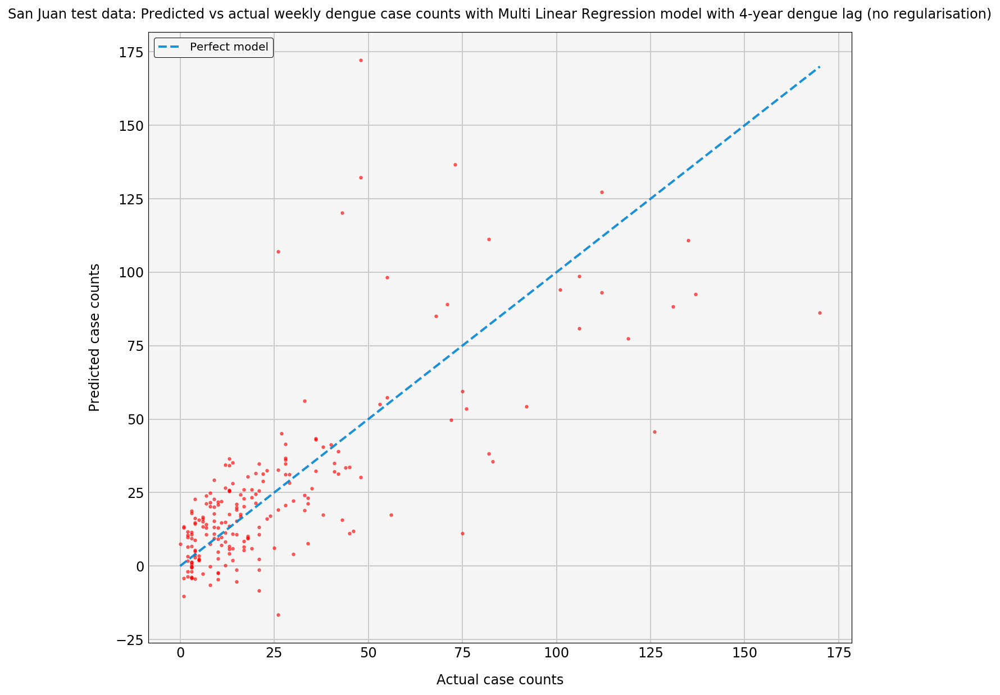

In [118]:
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':'2009-04-23',:], 
                            'San Juan', 'Multi Linear Regression model with 4-year dengue lag (no regularisation)',
                           'upper left')

We can see from the comparison of the predicted vs actual weekly case counts that the model doesn't perform as well on the test set with the 4-year lagged dengue case count included as a predictor, which also results in a 4-year truncation of the train set at the beginning of the time series.  The model hasn't generalised well from the train to test data and there are more negative predictions

I'll check to see if regularisation improves the model performance.


<b>GridSearch</b>

In [119]:
# Define ElasticNet GridSearch pipeline and paramaters
EN_gs = GridSearchCV(EN_Pipeline, EN_params, verbose=1, 
                     cv=KFold(n_splits=5, shuffle=True, random_state=1))

EN_params = {'en__l1_ratio': np.linspace(0, 1, 300),
             'en__alpha': np.logspace(-2, 2, 50)}

# Fit ElasticNet GridSearch pipeline to training data
EN_gs.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df[208:])

Fitting 5 folds for each of 15000 candidates, totalling 75000 fits


/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('en', ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=1, selection='cyclic', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'en__l1_ratio': array([0.     , 0.00334, ..., 0.99666, 1.     ]), 'en__alpha': array([1.00000e-02, 1.20679e-02, 1.45635e-02, 1.75751e-02, 2.12095e-02,
       2.55955e-02, 3.08884e-02, 3.72759e-02, 4.49843e-02, 5.42868e-02,
       6.55129e-02, 7.90604e-02, 9.54095e-02, 1.15140e-01, 1.3895... 3.23746e+01, 3.90694e+01,
       4.71487e+01, 5.68987e+01, 6.86649e+01, 8.28643e+01, 1.00000e+02])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [120]:
# Print optimal ElasticNet regularisation strength and ratio
print(f"Optimum alpha: {EN_gs.best_params_['en__alpha']}")
print(f"Optimum l1_ratio: {EN_gs.best_params_['en__l1_ratio']}")

Optimum alpha: 2.329951810515372
Optimum l1_ratio: 0.9966555183946488


In [121]:
# Calculate MSE on test data using best model found in gridsearch
mse = mean_squared_error(sj_y_test_df, EN_gs.predict(sj_X_test_df))
print(f'Best mean cross validated score from gridsearch: {round(EN_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(EN_gs.score(sj_X_train_df.iloc[208:,:],\
sj_y_train_df[208:]),3)}')
print(f'R2 score on test data: {round(EN_gs.score(sj_X_test_df, sj_y_test_df),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

print()

# Print zero adjusted R2 and RMSEs
print(f'Adjusted R2 and RMSE when negs adjusted to 0: {return_r2_rmse(EN_gs.predict(sj_X_test_df), sj_y_test_df)}')


Best mean cross validated score from gridsearch: 0.698
Best R2 score on full training data set: 0.721
R2 score on test data: 0.541
Root mean square error on test data: 20

Adjusted R2 and RMSE when negs adjusted to 0: (0.541, 20)


In [122]:
# Call function to assign 8 largest coefficients by absolute value in descending order to coeffs
coeffs = display_coeffs(sj_X_train_df, EN_gs)[:8]

In [123]:
coeffs

,variable,coef,abs_coef
34,dengue_4w,49.757589,49.757589
36,dengue_12w,-7.258993,7.258993
37,seasonal_cycle,3.337051,3.337051
24,ST_mean_Tdtr_26,2.654012,2.654012
0,season_week,-1.638721,1.638721
29,ndvi_se_16,-0.905811,0.905811
32,SA_PRECIP_GT10_26,-0.445586,0.445586
33,ST_PRCP_GT1_25,-0.163351,0.163351


In [124]:
# Insert column of coefficients names
coeff_names = ['Case count: 4wk lag', 'Case count: 12wk lag', 'Seasonal cycle', 'Station: Mean Daily Temperature Range: 26wk lag', 
              'Season week number', 'South East vegetation index: 16wk lag', 'Satellite precipitation days > 10mm per week: 26wk lag', 
              'Station precipitation days > 1mm: 25 wk lag']
coeffs.insert(1, 'Predictors', coeff_names)

In [125]:
# Sort coefficients by value in descending order and set index of df to predictor names
coeffs = coeffs.sort_values('coef', ascending=False)
coeffs.set_index('Predictors', inplace=True)

In [126]:
# Display coefficients df
coeffs

,variable,coef,abs_coef
Predictors,,,
Case count: 4wk lag,dengue_4w,49.757589,49.757589
Seasonal cycle,seasonal_cycle,3.337051,3.337051
Station: Mean Daily Temperature Range: 26wk lag,ST_mean_Tdtr_26,2.654012,2.654012
Station precipitation days > 1mm: 25 wk lag,ST_PRCP_GT1_25,-0.163351,0.163351
Satellite precipitation days > 10mm per week: 26wk lag,SA_PRECIP_GT10_26,-0.445586,0.445586
South East vegetation index: 16wk lag,ndvi_se_16,-0.905811,0.905811
Season week number,season_week,-1.638721,1.638721
Case count: 12wk lag,dengue_12w,-7.258993,7.258993


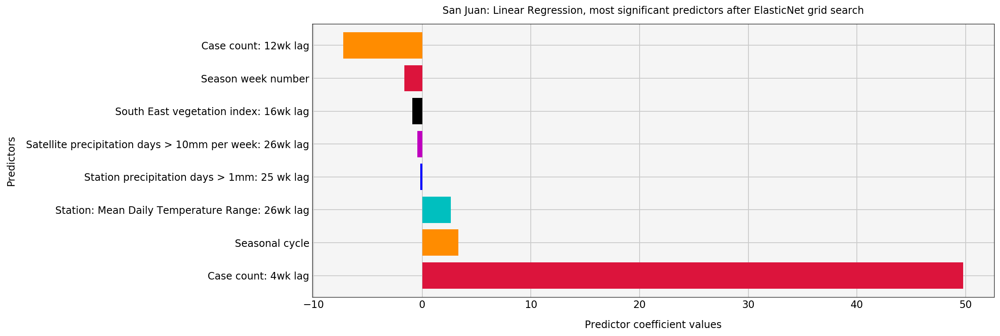

In [130]:
plot_coefs(coeffs, 'San Juan', 'after ElasticNet grid search')

The mean cross validation score on the training set has increased from 0.647 to 0.698, and the accuracy score on the test set has also increased from 0.464 to 0.541 with the (almost) full Lasso regularisation.  This strong Lasso regularisation is not unexpected, given the collinearity between the predictors when predictors are not transformed to principle components. The regularisation has improved the generalisability of the model.

I'll now visualise these predictions.

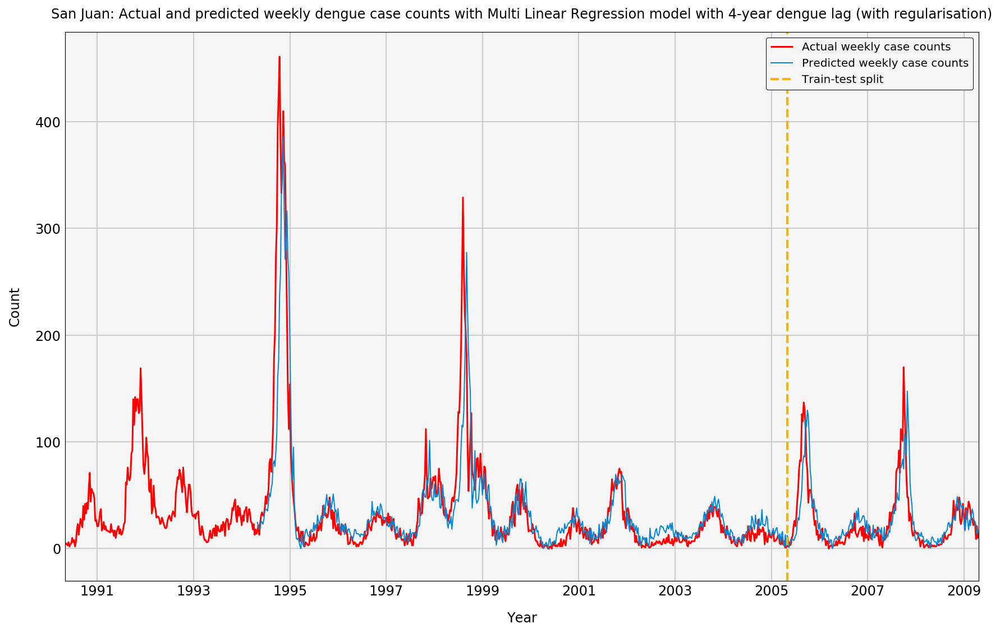

In [132]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = EN_gs.predict(sj_X_train_df.iloc[208:,:]).tolist() + \
              EN_gs.predict(sj_X_test_df).tolist()
sj_predictions['model_predictions'] = np.nan
sj_predictions.loc['1994-04-30':,'model_predictions'] = predictions

# Adjust values less than 0 to 0
sj_predictions.model_predictions.clip(lower=0, inplace=True)

# Plot actuals vs predicted values
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 
                         'Multi Linear Regression model with 4-year dengue lag (with regularisation)',
                        'upper right')
                                           

Here, we see that the modeled test data time series is noticeably smoother than the unregularised model.  

Accuracy scores are impacted by the model underestimating the peak weekly dengue counts in the test data and lagging the actual time series slightly, resulting from the inclusion of lagged dengue case counts. 

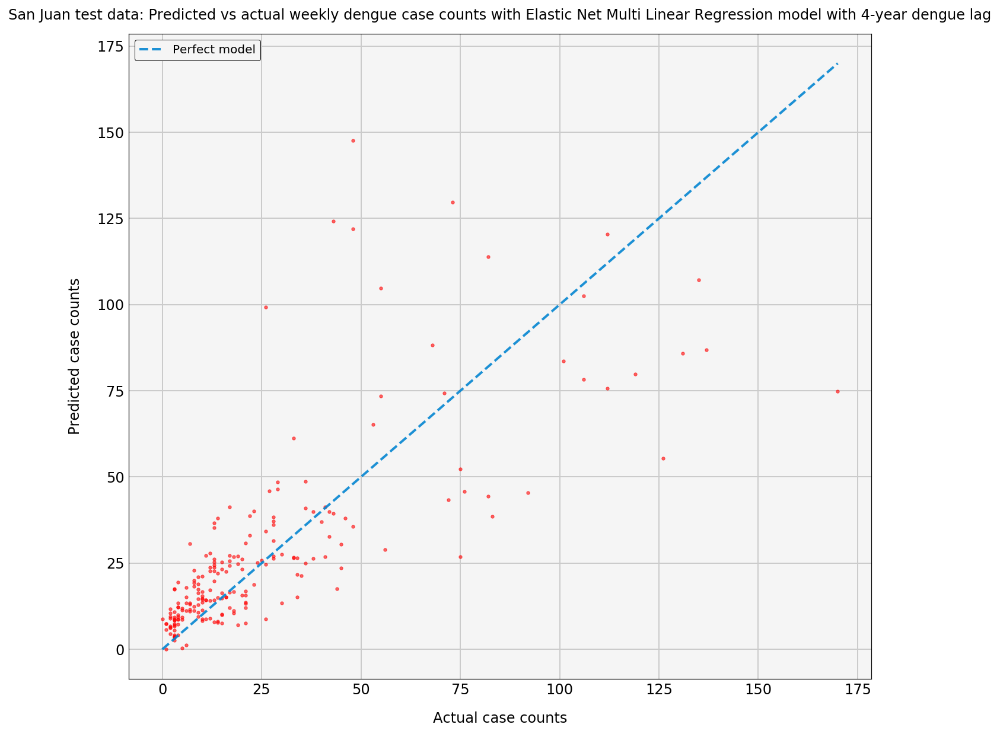

In [133]:
# Plot predicted vs. actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':'2009-04-23',:], 
                           'San Juan', 'Elastic Net Multi Linear Regression model with 4-year dengue lag',
                           'upper left')

In [135]:
# Multiple models with default parameters (--IGNORE THIS SECTION--)

# Define list of models
# models = []
# models.append(('LR', LinearRegression()))
# models.append(('RFR', RandomForestRegressor()))
# models.append(('ETR', ExtraTreesRegressor()))
# models.append(('SVR', SVR()))
# models.append(('KNR', KNeighborsRegressor()))

# X = sj_X_train_pca
# y = sj_y_train_df.total_cases

# # sj_X_test_ss
# # sj_y_test_df

# # Evaluate each model with default parameters
# results = []
# names = []
# test_results = []
# for (name, model) in models:
#     cross_val_results = cross_val_score(model, X, y, cv=KFold(n_splits=7, random_state=1,shuffle=True))
#     results.append(cross_val_results)
#     names.append(name)
#     model.fit(X, y)
#     score = model.score(sj_X_test_pca, sj_y_test_df)
#     test_results.append(score)
#     print(f'Model: {name}. Scores: {cross_val_results}. Mean score: {cross_val_results.mean()}. Test score: {score}')


#### Random Forest Regressor

Decision Trees have some critical limitations. In particular, trees that are grown very deep tend to learn highly irregular patterns: they overfit their training sets.  Random forests provide a way of averaging multiple deep decision trees, trained on different parts of the same training set, with the goal of reducing the variance. This comes at the expense of a small increase in the bias and some loss of interpretability, but generally greatly boosts the performance of the final model.

Random forests select, at each candidate split in the learning process, a random subset of the features. This process is sometimes called feature bagging.  By selecting a random subset of the features at each split, we avoid the over representation of strong predictors and the resulting correlation between base trees.

For a regression problem with p features, it is typical to use p/3 (rounded down) with a minimum node size of 5 as the default.

<b>Random Forest Regressor without the 4-year time lagged dengue counts</b>

In [136]:
# Define Random Forest Regressor pipeline
# Deactivate pca step
RFR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=17)),
                        ('rfr', RandomForestRegressor(random_state=10, n_estimators=5))])

In [137]:
# Fit Random Forest Regression model to data, excluding the 4y lagged dengue cases
RFR_Pipeline.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)

scores = cross_val_score(RFR_Pipeline, sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases, 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))

scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df, RFR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(RFR_Pipeline.score(sj_X_train_df.iloc[:,:-1], \
sj_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(RFR_Pipeline.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.45, 0.661, 0.7, 0.781, 0.66]
Mean cross validation score on training data: 0.65
R2 score on full training data set: 0.93
R2 score on test data: 0.452
Root mean square error on test data: 22


The Random Forest Regressor has a good mean cross validation score - but with some variation in the individual scores, suggesting potential over-fitting.  With an accrucy score of 0.452 on the test data, the model hasn't generalised well to the test set. 

I'll gridsearch the hyperparameters to see if I can improve this model performance.

First, I'll visualise these predictions.

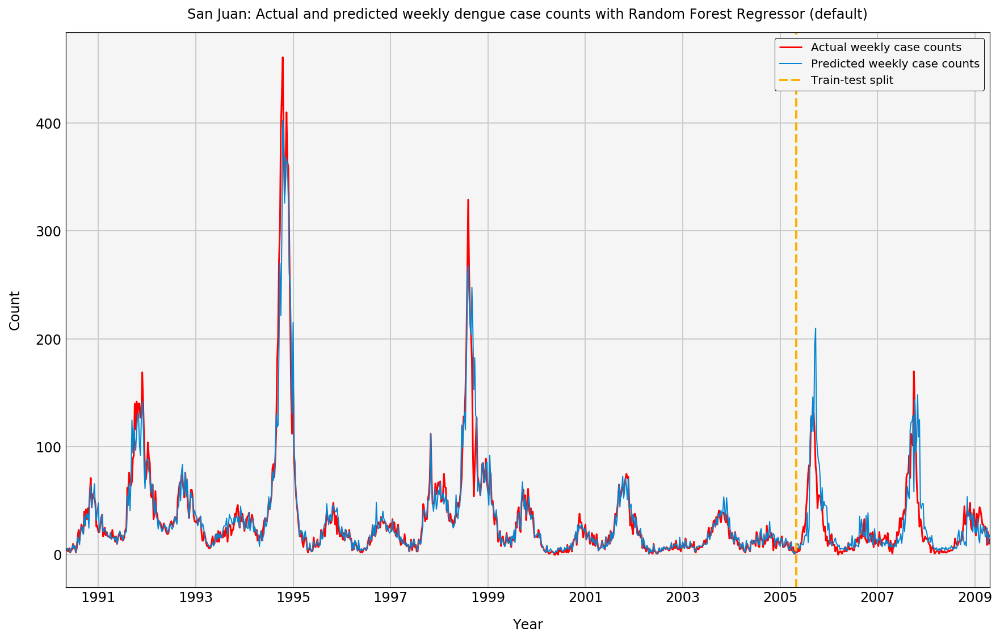

In [138]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = RFR_Pipeline.predict(sj_X_train_df.iloc[:,:-1]).tolist() + \
              RFR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]).tolist()

sj_predictions['model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Random Forest Regressor (default)',
                        'upper right')

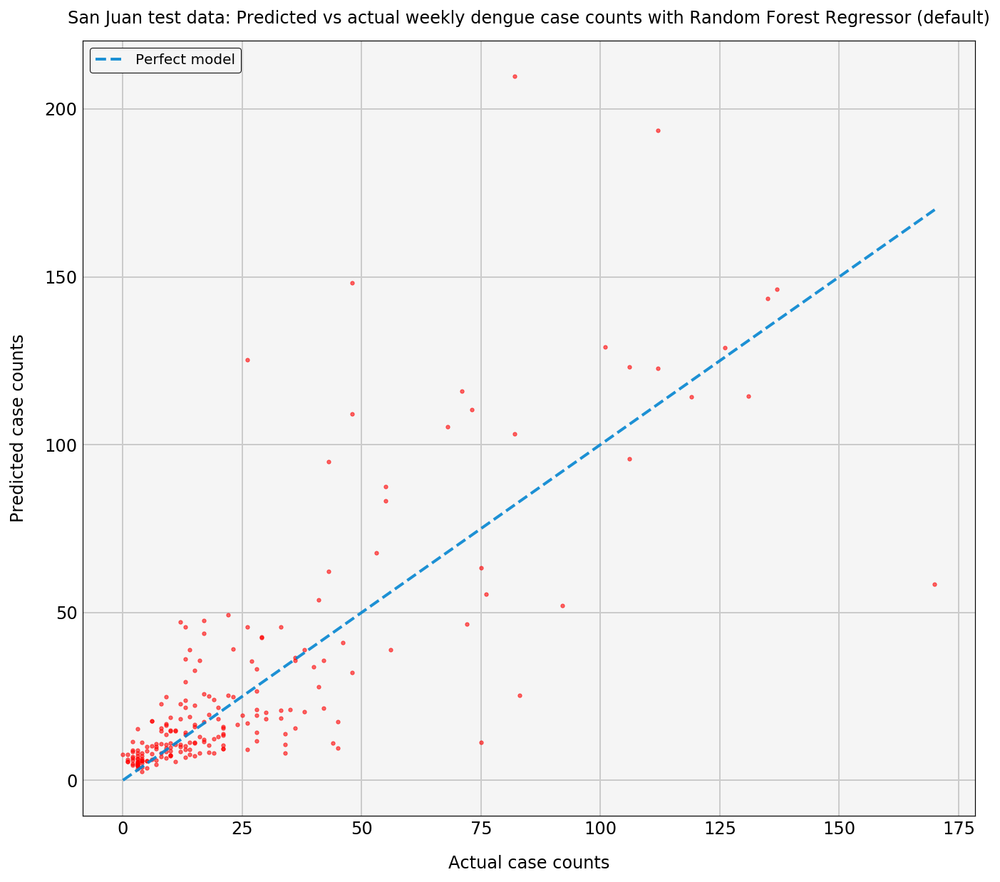

In [139]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'Random Forest Regressor (default)', 'upper left')

A few points to note on the charts above:
- The model has fitted to the training data well, but underestimates the amplitude of the peaks
- While the model predicts the shape of the test time series, it again struggles to replicate the peaks

<b>GridSearch</b>

I'll now do a GridSearch to see if the model performance improves.

In [158]:
# Define Random Forest Regressor pipeline
RFR_Pipeline = Pipeline([('ss', StandardScaler()),
                       # ('pca', PCA()),
                        ('rfr', RandomForestRegressor(n_estimators=250, random_state=10))])

# Define RFR hyperparameters
RFR_params = {#'pca__n_components': (10,17,20,25,None),
             #'rfr__max_depth': np.linspace(20,60,41),
             'rfr__max_features': ('sqrt','log2', 5, 8, 10, 'auto'),
             #'rfr__min_samples_split':[3, 6],
#            'rfr__max_leaf_nodes': [2, 5, 10, 12, 14, None]
}

RFR_gs = GridSearchCV(RFR_Pipeline, RFR_params, verbose=1, cv=KFold(n_splits=5, shuffle=True))

RFR_gs.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   23.9s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('rfr', RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=N...timators=250, n_jobs=1,
           oob_score=False, random_state=10, verbose=0, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'rfr__max_features': ('sqrt', 'log2', 5, 8, 10, 'auto')},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [159]:
# Print Random Forest Regressor best paramaters
print(f"Best parameters: {RFR_gs.best_params_}")

Best parameters: {'rfr__max_features': 'auto'}


In [160]:
# Calculate MSE on test data using the best model found in the gridsearch
mse = mean_squared_error(sj_y_test_df, RFR_gs.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Best mean cross validated score on training data: {round(RFR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(RFR_gs.score(sj_X_train_df.iloc[:,:-1], \
sj_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(RFR_gs.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Best mean cross validated score on training data: 0.741
Best R2 score on full training data set: 0.976
R2 score on test data: 0.242
Root mean square error on test data: 26


With the gridsearch on the hyperparameters, the mean cross validation score for the training data has increased, and the R2 score for the test data has decreased to 0.242 - much less than the ElasticNet model.  

The accuracy score also appears to decrease as the ensemble size increases - which is surprising. Through experimentation with the hyperparameters, I was able to achieve notably higher R2 scores by limiting the size of the trees - see below.  I'm going to visualise the predictions to try to understand what's happening here.


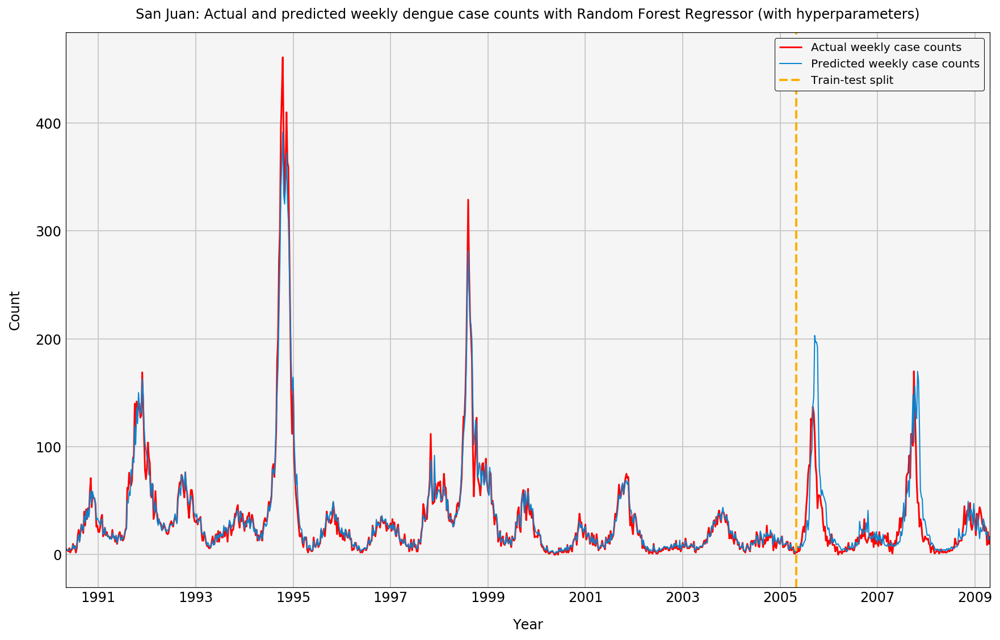

In [161]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = RFR_gs.predict(sj_X_train_df.iloc[:,:-1]).tolist() + \
              RFR_gs.predict(sj_X_test_df.iloc[:,:-1]).tolist()
sj_predictions['model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Random Forest Regressor (with hyperparameters)',
                        'upper right')

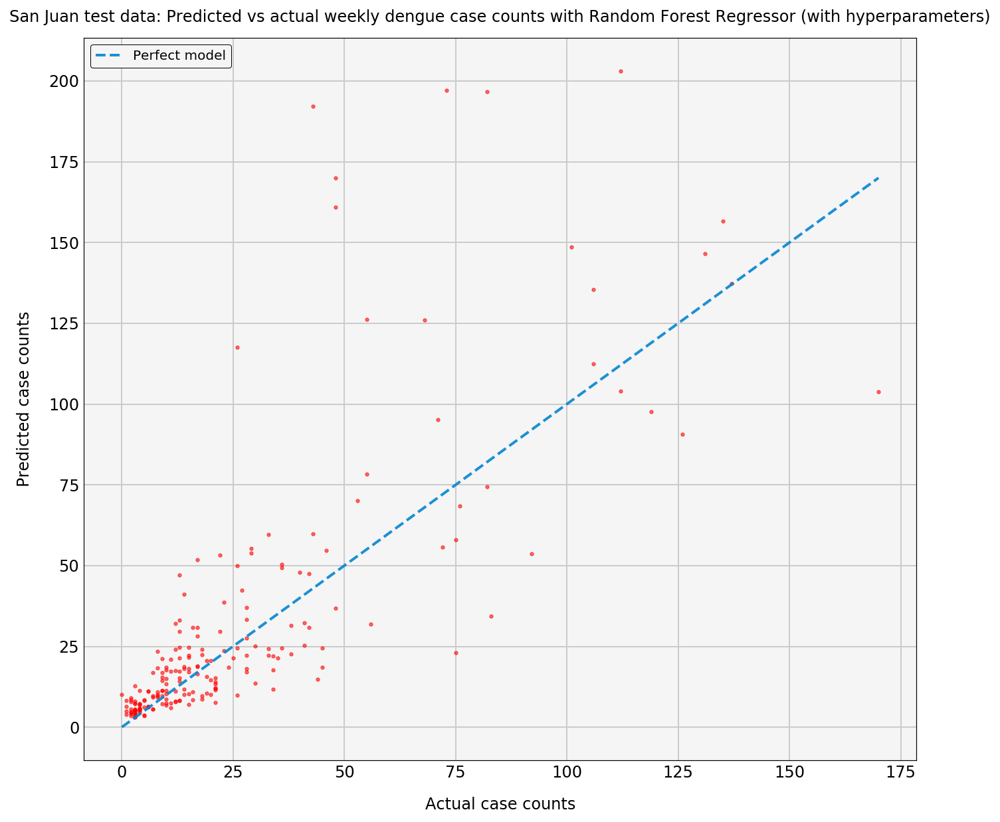

In [163]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'Random Forest Regressor (with hyperparameters)', 'upper left')

The optimised RFR is modeling the shape of the test time series well, but is greatly overestimating the 2005 peak in weekly dengue case counts.  The scatter plot shows that the higher the actual dengue cases, the worse the model performs.

I'll now place greater limitations on the hyperparameters to compare the results.

In [164]:
# Define Random Forest Regressor pipeline

RFR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA()),
                        ('rfr', RandomForestRegressor(n_estimators=10, random_state=10))])

# Define RFR hyperparameters
RFR_params = {#'pca__n_components': (10,17,20,25,None),
             'rfr__max_depth': np.linspace(1,40,10),
             'rfr__max_features': ('sqrt','log2', 5, 8, 10,'auto'),
             'rfr__min_samples_split':[2, 3],
             'rfr__max_leaf_nodes': [2, 5, 10, 12, 14, None]
}

RFR_gs = GridSearchCV(RFR_Pipeline, RFR_params, verbose=1, cv=5)

RFR_gs.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=1)]: Done 3600 out of 3600 | elapsed:  1.3min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('rfr', RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=N...stimators=10, n_jobs=1,
           oob_score=False, random_state=10, verbose=0, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'rfr__max_depth': array([ 1.     ,  5.33333,  9.66667, 14.     , 18.33333, 22.66667,
       27.     , 31.33333, 35.66667, 40.     ]), 'rfr__max_features': ('sqrt', 'log2', 5, 8, 10, 'auto'), 'rfr__min_samples_split': [2, 3], 'rfr__max_leaf_nodes': [2, 5, 10, 12, 14, None]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [165]:
# Print Random Forest Regressor best paramaters
print(f"Best parameters: {RFR_gs.best_params_}")

Best parameters: {'rfr__max_depth': 5.333333333333333, 'rfr__max_features': 'auto', 'rfr__max_leaf_nodes': 10, 'rfr__min_samples_split': 3}


In [166]:
# Calculate MSE on test data using the best model found in the gridsearch
mse = mean_squared_error(sj_y_test_df, RFR_gs.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Best mean cross validated score on training data: {round(RFR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(RFR_gs.score(sj_X_train_df.iloc[:,:-1], \
sj_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(RFR_gs.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Best mean cross validated score on training data: 0.34
Best R2 score on full training data set: 0.898
R2 score on test data: 0.408
Root mean square error on test data: 23


Here, we see that the mean cross validated score on the training data is less, but the R2 score on the test data is notably higher than that achieved with the previous GridSearch.

<b>Random Forest Regressor with the 4-year time lagged dengue counts</b>

In [167]:
# Fit Random Forest Regression model to data, including the 4y lagged dengue cases

# Define Random Forest Regressor pipeline
RFR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=17)),
                        ('rfr', RandomForestRegressor(random_state=10, n_estimators=5))])

RFR_Pipeline.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:])

scores = cross_val_score(RFR_Pipeline, sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:], 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))

scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df, RFR_Pipeline.predict(sj_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(RFR_Pipeline.score(sj_X_train_df.iloc[208:,:], \
sj_y_train_df.total_cases[208:]),3)}')
print(f'R2 score on test data: {round(RFR_Pipeline.score(sj_X_test_df, sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.888, 0.619, 0.347, 0.775, 0.79]
Mean cross validation score on training data: 0.684
R2 score on full training data set: 0.96
R2 score on test data: -0.029
Root mean square error on test data: 30


The random forest regressor has a range of cross validation scores on the training data, suggesting that the model won't generalise well to the test data - which is what we see with the negative R2 score.  This model performs worse than baseline!

<b>Gridsearch</b>

I'll now do a grid search to see if I can improve this model.

In [168]:
# Perform gridsearch
RFR_Pipeline = Pipeline([('ss', StandardScaler()),
                       # ('pca', PCA()),
                        ('rfr', RandomForestRegressor(n_estimators=5, random_state=10))])

# Define RFR hyperparameters
RFR_params = {#'pca__n_components': (10,17,20,25,None),
             'rfr__max_depth': np.linspace(12,50,39),
             'rfr__max_features': ('sqrt','log2', 5, 8, 10, 'auto'),
             'rfr__min_samples_split':[3, 6],
#            'rfr__max_leaf_nodes': [2, 5, 10, 12, 14, None]
}

RFR_gs = GridSearchCV(RFR_Pipeline, RFR_params, verbose=1, 
                      cv=KFold(n_splits=5, shuffle=True, random_state=1))

RFR_gs.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:])

Fitting 5 folds for each of 468 candidates, totalling 2340 fits


[Parallel(n_jobs=1)]: Done 2340 out of 2340 | elapsed:   36.3s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('rfr', RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=5, n_jobs=1,
           oob_score=False, random_state=10, verbose=0, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'rfr__max_depth': array([12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24.,
       25., 26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37.,
       38., 39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50.]), 'rfr__max_features': ('sqrt', 'log2', 5, 8, 10, 'auto'), 'rfr__min_samples_split': [3, 6]},
       

In [169]:
# Print Random Forest Regressor best paramaters
print(f"Best parameters: {RFR_gs.best_params_}")

Best parameters: {'rfr__max_depth': 14.0, 'rfr__max_features': 10, 'rfr__min_samples_split': 3}


In [170]:
# Calculate MSE on test data from best model found in gridsearch
mse = mean_squared_error(sj_y_test_df, RFR_gs.predict(sj_X_test_df))

print(f'Best mean cross validated score from gridsearch: {round(RFR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(RFR_gs.score(sj_X_train_df.iloc[208:,:], \
sj_y_train_df.total_cases[208:]),3)}')
print(f'R2 score on test data: {round(RFR_gs.score(sj_X_test_df, sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Best mean cross validated score from gridsearch: 0.732
Best R2 score on full training data set: 0.944
R2 score on test data: 0.05
Root mean square error on test data: 29


The best mean cross validated score has improved significantly - from 0.365 to 0.771 - with the optimised hyperparameters selected through the gridsearch. Unfortunately, the model hasn't generalised well to the test set at all, performing only marginally better than baseline.

I'll now visualise these predictions, as I'm curious to see what's going on!

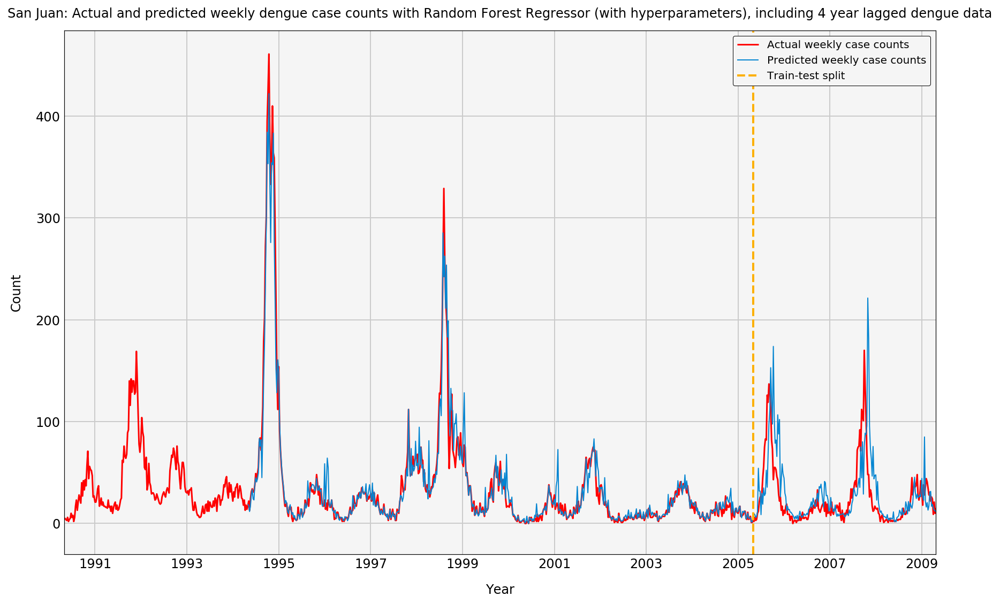

In [172]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = RFR_gs.predict(sj_X_train_df.iloc[208:,:]).tolist() + \
              RFR_gs.predict(sj_X_test_df).tolist()

sj_predictions['model_predictions'] = np.nan
sj_predictions.loc['1994-04-30':,'model_predictions'] = predictions

# PCall function to plot the actual vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Random Forest Regressor (with hyperparameters), including \
4 year lagged dengue data', 'upper right')

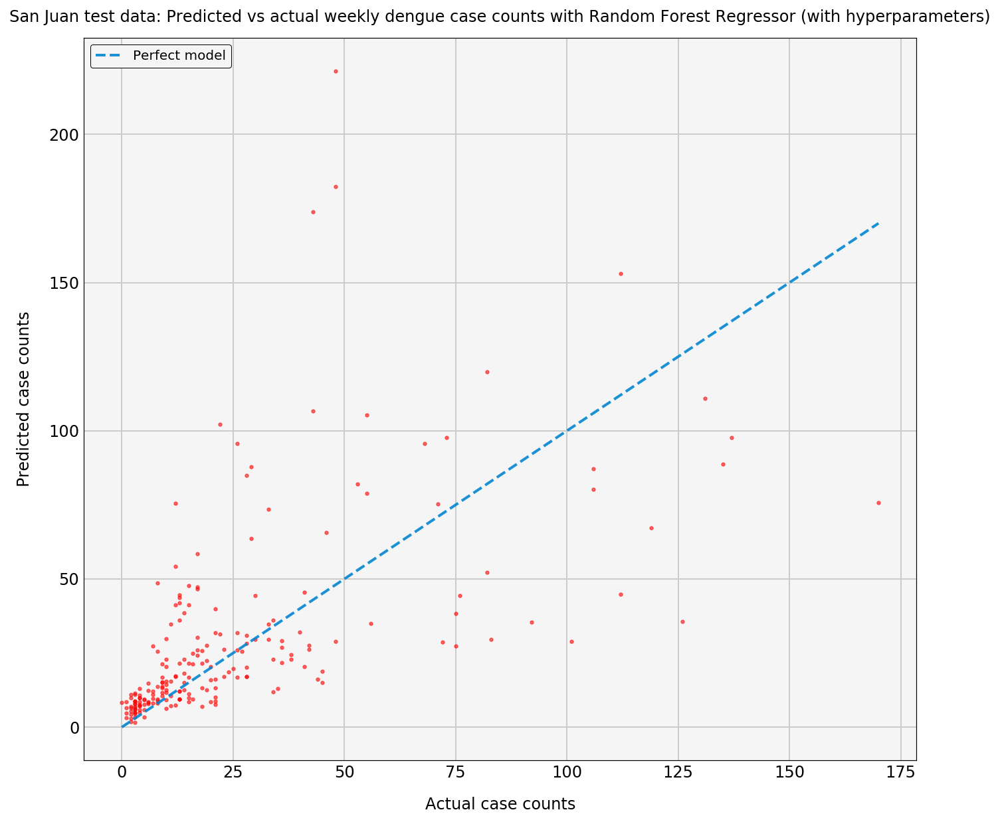

In [173]:
# Call function tom plot modeled vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'Random Forest Regressor (with hyperparameters)', 'upper left')

Truncating the model's first 4 years of training data appears to make the model hyper-sensitive to peaks.  The peaks in the test data are significantly over estimated and lag the actual time series.  

#### Extra Trees Regressor

<b>Extra Tree Regressor without the 4-year time lagged dengue counts</b>

In [176]:
# Define Random Forest Regressor pipeline
# Deactivating pca step
ETR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=17)),
                        ('etr', ExtraTreesRegressor(random_state=1, n_estimators=300))])

In [178]:
# Fit Extra Tree Regressor to data, excluding the 4y lagged dengue cases
ETR_Pipeline.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)

scores = cross_val_score(ETR_Pipeline, sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases, 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df, ETR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(ETR_Pipeline.score(sj_X_train_df.iloc[:,:-1],sj_y_train_df.total_cases),9)}')
print(f'R2 score on test data: {round(ETR_Pipeline.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')



Individual cross validation scores on training data: [0.82, 0.738, 0.868, 0.904, 0.852]
Mean cross validation score on training data: 0.836
R2 score on full training data set: 1.0
R2 score on test data: 0.33
Root mean square error on test data: 24


The Extra Trees Random Forest Regressor again appears to have overfit to the training data, and hasn't generalised well to the test data - with a lower R2 score than the ElasticNet model.

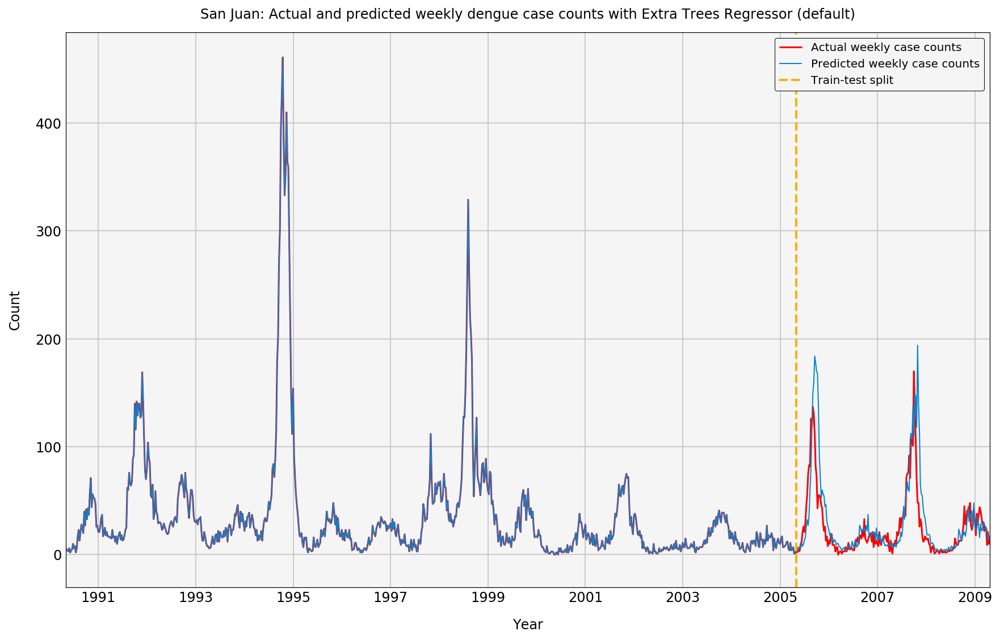

In [180]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = ETR_Pipeline.predict(sj_X_train_df.iloc[:,:-1]).tolist() + \
              ETR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]).tolist()

sj_predictions['model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Extra Trees Regressor (default)', 'upper right')

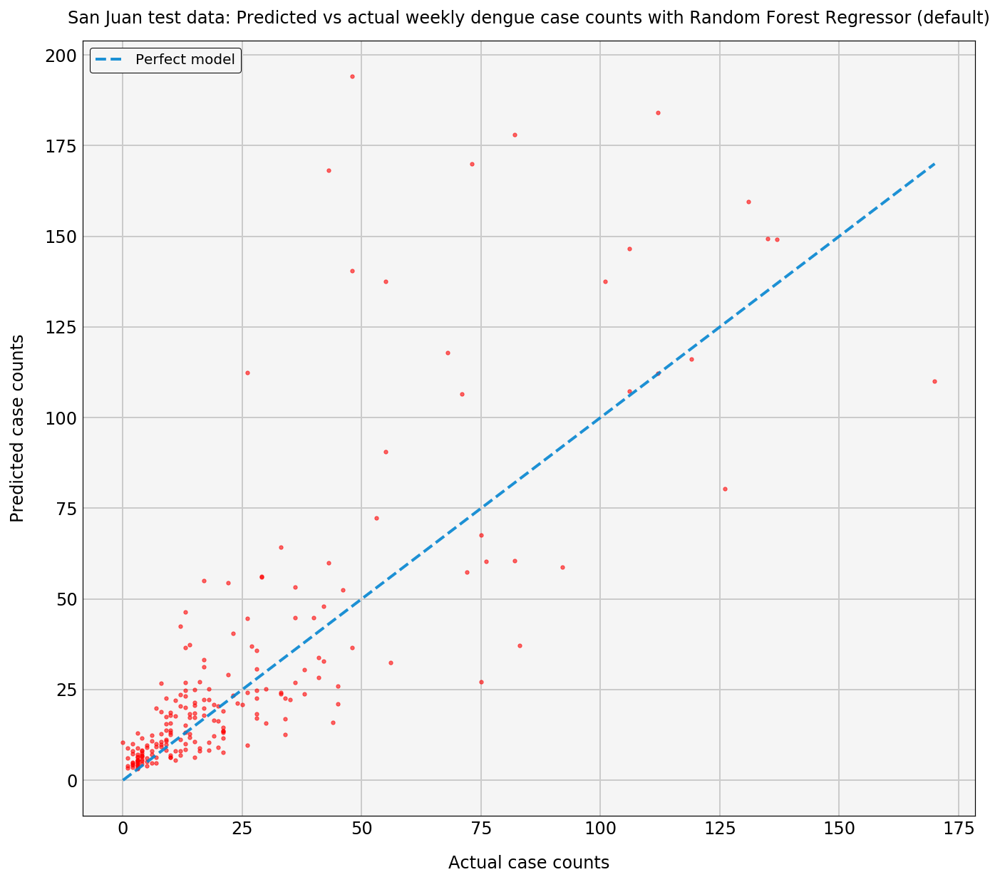

In [181]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'Random Forest Regressor (default)', 'upper left')

A few points to note on the charts above:

- The model replciates the training data when fit with entire dataset and hasn't generalised well to the test data 
- For the test data, the model has replicated the shape of the time series quite well, but has overestimated the amplitudes of the peaks, lowering the R2 score. 

<b>GridSearch</b>

I'll now do a GridSearch to see if the model performance improves.

In [182]:
# Define Random Forest Regressor pipeline
ETR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA()),
                        ('etr', ExtraTreesRegressor(random_state=10, n_estimators=800))])

# Define RFR hyperparameters
ETR_params = {#'pca__n_components': (10,17,20,25,None),
             #'etr__max_depth': np.linspace(1,40,10),
             'etr__max_features': ('sqrt','log2',5, 8, 10,'auto'),
             'etr__min_samples_split':[30, 50, 80, 90],
             #'etr__max_leaf_nodes': [2, 5, 10, 12, 14, None]
}

ETR_gs = GridSearchCV(ETR_Pipeline, ETR_params, cv=5, verbose=1)

ETR_gs.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:  1.5min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('etr', ExtraTreesRegressor(bootstrap=False, criterion='mse', max_depth=None,
          max_features='auto', max_leaf_nodes=None,
          min_impurity_decrease=0.0, min_impurity_split=None,
          min_samples_leaf=1, min_samples_split=2,
          min_weight_fraction_leaf=0.0, n_estimators=800, n_jobs=1,
          oob_score=False, random_state=10, verbose=0, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'etr__max_features': ('sqrt', 'log2', 5, 8, 10, 'auto'), 'etr__min_samples_split': [30, 50, 80, 90]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [183]:
# Print Extra Tree Regressor best paramaters
print(f"Best parameters: {ETR_gs.best_params_}")

Best parameters: {'etr__max_features': 'auto', 'etr__min_samples_split': 50}


In [184]:
# Calculate MSE on test data using best model found in gridsearch
mse = mean_squared_error(sj_y_test_df, ETR_gs.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Best mean cross validated score from gridsearch: {round(ETR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(ETR_gs.score(sj_X_train_df.iloc[:,:-1], \
sj_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(ETR_gs.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Best mean cross validated score from gridsearch: 0.418
Best R2 score on full training data set: 0.761
R2 score on test data: 0.395
Root mean square error on test data: 23


With the gridsearch on the hyperparameters, the mean cross validation score on the training data has decreased however, the R2 score on the test data has improved from 0.33 to 0.395.

I'll now plot the predictions vs actuals to visualise the model performance.

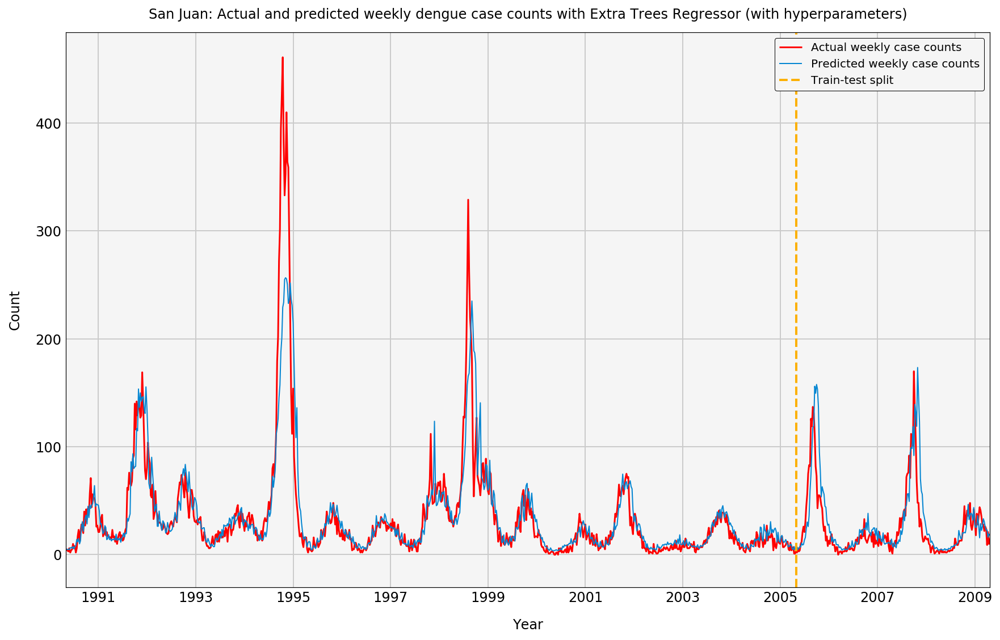

In [185]:
## Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = ETR_gs.predict(sj_X_train_df.iloc[:,:-1]).tolist() + \
              ETR_gs.predict(sj_X_test_df.iloc[:,:-1]).tolist()
sj_predictions['model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Extra Trees Regressor (with hyperparameters)', 'upper right')

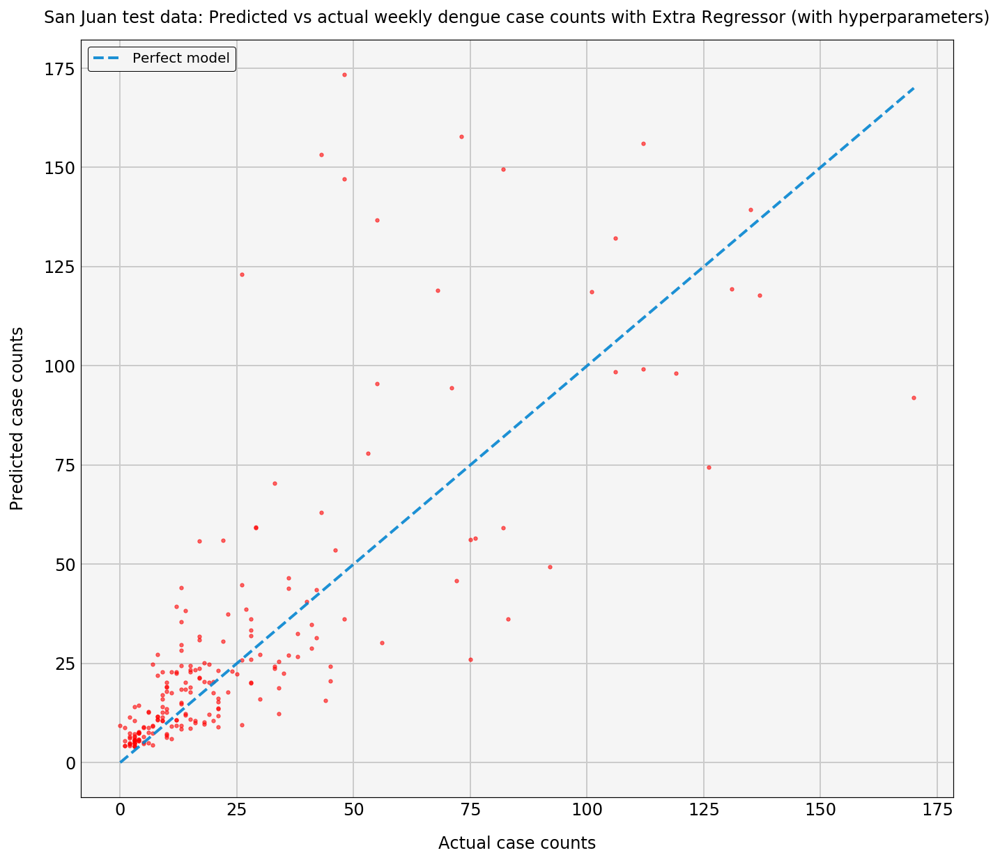

In [186]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'Extra Regressor (with hyperparameters)', 'upper left')

As we see from the charts above, the Extra Trees Regressor is predicting the shape of the test set time series well, but again over estimates the 2005 peak within the test data.

<b>Extra Trees Regressor with the 4-year time lagged dengue counts</b>

In [187]:
# Fit Extra Trees Regression model to data, including the 4y lagged dengue cases

# Define Random Forest Regressor pipeline
ETR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=17)),
                        ('etr', ExtraTreesRegressor(random_state=10))])

ETR_Pipeline.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:])

scores = cross_val_score(ETR_Pipeline, sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:], 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df, ETR_Pipeline.predict(sj_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(ETR_Pipeline.score(sj_X_train_df.iloc[208:,:], \
sj_y_train_df.total_cases[208:]),3)}')
print(f'R2 score on test data: {round(ETR_Pipeline.score(sj_X_test_df, sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.887, 0.825, 0.642, 0.873, 0.932]
Mean cross validation score on training data: 0.832
R2 score on full training data set: 1.0
R2 score on test data: 0.088
Root mean square error on test data: 28


The Extra Trees Regressor has again overfit the training data and hasn't generalised well to the test data.  This could be foreseen by looking at the range of cross val scores.

<b>Gridsearch</b>

I'll now do a grid search to see if I can improve this model.

In [188]:
# Perform gridsearch
# Define Random Forest Regressor pipeline
ETR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA()),
                        ('etr', ExtraTreesRegressor(random_state=10, n_estimators=800))])

# Define RFR hyperparameters
ETR_params = {#'pca__n_components': (10,17,20,25,None),
             #'etr__max_depth': np.linspace(1,40,10),
             'etr__max_features': ('sqrt','log2',5, 8, 10,'auto'),
             'etr__min_samples_split':[30, 50, 80, 90],
             #'etr__max_leaf_nodes': [2, 5, 10, 12, 14, None]
}
    
ETR_gs.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:])

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:  1.4min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('etr', ExtraTreesRegressor(bootstrap=False, criterion='mse', max_depth=None,
          max_features='auto', max_leaf_nodes=None,
          min_impurity_decrease=0.0, min_impurity_split=None,
          min_samples_leaf=1, min_samples_split=2,
          min_weight_fraction_leaf=0.0, n_estimators=800, n_jobs=1,
          oob_score=False, random_state=10, verbose=0, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'etr__max_features': ('sqrt', 'log2', 5, 8, 10, 'auto'), 'etr__min_samples_split': [30, 50, 80, 90]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [189]:
# Print Extra Trees Regressor best paramaters
print(f"Best parameters: {ETR_gs.best_params_}")

Best parameters: {'etr__max_features': 'auto', 'etr__min_samples_split': 50}


In [190]:
# Calculate MSE on test data useing best model found in gridsearch
mse = mean_squared_error(sj_y_test_df, ETR_gs.predict(sj_X_test_df))

print(f'Best mean cross validated score from gridsearch: {round(ETR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(ETR_gs.score(sj_X_train_df.iloc[208:,:], \
sj_y_train_df.total_cases[208:]),3)}')
print(f'R2 score on test data: {round(ETR_gs.score(sj_X_test_df, sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Best mean cross validated score from gridsearch: 0.405
Best R2 score on full training data set: 0.756
R2 score on test data: 0.287
Root mean square error on test data: 25


With the gridsearch on the hyperparameters, the mean cross validation score on the training data has decreased from 0.832 to 0.405, and the R2 score on the test data has improved from 0.088 to 0.287 - still not high enough to challenge the ElasticNet model, which remains the best performing model to date.

I'll now visualise these predictions.

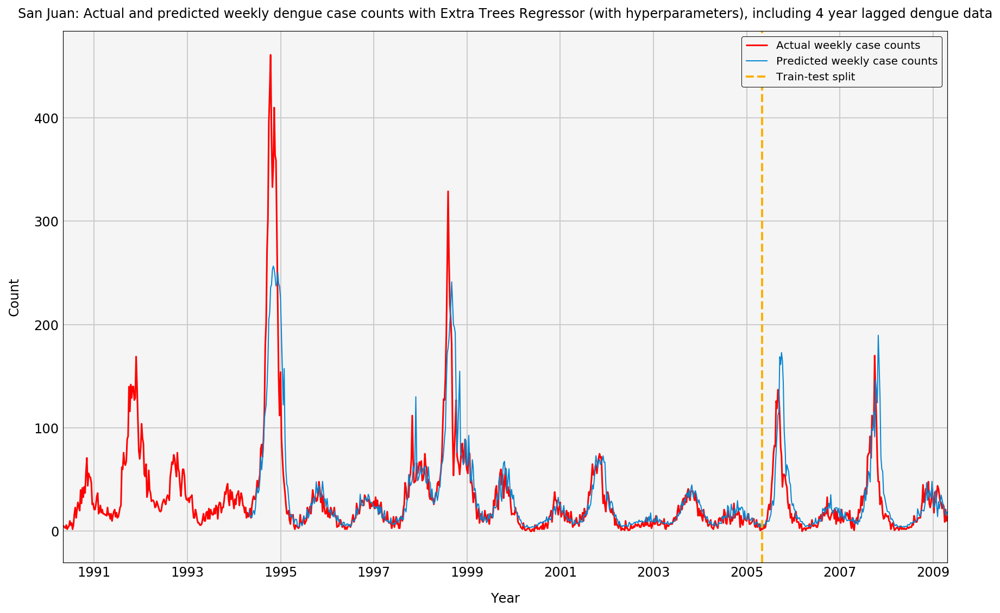

In [192]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = ETR_gs.predict(sj_X_train_df.iloc[208:,:]).tolist() + \
              ETR_gs.predict(sj_X_test_df).tolist()

sj_predictions['model_predictions'] = np.nan
sj_predictions.loc['1994-04-30':,'model_predictions'] = predictions

# Call function to plot the actual vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Extra Trees Regressor (with hyperparameters), including \
4 year lagged dengue data', 'upper right')

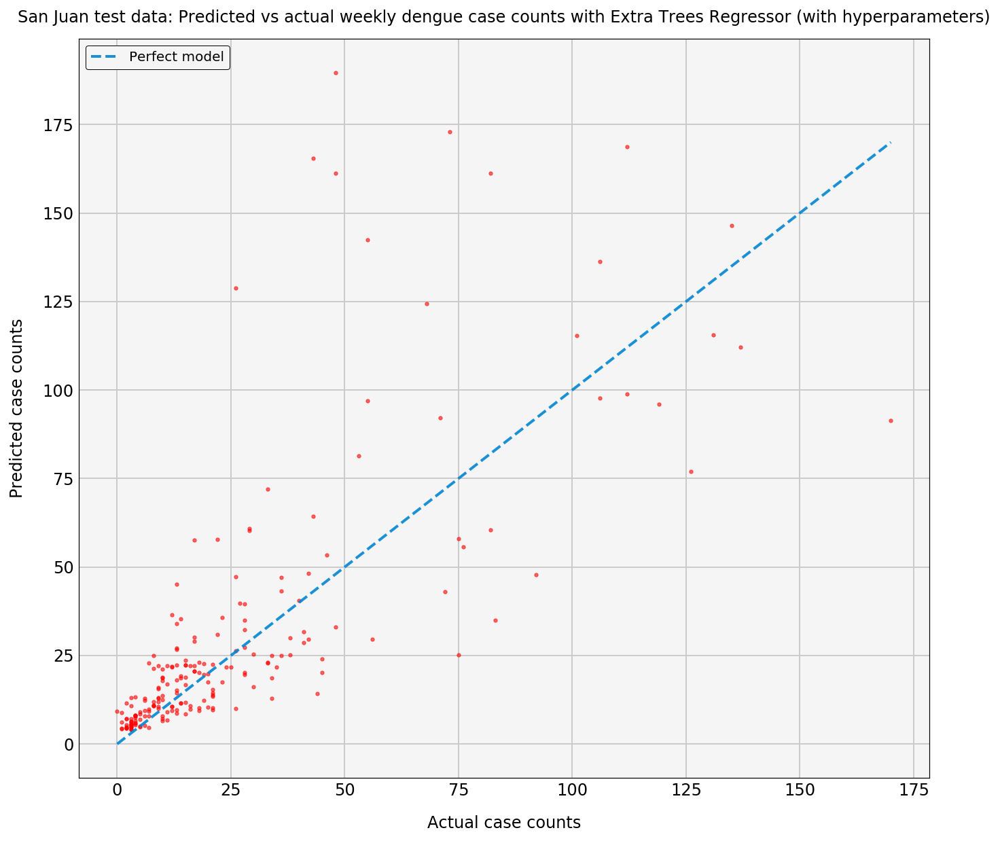

In [193]:
# Call function to plot modeled vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'Extra Trees Regressor (with hyperparameters)', 'upper left')

#### Support Vector Regressor

<b>Support Vector Regressor without the 4-year time lagged dengue counts</b>

In [194]:
# Define Support Vector Regressor pipeline
# Deactivating pca step
SVR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=17)),
                        ('svr', SVR())])

In [195]:
# Fit Support Vector Regresspr to data, excluding the 4y lagged dengue cases
SVR_Pipeline.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)

scores = cross_val_score(SVR_Pipeline, sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases, 
                         cv=KFold(n_splits=7, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df, SVR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(SVR_Pipeline.score(sj_X_train_df.iloc[:,:-1], \
sj_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(SVR_Pipeline.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.116, 0.098, 0.138, 0.055, 0.063, 0.085, 0.162]
Mean cross validation score on training data: 0.102
R2 score on full training data set: 0.13
R2 score on test data: 0.257
Root mean square error on test data: 25


The cross validation and accuracy scores for the training data are low.  I'm going to try to improve the performance of this model through a GridSearch.

<b>GridSearch</b>

In [202]:
# Define GridSearch parameters 
SVR_params = {#'pca__n_components': (10,17,20,25,None),
             'svr__gamma': np.logspace(-5, 2, 10),
             'svr__C': np.logspace(-3, 2, 10),
             'svr__kernel': ['rbf', 'sigmoid', 'linear', 'poly']}

SVR_gs = GridSearchCV(SVR_Pipeline, SVR_params, cv=5, verbose=1)
SVR_gs.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)

Fitting 5 folds for each of 400 candidates, totalling 2000 fits


[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:  4.0min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'svr__gamma': array([1.00000e-05, 5.99484e-05, 3.59381e-04, 2.15443e-03, 1.29155e-02,
       7.74264e-02, 4.64159e-01, 2.78256e+00, 1.66810e+01, 1.00000e+02]), 'svr__C': array([1.00000e-03, 3.59381e-03, 1.29155e-02, 4.64159e-02, 1.66810e-01,
       5.99484e-01, 2.15443e+00, 7.74264e+00, 2.78256e+01, 1.00000e+02]), 'svr__kernel': ['rbf', 'sigmoid', 'linear', 'poly']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [203]:
# Print Support Vector Regressor best paramaters
print(f"Best parameters: {SVR_gs.best_params_}")

Best parameters: {'svr__C': 2.1544346900318843, 'svr__gamma': 1e-05, 'svr__kernel': 'linear'}


In [204]:
# Calculate MSE on test data using best model from gridsearch
mse = mean_squared_error(sj_y_test_df, SVR_gs.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Best mean cross validation score from gridsearch: {round(SVR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(SVR_gs.score(sj_X_train_df.iloc[:,:-1], \
sj_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(SVR_gs.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

# print(SVR_gs.best_params_)
# print(SVR_gs.best_score_)
# best_svm = SVR_gs.best_estimator_

Best mean cross validation score from gridsearch: 0.554
Best R2 score on full training data set: 0.708
R2 score on test data: 0.542
Root mean square error on test data: 20


The model has generalised very well to the test data, with a similar R2 score achieved for both the train and test data. This R2 score is very slight better than that achieved with the ElasticNet model.

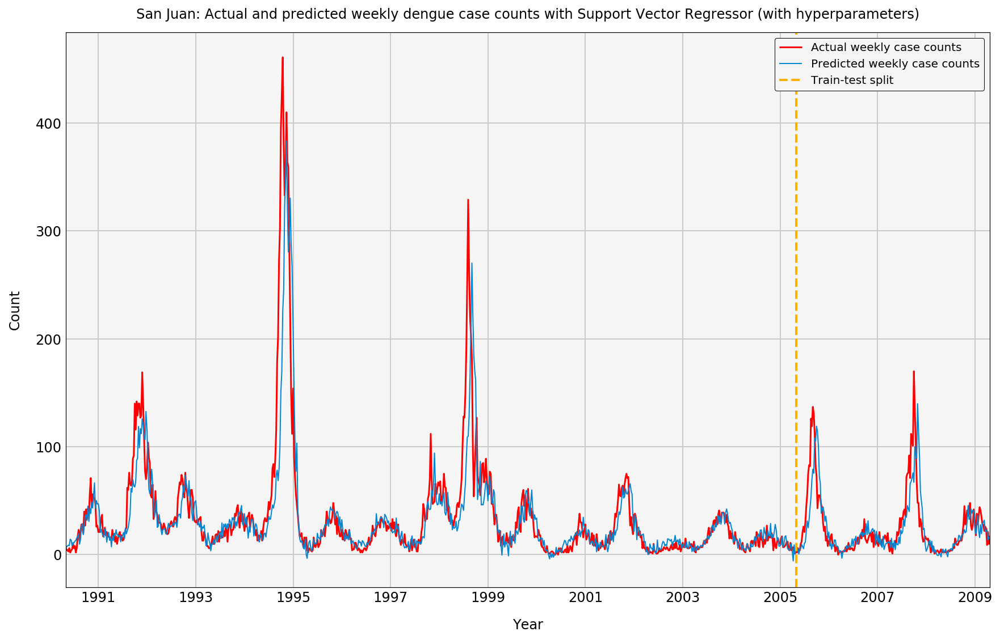

In [207]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = SVR_gs.predict(sj_X_train_df.iloc[:,:-1]).tolist() + \
              SVR_gs.predict(sj_X_test_df.iloc[:,:-1]).tolist()
sj_predictions['model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Support Vector Regressor (with hyperparameters)',
                        'upper right')

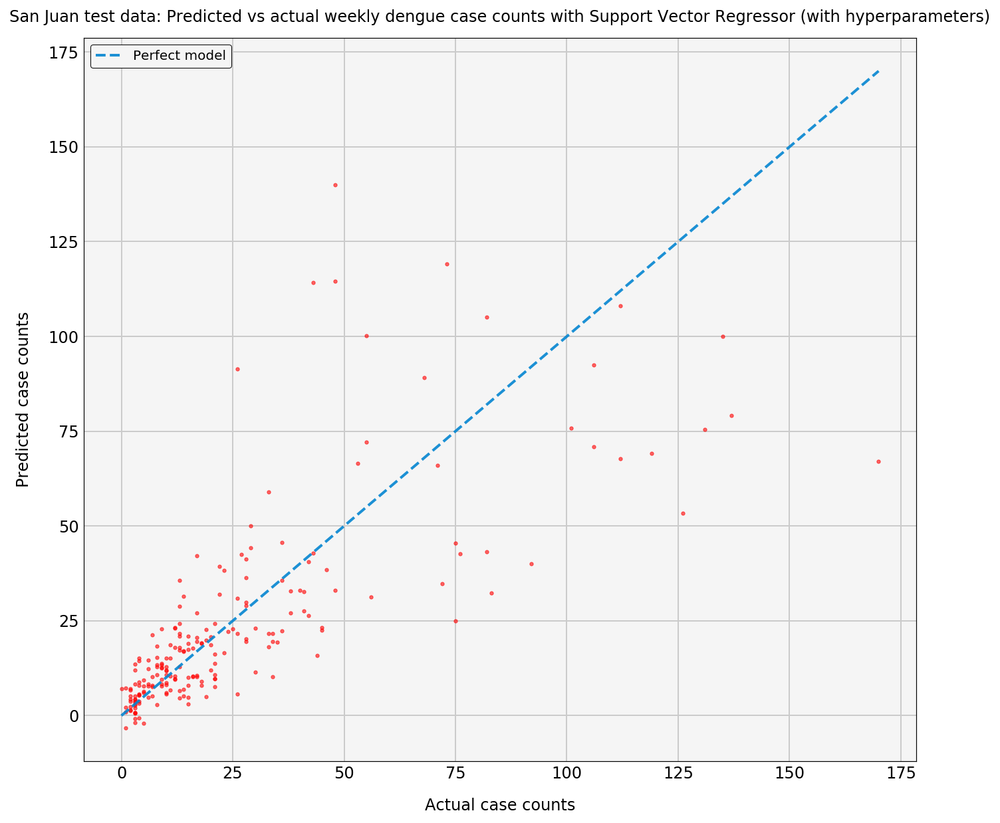

In [209]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'Support Vector Regressor (with hyperparameters)', 'upper left')

In [211]:
# Print zero adjusted R2 and RMSEs
print(f'Adjusted R2 and RMSE with negative values adjusted to 0: {return_r2_rmse(SVR_gs.predict(sj_X_test_df.iloc[:,:-1]), sj_y_test_df)}')

Adjusted R2 and RMSE with negative values adjusted to 0: (0.543, 20)


The model performs well in predicting the test data, with an R2 score and RMSE of 0.542 and 20 respectively.  The model does predict some negative values in the test time series, which impacts this R2 score very slightly.  In addition to this, the model again lags the timeseries and it underestimates the 2005 and 2007 peaks in the test data.  As shown in the scatter plot, similar to other models the performance of the model erodes as the magnitude of the actual weekly case counts increase.

<b>Support Vector Regressor with the 4-year time lagged dengue counts</b>

In [215]:
# Fit Support Vector Regressor to data, including the 4y lagged dengue cases
SVR_Pipeline.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:])

scores = cross_val_score(SVR_Pipeline, sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:], 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df, SVR_Pipeline.predict(sj_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(SVR_Pipeline.score(sj_X_train_df.iloc[208:,:], \
sj_y_train_df.total_cases[208:]),3)}')
print(f'R2 score on test data: {round(SVR_Pipeline.score(sj_X_test_df, \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.105, 0.089, 0.073, 0.004, -0.0]
Mean cross validation score on training data: 0.054
R2 score on full training data set: 0.072
R2 score on test data: 0.207
Root mean square error on test data: 26


Once again, the accuracy scores on the default model are low.  I'll GridSearch on the hyperparameters to try to improve this.

<b> GridSearch</b>

In [216]:
# Define GridSearch parameters 
SVR_params = {#'pca__n_components': (10,17,20,25,None),
             'svr__gamma': np.logspace(-5, 2, 10),
             'svr__C': np.logspace(-3, 2, 10),
             'svr__kernel': ['rbf', 'sigmoid', 'linear', 'poly']}

SVR_gs = GridSearchCV(SVR_Pipeline, SVR_params, cv=5, verbose=1)
SVR_gs.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:])

Fitting 5 folds for each of 400 candidates, totalling 2000 fits


[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:  2.6min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'svr__gamma': array([1.00000e-05, 5.99484e-05, 3.59381e-04, 2.15443e-03, 1.29155e-02,
       7.74264e-02, 4.64159e-01, 2.78256e+00, 1.66810e+01, 1.00000e+02]), 'svr__C': array([1.00000e-03, 3.59381e-03, 1.29155e-02, 4.64159e-02, 1.66810e-01,
       5.99484e-01, 2.15443e+00, 7.74264e+00, 2.78256e+01, 1.00000e+02]), 'svr__kernel': ['rbf', 'sigmoid', 'linear', 'poly']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [217]:
# Print Support Vector Regressor best paramaters
print(f"Best parameters: {SVR_gs.best_params_}")

Best parameters: {'svr__C': 2.1544346900318843, 'svr__gamma': 1e-05, 'svr__kernel': 'linear'}


In [221]:
# Calculate MSE on test data for best model found in gridsearch
mse = mean_squared_error(sj_y_test_df, SVR_gs.predict(sj_X_test_df))

print(f'Best mean cross validated score from gridsearch: {round(SVR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(SVR_gs.score(sj_X_train_df.iloc[208:,], \
sj_y_train_df.total_cases[208:]),3)}')
print(f'R2 score on test data: {round(SVR_gs.score(sj_X_test_df, \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

# Print zero adjusted R2 and RMSEs
print(f'Adjusted R2 and RMSE when negative case counts \
adjusted to 0: {return_r2_rmse(SVR_gs.predict(sj_X_test_df), sj_y_test_df)}')


# print(SVR_gs.best_score_)
# best_svm = SVR_gs.best_estimator_

Best mean cross validated score from gridsearch: 0.581
Best R2 score on full training data set: 0.705
R2 score on test data: 0.542
Root mean square error on test data: 20
Adjusted R2 and RMSE when negative case counts adjusted to 0: (0.542, 20)


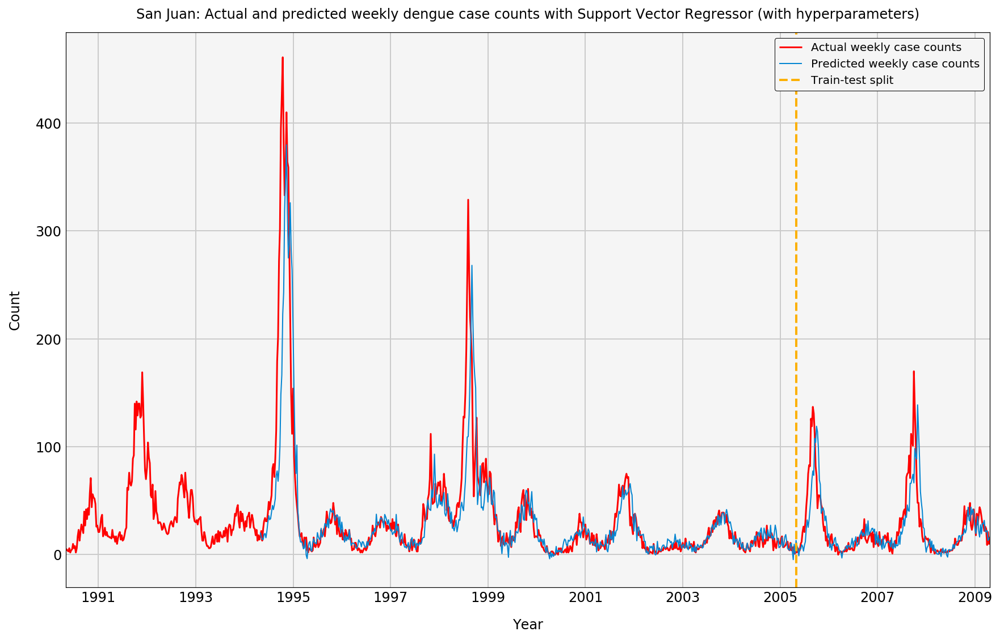

In [223]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = SVR_gs.predict(sj_X_train_df.iloc[208:,:]).tolist() + \
              SVR_gs.predict(sj_X_test_df).tolist()
sj_predictions.loc['1994-04-30':,'model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'Support Vector Regressor (with hyperparameters)', 
                        'upper right')

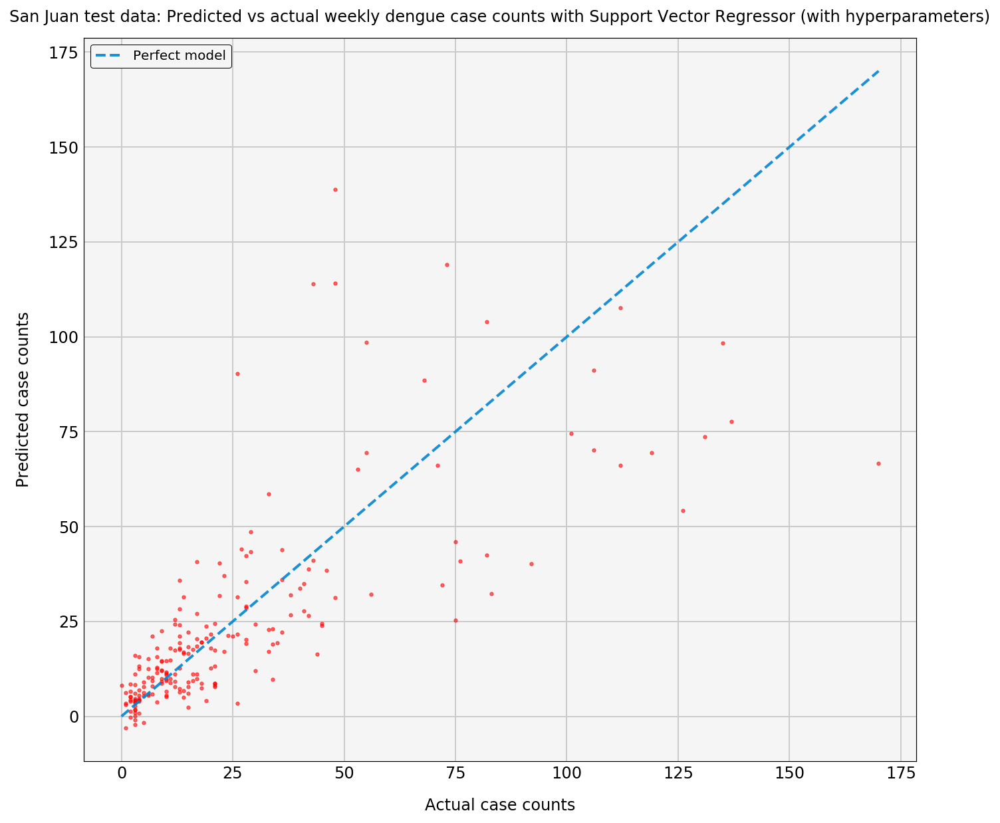

In [225]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'Support Vector Regressor (with hyperparameters)', 'upper left')

This model performs similarly well to that without the lagged 4-year dengue case counts included as a predictor.

#### KNeighbors Regressor

<b>KNeighbors Regressor without the 4-year time lagged dengue counts</b>

In [234]:
# Define KNeighbors Regressor pipeline
# Deactivating pca step
KNR_Pipeline = Pipeline([('ss', StandardScaler()),
                        ('pca', PCA(n_components=18)),
                        ('knr', KNeighborsRegressor(n_neighbors=10))])

In [237]:
# Fit KNeighbors Regressor to data, excluding the 4y lagged dengue cases
KNR_Pipeline.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)

scores = cross_val_score(KNR_Pipeline, sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases, 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df, KNR_Pipeline.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(KNR_Pipeline.score(sj_X_train_df.iloc[:,:-1], \
sj_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(KNR_Pipeline.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.763, 0.408, 0.604, 0.685, 0.628]
Mean cross validation score on training data: 0.618
R2 score on full training data set: 0.73
R2 score on test data: 0.361
Root mean square error on test data: 23


The model performs significantly better with PCA. I'll now take a look at this model with a GridSearch.

<b>GridSearch</b>

In [241]:
# Define GridSearch parameters 

KNR_params = {'pca__n_components': list(range(17,25)),
              'knr__n_neighbors': list(range(10,201,2)),
              #'knr__weights':['distance'],
              'knr__metric':['euclidean','manhattan', 'minkowski']}

KNR_gs = GridSearchCV(KNR_Pipeline, KNR_params, verbose=1,
                     cv=KFold(n_splits=5, shuffle=True, random_state=1))
KNR_gs.fit(sj_X_train_df.iloc[:,:-1], sj_y_train_df.total_cases)


Fitting 5 folds for each of 2304 candidates, totalling 11520 fits


[Parallel(n_jobs=1)]: Done 11520 out of 11520 | elapsed:  5.4min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('pca', PCA(copy=True, iterated_power='auto', n_components=18, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('knr', KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=10, p=2,
          weights='uniform'))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'pca__n_components': [17, 18, 19, 20, 21, 22, 23, 24], 'knr__n_neighbors': [10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96, 98, 100, 102, 104, 106, 108, 110, 11...84, 186, 188, 190, 192, 194, 196, 198, 200], 'knr__metric': ['euclidean', 'manhattan', 'minkowski']},
       pre_dispatch='2*n_jobs', 

In [242]:
# Print KNeighbors best paramaters
print(f"Best parameters: {KNR_gs.best_params_}")

Best parameters: {'knr__metric': 'manhattan', 'knr__n_neighbors': 10, 'pca__n_components': 17}


In [243]:
# Calculate MSE on test data using best model found in gridsearch
mse = mean_squared_error(sj_y_test_df, KNR_gs.predict(sj_X_test_df.iloc[:,:-1]))

print(f'Best mean cross validated score from gridsearch: {round(KNR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(KNR_gs.score(sj_X_train_df.iloc[:,:-1], \
sj_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(KNR_gs.score(sj_X_test_df.iloc[:,:-1], \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Best mean cross validated score from gridsearch: 0.647
Best R2 score on full training data set: 0.727
R2 score on test data: 0.374
Root mean square error on test data: 23


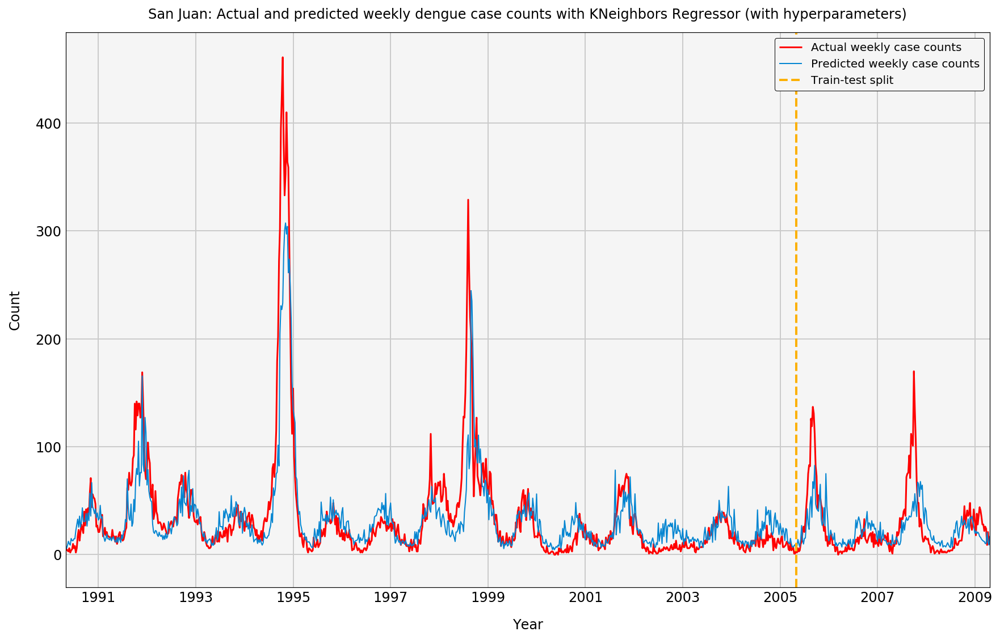

In [245]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = KNR_gs.predict(sj_X_train_df.iloc[:,:-1]).tolist() + \
              KNR_gs.predict(sj_X_test_df.iloc[:,:-1]).tolist()
sj_predictions['model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'KNeighbors Regressor (with hyperparameters)',
                        'upper right')

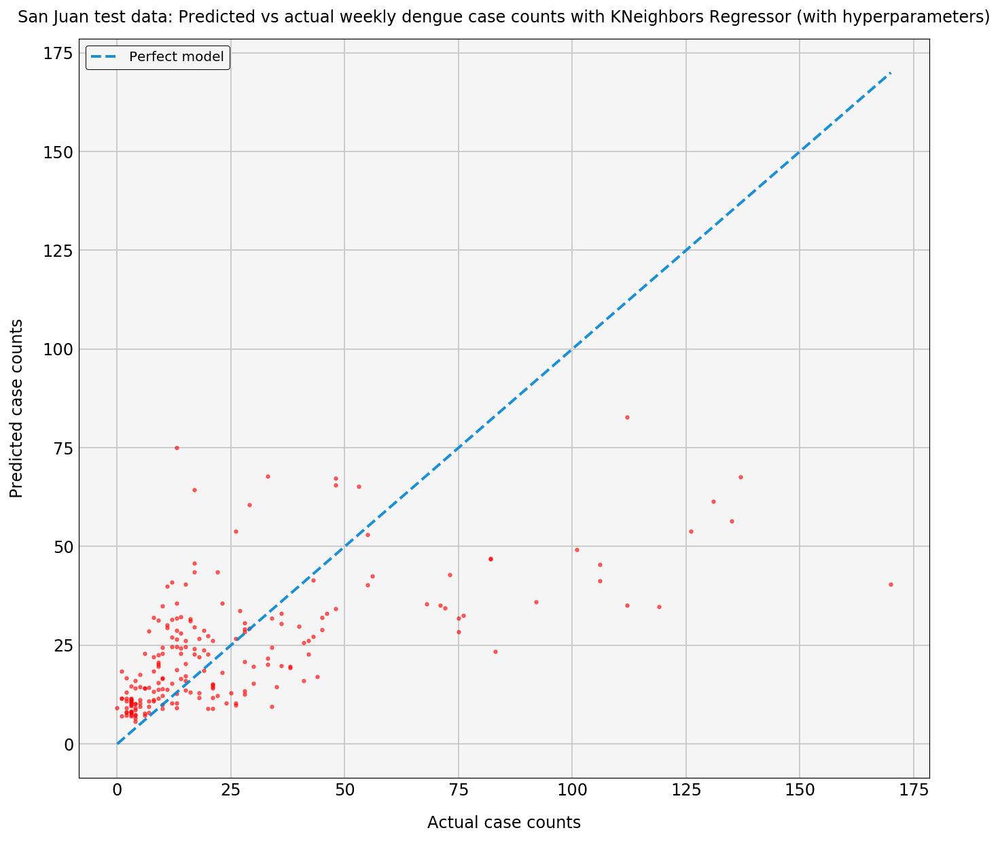

In [247]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'KNeighbors Regressor (with hyperparameters)', 'upper left')

The KNeighbors Regressor appears to be hypersensitive, overestimating weekly case counts when actual values are low and underestimate the peaks.    

<b>KNeighbors Regressor with the 4-year time lagged dengue counts</b>

In [248]:
# Fit Support Vector Regresspr to data, excluding the 4y lagged dengue cases

KNR_Pipeline = Pipeline([('ss', StandardScaler()),
                        ('pca', PCA(n_components=18)),
                        #('pca', PCA(n_components=20)),
                        ('knr', KNeighborsRegressor(n_neighbors=10))])

KNR_Pipeline.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:])

scores = cross_val_score(KNR_Pipeline, sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:], 
                         cv=KFold(n_splits=3, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(sj_y_test_df, KNR_Pipeline.predict(sj_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(KNR_Pipeline.score(sj_X_train_df.iloc[208:,:], \
sj_y_train_df.total_cases[208:]),3)}')
print(f'R2 score on test data: {round(KNR_Pipeline.score(sj_X_test_df, \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.744, 0.549, 0.493]
Mean cross validation score on training data: 0.595
R2 score on full training data set: 0.745
R2 score on test data: 0.332
Root mean square error on test data: 24


The model looks as if it may be overfitting.  I'll now grid search the KNeighbors hyperparamaters to try to improve the model performance.

<b>GridSearch</b>

In [249]:
KNR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=18)),
                        ('pca', PCA()),
                        ('knr', KNeighborsRegressor(n_neighbors=10))])

KNR_params = {'pca__n_components': list(range(14,25)),
              'knr__n_neighbors': list(range(10,65,2)),
              #'knr__weights':['distance'],
              'knr__metric':['euclidean','manhattan', 'minkowski']}

KNR_gs = GridSearchCV(KNR_Pipeline, KNR_params, cv=KFold(n_splits=5, shuffle=True), verbose=1)
KNR_gs.fit(sj_X_train_df.iloc[208:,:], sj_y_train_df.total_cases[208:])

Fitting 5 folds for each of 924 candidates, totalling 4620 fits


[Parallel(n_jobs=1)]: Done 4620 out of 4620 | elapsed:   58.8s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('pca', PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('knr', KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=10, p=2,
          weights='uniform'))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'pca__n_components': [14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], 'knr__n_neighbors': [10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64], 'knr__metric': ['euclidean', 'manhattan', 'minkowski']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [250]:
# Print KNeighbor Regressor best paramaters
print(f"Best parameters: {KNR_gs.best_params_}")

Best parameters: {'knr__metric': 'euclidean', 'knr__n_neighbors': 10, 'pca__n_components': 16}


In [251]:
# Calculate MSE on test data using best model found in gridsearch
mse = mean_squared_error(sj_y_test_df, KNR_gs.predict(sj_X_test_df))

print(f'Best mean cross validated score from gridsearch: {round(KNR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(KNR_gs.score(sj_X_train_df.iloc[208:,], \
sj_y_train_df.total_cases[208:]),3)}')
print(f'R2 score on test data: {round(KNR_gs.score(sj_X_test_df, \
sj_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Best mean cross validated score from gridsearch: 0.664
Best R2 score on full training data set: 0.741
R2 score on test data: 0.346
Root mean square error on test data: 24


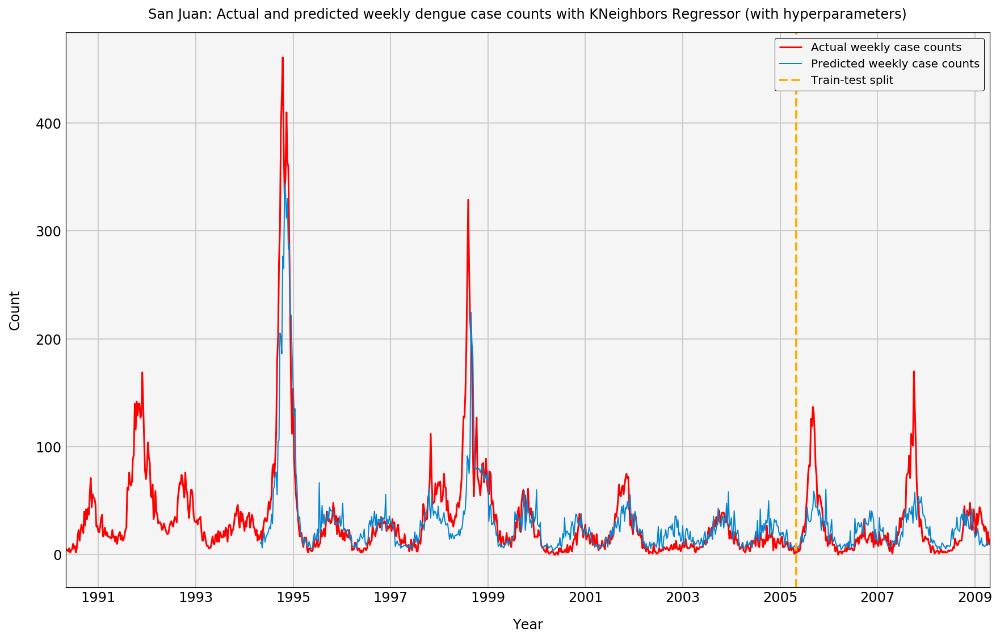

In [253]:
# Store modeled values for train and test set in dataframe with actual values
sj_predictions = sj_df[['total_cases']].copy()
predictions = KNR_gs.predict(sj_X_train_df.iloc[208:,:]).tolist() + \
              KNR_gs.predict(sj_X_test_df).tolist()
sj_predictions.loc['1994-04-30':,'model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(sj_predictions, 'San Juan', 'KNeighbors Regressor (with hyperparameters)', 
                        'upper right')

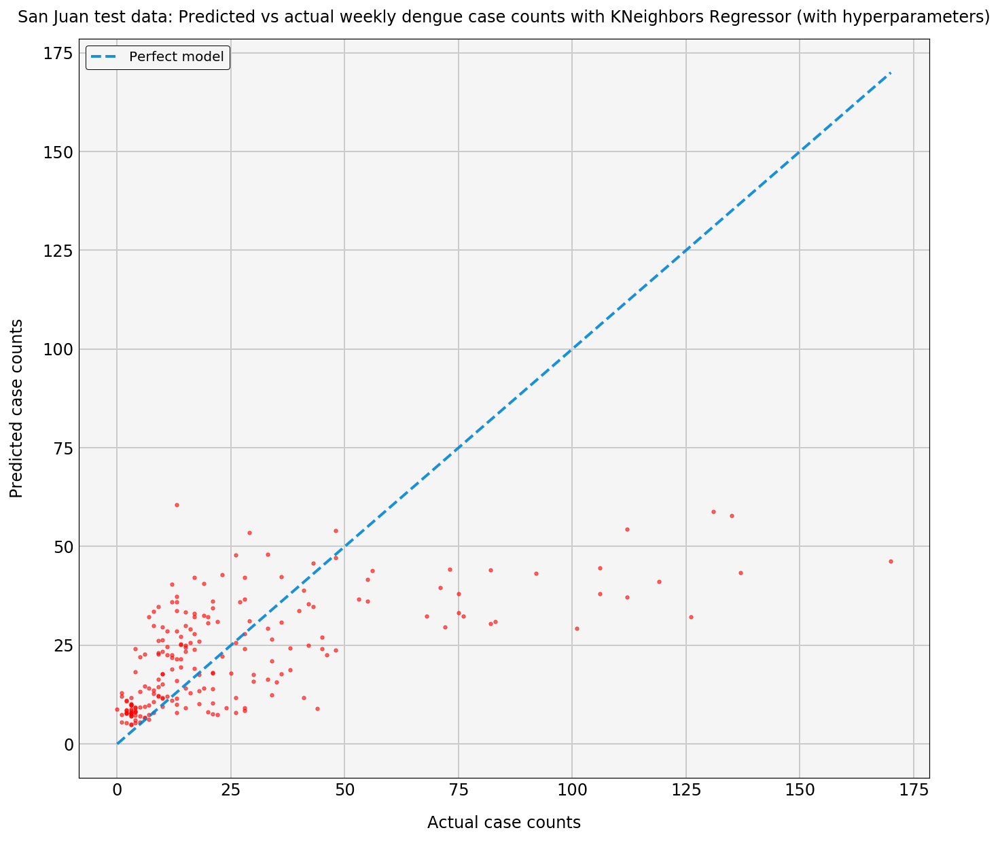

In [254]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(sj_predictions.loc['2005-04-30':], 
                            'San Juan', 'KNeighbors Regressor (with hyperparameters)', 'upper left')

Once again, this model underestimates the peaks in the test time series and over estimates the lower values.  

### Iquitos

I'll now model the weekly dengue case counts for Iquitos using the same 5 models.

#### Multi Linear Regression Model

In [297]:
# Define Linear Regression pipeline
# PCA defined with 17 principal components, as per analysis above
LR_Pipeline = Pipeline([('ss', StandardScaler()),
                        ('pca', PCA(n_components=23)),       
                        ('linreg', LinearRegression())])

In [303]:
# Fit Linear Regression model to data
LR_Pipeline.fit(iq_X_train_df, iq_y_train_df)

scores = cross_val_score(LR_Pipeline, iq_X_train_df, iq_y_train_df, 
                         cv=KFold(n_splits=5, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(iq_y_test_df, LR_Pipeline.predict(iq_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(LR_Pipeline.score(iq_X_train_df, iq_y_train_df),3)}')
print(f'R2 score on test data: {round(LR_Pipeline.score(iq_X_test_df, iq_y_test_df),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [0.356, 0.137, 0.394, 0.309, -0.778]
Mean cross validation score on training data: 0.084
R2 score on full training data set: 0.359
R2 score on test data: 0.207
Root mean square error on test data: 12


In [304]:
# Print the baseline prediction (i.e. the mean) of the test set
print(f'Baseline prediction (i.e. the mean) of weekly dengue case counts on train set: \
{round(np.mean(iq_y_train_df.total_cases))}')
print(f'Baseline prediction of weekly dengue case counts on test set: \
{round(np.mean(iq_y_test_df.total_cases))}')
print()
print(f'Variance of weekly dengue case counts on train set: {round(iq_y_train_df.total_cases.var(),2)}')
print(f'Variance of weekly dengue case counts on test set: {round(iq_y_test_df.total_cases.var(),2)}')

Baseline prediction (i.e. the mean) of weekly dengue case counts on train set: 7
Baseline prediction of weekly dengue case counts on test set: 12

Variance of weekly dengue case counts on train set: 101.76
Variance of weekly dengue case counts on test set: 187.08


The model has a large range of cross validation accuracy scores on the train set, suggesting that the model has mixed results in learning the train data. I suspect this is due to the significant peak associated with the 2004 epidemic and the extended period of time at the beginning of the time series with mostly 0 weekly case counts. 

I'll now visualise the predictions to try to get a better understanding of what's happening.

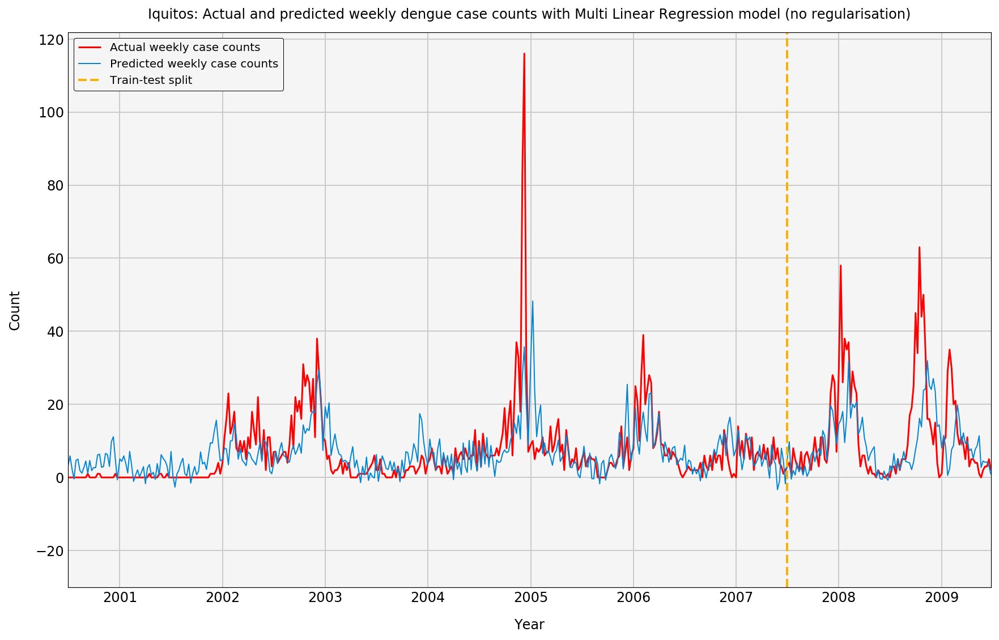

In [305]:
# Store modeled values for train and test set in dataframe with actual values
iq_predictions = iq_df[['total_cases']].copy()
predictions = LR_Pipeline.predict(iq_X_train_df).tolist() + \
              LR_Pipeline.predict(iq_X_test_df).tolist()
iq_predictions['model_predictions'] = [prediction[0] for prediction in predictions]

# Plot actuals vs predicted values
plot_actual_vs_pred_line(iq_predictions, 'Iquitos', 'Multi Linear Regression model (no regularisation)', 
                        'upper left')

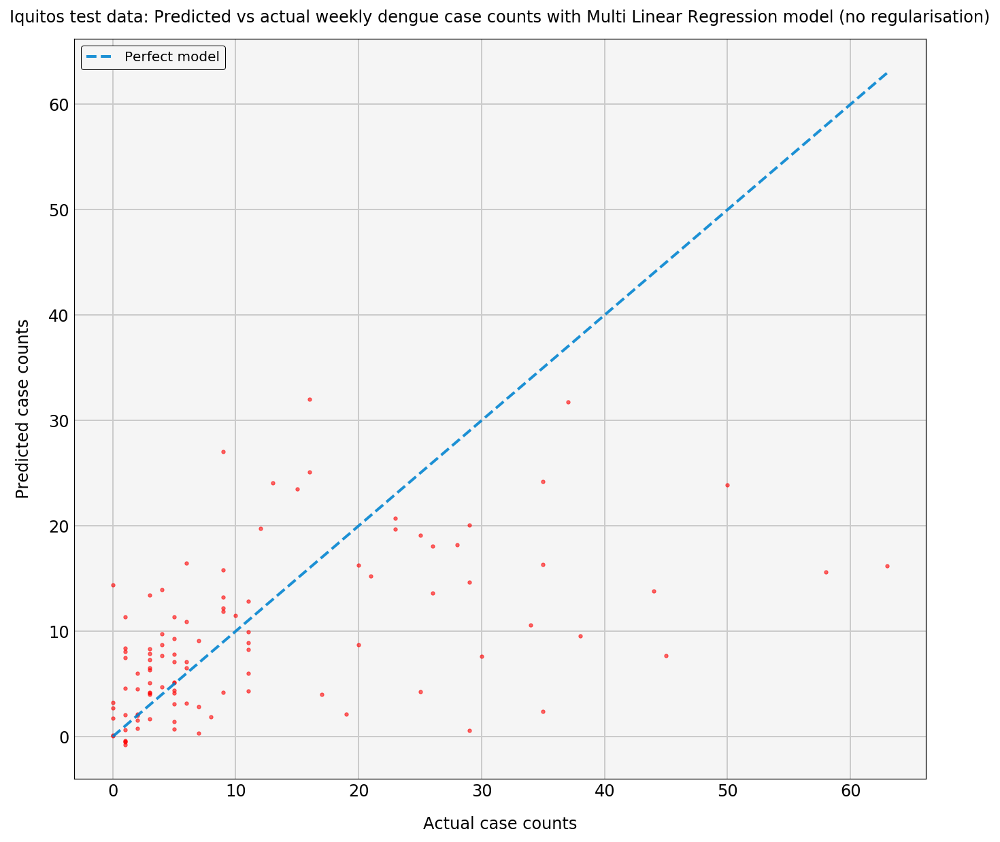

In [306]:
plot_actual_vs_pred_scatter(iq_predictions.loc['2007-07-01':,],
                            'Iquitos', 'Multi Linear Regression model (no regularisation)', 'upper left')

A few points to note on the charts above:

- The model is doing an OK job of predicting the shape of the actual weekly dengue case count time series. 
- Having said that, the model hasn't trained so well to the actual data and the model doesn't accurately predict the short, sharp peak at the end of 2004.  The model hasn't trained well to replicating the low (almost zero) dengue case counts prior to 2002 either - explaining the lower accuracy score on the training data set, and the mix of cross validation scores.
- The model doesn't appear to perform notably worse on the test data than the training data, however the variance of the test data is much greater than that of the training data, which will be difficult to accurately capture - which is probably one of the reasons for the lower accuracy score on the test data.

<b>I'll now do a grid search with ElasticNetCv to see if I can improve the model with regularisation</b>

In [310]:
EN_Pipeline = Pipeline([('ss', StandardScaler()),
                        ('pca', PCA(n_components=23)),       
                        ('en', ElasticNet(random_state=1, selection='random'))])

# Define ElasticNetCV parameters
EN_params = {'en__l1_ratio': np.linspace(0, 1, 300),
             'en__alpha': np.logspace(-2, 2, 50)}

EN_gs = GridSearchCV(EN_Pipeline, EN_params, verbose=1, 
                     cv=KFold(n_splits=5, shuffle=True, random_state=1))

EN_gs.fit(iq_X_train_df, iq_y_train_df)

Fitting 5 folds for each of 15000 candidates, totalling 75000 fits


/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/Matt/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not conver

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('pca', PCA(copy=True, iterated_power='auto', n_components=23, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('en', ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=1, selection='random', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'en__l1_ratio': array([0.     , 0.00334, ..., 0.99666, 1.     ]), 'en__alpha': array([1.00000e-02, 1.20679e-02, 1.45635e-02, 1.75751e-02, 2.12095e-02,
       2.55955e-02, 3.08884e-02, 3.72759e-02, 4.49843e-02, 5.42868e-02,
       6.55129e-02, 7.90604e-02, 9.54095e-02, 1.15140e-01, 1.3895... 3.23746e+01, 3.90694e+01,
       4.71487e+01, 5.68987e+01, 6.86649e+01, 8.28643e+01

In [308]:
# Print optimal ElasticNet regularisation strength and ratio
print(f"Optimum alpha: {EN_gs.best_params_['en__alpha']}")
print(f"Optimum l1_ratio: {EN_gs.best_params_['en__l1_ratio']}")

Optimum alpha: 1.0985411419875584
Optimum l1_ratio: 0.0802675585284281


In [309]:
# Calculate MSE on test data using the best model found in the gridsearch
mse = mean_squared_error(iq_y_test_df,EN_gs.predict(iq_X_test_df))

print(f'Best mean cross validated score from gridsearch: {round(EN_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(EN_gs.score(iq_X_train_df, iq_y_train_df),3)}')
print(f'R2 score on test data: {round(EN_gs.score(iq_X_test_df, iq_y_test_df),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

# Print zero adjusted R2 and RMSEs, with top 10 coefficients
print(f'Adjusted R2 and RMSE when negs adjusted to 0: {return_r2_rmse(EN_gs.predict(iq_X_test_df), iq_y_test_df)}')


Best mean cross validated score from gridsearch: 0.216
Best R2 score on full training data set: 0.304
R2 score on test data: 0.124
Root mean square error on test data: 12
Adjusted R2 and RMSE when negs adjusted to 0: (0.124, 12)


In [ ]:
Regularisation has significantly improved the fit of the data to the training data, but the model hasn't generalised well to the test data.

#### Random Forest Regressor 

In [608]:
# Define Random Forest Regressor pipeline
# Deactive PCA step
RFR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=24)),
                        ('rfr', RandomForestRegressor(random_state=10))])

In [611]:
# Fit Random Forest Regression model to data, excluding the 4y lagged dengue cases
RFR_Pipeline.fit(iq_X_train_df, iq_y_train_df.total_cases)

scores = cross_val_score(RFR_Pipeline, iq_X_train_df, iq_y_train_df.total_cases, 
                         cv=KFold(n_splits=3, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(iq_y_test_df, RFR_Pipeline.predict(iq_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(RFR_Pipeline.score(iq_X_train_df, \
iq_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(RFR_Pipeline.score(iq_X_test_df, \
iq_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Individual cross validation scores on training data: [0.396, 0.438, 0.178]
Mean cross validation score on training data: 0.337
R2 score on full training data set: 0.872
R2 score on test data: 0.178
Root mean square error on test data: 12


The mean cross validation score for the taining data is relatively low, implying overfitting, and the model doesn;t generalise well to the test data.

I'll visualise the predictions to see if I can understand what's happeing here.

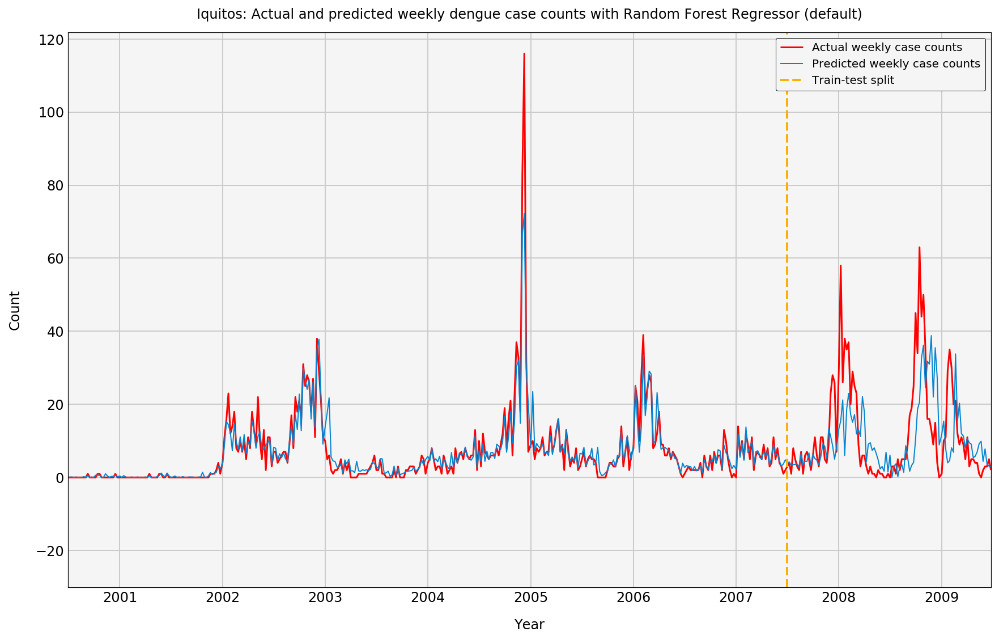

In [612]:
# Store modeled values for train and test set in dataframe with actual values
iq_predictions = iq_df[['total_cases']].copy()
predictions = RFR_Pipeline.predict(iq_X_train_df).tolist() + \
              RFR_Pipeline.predict(iq_X_test_df).tolist()

iq_predictions['model_predictions'] = predictions

# Call function to plot actual vs modeled time series
plot_actual_vs_pred_line(iq_predictions, 'Iquitos', 'Random Forest Regressor (default)')

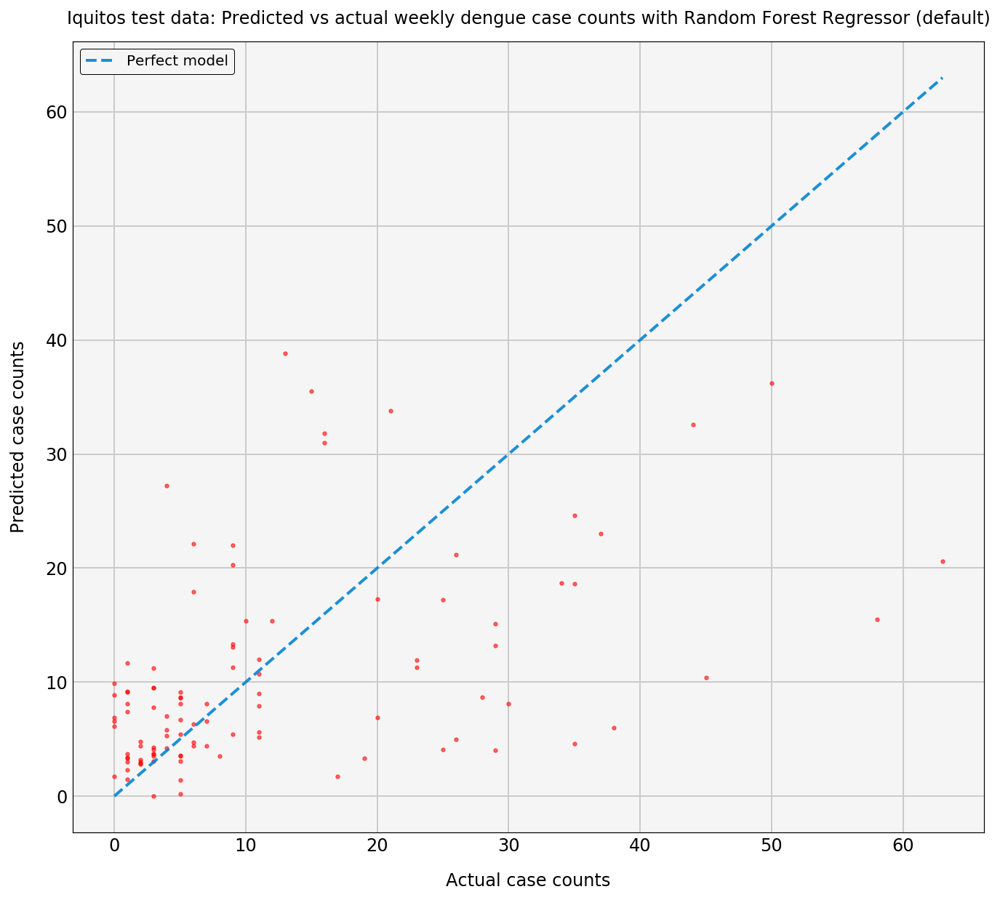

In [613]:
plot_actual_vs_pred_scatter(iq_predictions.loc['2007-07-01':,], 'Iquitos', 'Random Forest Regressor (default)')

The model has clearly learned the training data well, but significantly underestimates the 2004 peak.  On the test data, the model mistimes and underestimates the peaks.

<b>GridSearch</b>

In [624]:
# Define Random Forest Regressor pipeline
# Deactivate the PCA step
RFR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA()),
                        ('rfr', RandomForestRegressor(random_state=10))])

# Define RFR hyperparameters
RFR_params = {#'pca__n_components': (10, 17, 20, 25, None),
             'rfr__max_depth': np.linspace(10, 30, 21),
             'rfr__max_features': ('sqrt','log2',5, 8, 10,'auto'),
             'rfr__min_samples_split':[3, 5, 6, 7, 8, 15],
}

RFR_gs = GridSearchCV(RFR_Pipeline, RFR_params, cv=KFold(n_splits=3, shuffle=True, random_state=1), 
                      verbose=1)

RFR_gs.fit(iq_X_train_df, iq_y_train_df.total_cases)

Fitting 3 folds for each of 756 candidates, totalling 2268 fits


[Parallel(n_jobs=1)]: Done 2268 out of 2268 | elapsed:   40.8s finished


GridSearchCV(cv=KFold(n_splits=3, random_state=1, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('rfr', RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=N...stimators=10, n_jobs=1,
           oob_score=False, random_state=10, verbose=0, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'rfr__max_depth': array([10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22.,
       23., 24., 25., 26., 27., 28., 29., 30.]), 'rfr__max_features': ('sqrt', 'log2', 5, 8, 10, 'auto'), 'rfr__min_samples_split': [3, 5, 6, 7, 8, 15]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [625]:
# Print Random Forest Regressor best paramaters
print(f"Best parameters: {RFR_gs.best_params_}")

Best parameters: {'rfr__max_depth': 13.0, 'rfr__max_features': 'auto', 'rfr__min_samples_split': 6}


In [626]:
scores = cross_val_score(RFR_Pipeline, iq_X_train_df, iq_y_train_df.total_cases, 
                         cv=KFold(n_splits=3, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]

mse = mean_squared_error(iq_y_test_df, RFR_gs.predict(iq_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(RFR_gs.score(iq_X_train_df, \
iq_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(RFR_gs.score(iq_X_test_df, \
iq_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Individual cross validation scores on training data: [0.396, 0.438, 0.178]
Mean cross validation score on training data: 0.337
R2 score on full training data set: 0.846
R2 score on test data: 0.215
Root mean square error on test data: 12


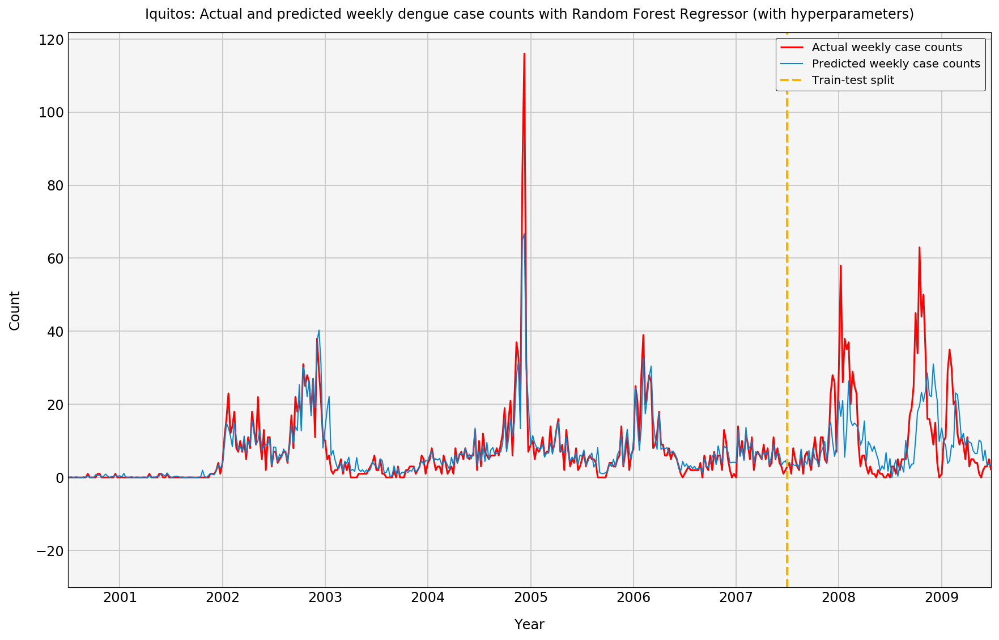

In [627]:
# Store modeled values for train and test set in dataframe with actual values
iq_predictions = iq_df[['total_cases']].copy()
predictions = RFR_gs.predict(iq_X_train_df).tolist() + \
              RFR_gs.predict(iq_X_test_df).tolist()
iq_predictions['model_predictions'] = predictions

# Call function to plot actual vs modeled time series
plot_actual_vs_pred_line(iq_predictions, 'Iquitos', 'Random Forest Regressor (with hyperparameters)')

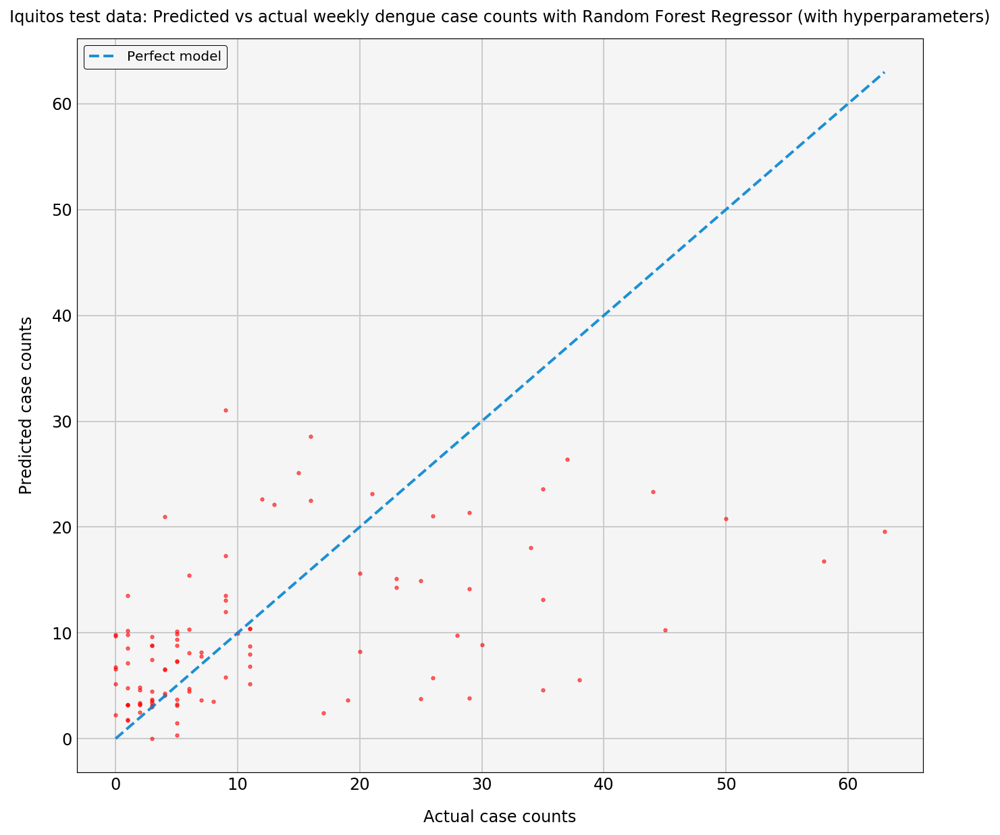

In [628]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(iq_predictions.loc['2007-07-01':,], 
                            'Iquitos', 'Random Forest Regressor (with hyperparameters)')

The grid search has identified hyperparameters to improve the performance of the RFR however, the accuracy score remains low due to lagging and underestimating the amplitude of the peaks in the test data.  Having said that, this is the highest test score I've achieved on the Iquitos data.

#### Support Vector Regressor

In [146]:
# Define Support Vector Regressor pipeline
# Deactivating pca step
SVR_Pipeline = Pipeline([('ss', StandardScaler()),
                       # ('pca', PCA(n_components=17)),
                        ('svr', SVR())])

In [147]:
# Fit Support Vector Regresspr to data, excluding the 4y lagged dengue cases
SVR_Pipeline.fit(iq_X_train_df, iq_y_train_df.total_cases)

scores = cross_val_score(SVR_Pipeline, iq_X_train_df, iq_y_train_df.total_cases, 
                         cv=KFold(n_splits=7, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(iq_y_test_df, SVR_Pipeline.predict(iq_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(SVR_Pipeline.score(iq_X_train_df, \
iq_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(SVR_Pipeline.score(iq_X_test_df, \
iq_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

Individual cross validation scores on training data: [-0.02, 0.051, 0.097, 0.177, -0.014, 0.123, 0.134]
Mean cross validation score on training data: 0.078
R2 score on full training data set: 0.127
R2 score on test data: -0.183
Root mean square error on test data: 14


The cross validation and accuracy scores for the training data are low.  I'm going to try to improve the performance of this model through a GridSearch.

<b>GridSearch</b>

In [148]:
# Define GridSearch parameters 
SVR_params = {#'pca__n_components': (10,17,20,25,None),
             'svr__gamma': np.logspace(-5, 2, 10),
             'svr__C': np.logspace(-3, 2, 10),
             'svr__kernel': ['rbf', 'sigmoid', 'linear', 'poly']}

SVR_gs = GridSearchCV(SVR_Pipeline, SVR_params, cv=5, verbose=1)
SVR_gs.fit(iq_X_train_df, iq_y_train_df.total_cases)

Fitting 5 folds for each of 400 candidates, totalling 2000 fits


[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:  3.0min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'svr__gamma': array([1.00000e-05, 5.99484e-05, 3.59381e-04, 2.15443e-03, 1.29155e-02,
       7.74264e-02, 4.64159e-01, 2.78256e+00, 1.66810e+01, 1.00000e+02]), 'svr__C': array([1.00000e-03, 3.59381e-03, 1.29155e-02, 4.64159e-02, 1.66810e-01,
       5.99484e-01, 2.15443e+00, 7.74264e+00, 2.78256e+01, 1.00000e+02]), 'svr__kernel': ['rbf', 'sigmoid', 'linear', 'poly']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [149]:
# Print Support Vector Regressor best paramaters
print(f"Best parameters: {SVR_gs.best_params_}")

Best parameters: {'svr__C': 100.0, 'svr__gamma': 0.0021544346900318843, 'svr__kernel': 'rbf'}


In [150]:
# Calculate MSE on test data from best model found in gridsearch
mse = mean_squared_error(iq_y_test_df, SVR_gs.predict(iq_X_test_df))

print(f'Best mean cross validated scor from gridsearch: {round(SVR_gs.best_score_,3)}')
print(f'R2 score on full training data set: {round(SVR_gs.score(iq_X_train_df, \
iq_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(SVR_gs.score(iq_X_test_df, \
iq_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')

# print(SVR_gs.best_params_)
# print(SVR_gs.best_score_)
# best_svm = SVR_gs.best_estimator_

Best mean cross validated scor from gridsearch: -30.869
R2 score on full training data set: 0.465
R2 score on test data: 0.149
Root mean square error on test data: 12


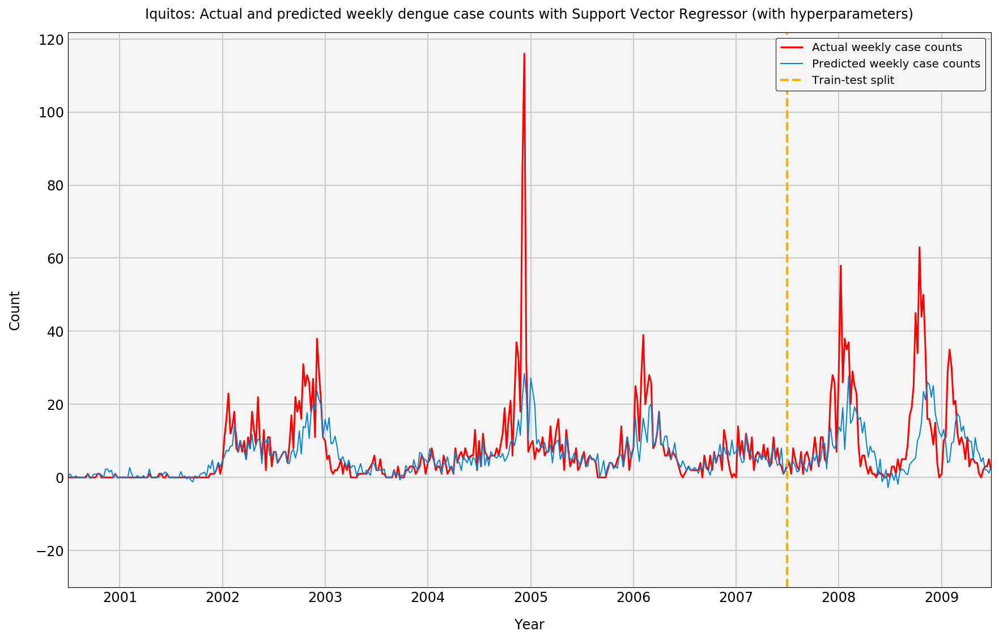

In [151]:
# Store modeled values for train and test set in dataframe with actual values
iq_predictions = iq_df[['total_cases']].copy()
predictions = SVR_gs.predict(iq_X_train_df).tolist() + \
              SVR_gs.predict(iq_X_test_df).tolist()
iq_predictions['model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(iq_predictions, 'Iquitos', 'Support Vector Regressor (with hyperparameters)')

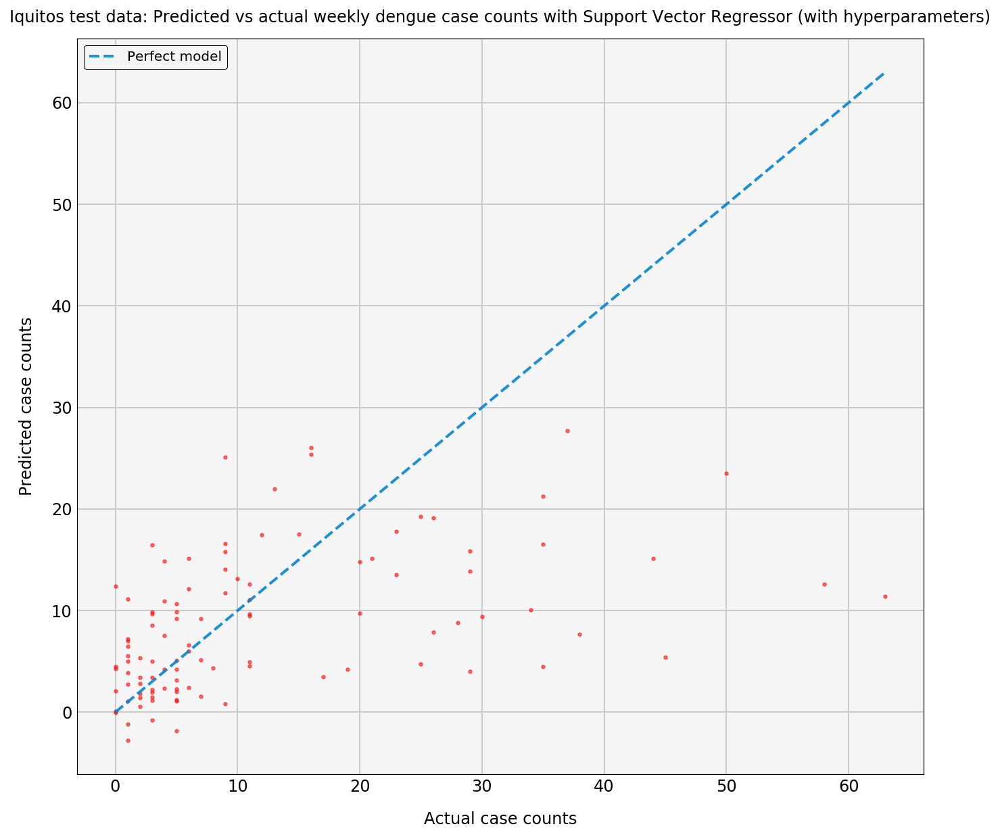

In [152]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(iq_predictions.loc['2007-07-01':], 
                            'Iquitos', 'Support Vector Regressor (with hyperparameters)')

The model doesn't perform well in learning the training data or predicting the test set.

#### Extra Trees Regressor

In [153]:
# Define Extra Trees Regressor pipeline
# Deactive PCA step
ETR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=24)),
                        ('etr', ExtraTreesRegressor(random_state=10))])

In [154]:
# Fit Random Forest Regression model to data, excluding the 4y lagged dengue cases
ETR_Pipeline.fit(iq_X_train_df, iq_y_train_df.total_cases)

scores = cross_val_score(ETR_Pipeline, iq_X_train_df, iq_y_train_df.total_cases, 
                         cv=KFold(n_splits=7, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(iq_y_test_df, ETR_Pipeline.predict(iq_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(ETR_Pipeline.score(iq_X_train_df, \
iq_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(ETR_Pipeline.score(iq_X_test_df, \
iq_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Individual cross validation scores on training data: [0.503, 0.237, 0.28, 0.52, 0.264, 0.538, 0.173]
Mean cross validation score on training data: 0.359
R2 score on full training data set: 1.0
R2 score on test data: 0.049
Root mean square error on test data: 13


Reviewing the cross validation scores, the model appears to be overfitting the training data but the overall accuracy score on the training data is high.  I don't understand this.

I'll visualise the predictions to see if I can understand what's happeing here.

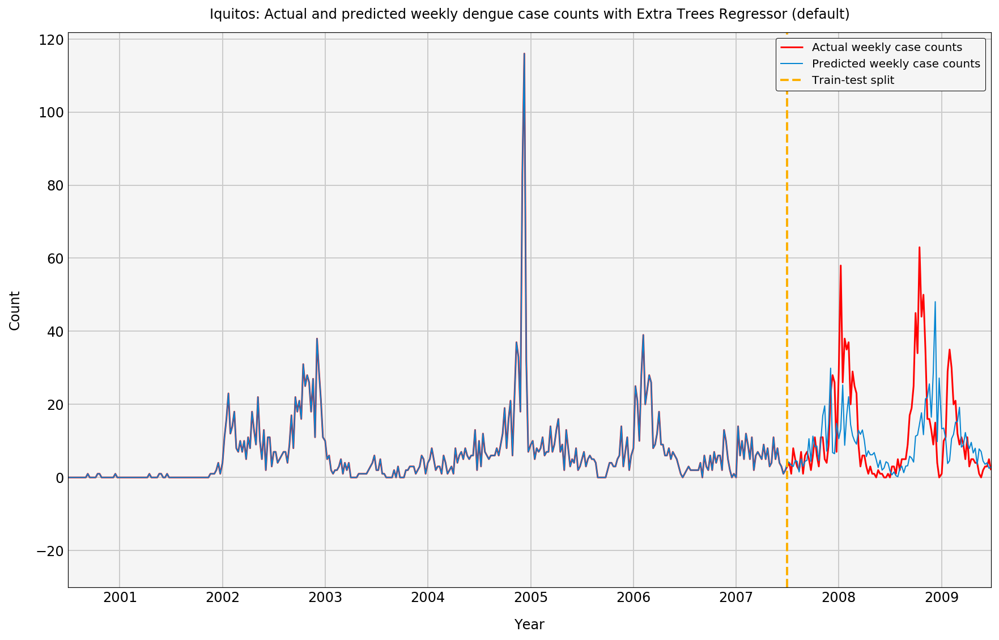

In [155]:
# Store modeled values for train and test set in dataframe with actual values
iq_predictions = iq_df[['total_cases']].copy()
predictions = ETR_Pipeline.predict(iq_X_train_df).tolist() + \
              ETR_Pipeline.predict(iq_X_test_df).tolist()

iq_predictions['model_predictions'] = predictions

# Call function to plot actual vs modeled time series
plot_actual_vs_pred_line(iq_predictions, 'Iquitos', 'Extra Trees Regressor (default)')

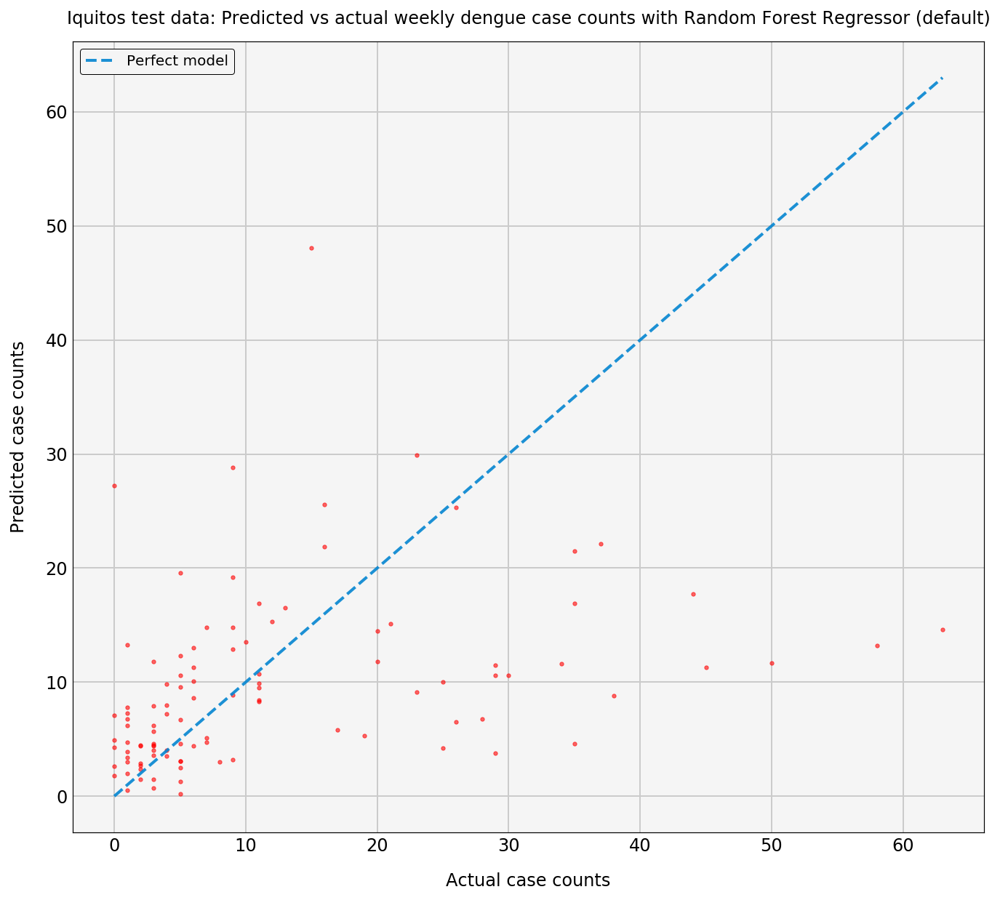

In [156]:
plot_actual_vs_pred_scatter(iq_predictions.loc['2007-07-01':,], 'Iquitos', 'Random Forest Regressor (default)')

The model has clearly learned the training data very well, but is lagging and underestimating the amplitude of the peaks in the test data.

<b>GridSearch</b>

In [157]:
# Define Random Forest Regressor pipeline
# Deactivate the PCA step
ETR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA()),
                        ('etr', ExtraTreesRegressor(random_state=10))])

# Define ETR hyperparameters
ETR_params = {#'pca__n_components': (10,17,20,25,None),
             'etr__max_depth': np.linspace(1,40,10),
             'etr__max_features': ('sqrt','log2',5, 8, 10,'auto'),
             'etr__min_samples_split':[2, 3],
             'etr__max_leaf_nodes': [2, 5, 10, 12, 14, None]
}

ETR_gs = GridSearchCV(ETR_Pipeline, ETR_params, cv=5, verbose=1)

ETR_gs.fit(iq_X_train_df, iq_y_train_df.total_cases)

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=1)]: Done 3600 out of 3600 | elapsed:   43.6s finished


GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('etr', ExtraTreesRegressor(bootstrap=False, criterion='mse', max_depth=None,
          max_features='auto', max_leaf_nodes=None,
          min_impurity_decrease=0.0, min_impurity_split=None,
          min_samples_leaf=1, min_samples_split=2,
          min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
          oob_score=False, random_state=10, verbose=0, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'etr__max_depth': array([ 1.     ,  5.33333,  9.66667, 14.     , 18.33333, 22.66667,
       27.     , 31.33333, 35.66667, 40.     ]), 'etr__max_features': ('sqrt', 'log2', 5, 8, 10, 'auto'), 'etr__min_samples_split': [2, 3], 'etr__max_leaf_nodes': [2, 5, 10, 12, 14, None]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [158]:
# Print Extra Trees Regressor best paramaters
print(f"Best parameters: {ETR_gs.best_params_}")

Best parameters: {'etr__max_depth': 9.666666666666666, 'etr__max_features': 'auto', 'etr__max_leaf_nodes': None, 'etr__min_samples_split': 3}


In [159]:
# Calculate MSE on test data from best model found in gridsearch
mse = mean_squared_error(iq_y_test_df, ETR_gs.predict(iq_X_test_df))

print(f'Best mean cross validated score from gridsearch: {round(ETR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(ETR_gs.score(iq_X_train_df, \
iq_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(ETR_gs.score(iq_X_test_df, \
iq_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Best mean cross validated score from gridsearch: -25.951
Best R2 score on full training data set: 0.974
R2 score on test data: 0.113
Root mean square error on test data: 12


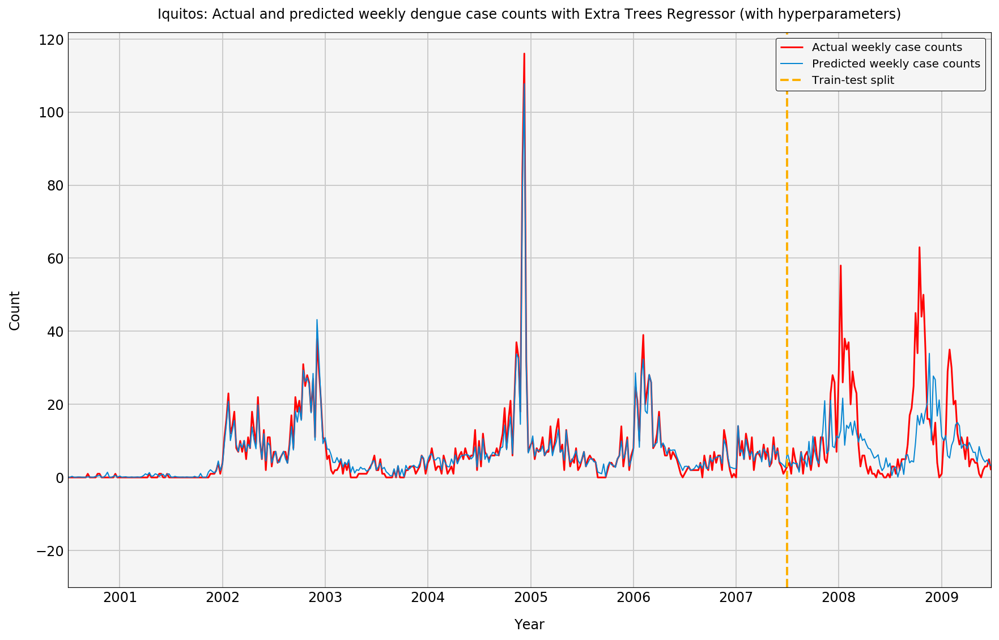

In [160]:
# Store modeled values for train and test set in dataframe with actual values
iq_predictions = iq_df[['total_cases']].copy()
predictions = ETR_gs.predict(iq_X_train_df).tolist() + \
              ETR_gs.predict(iq_X_test_df).tolist()
iq_predictions['model_predictions'] = predictions

# Call function to plot actual vs modeled time series
plot_actual_vs_pred_line(iq_predictions, 'Iquitos', 'Extra Trees Regressor (with hyperparameters)')

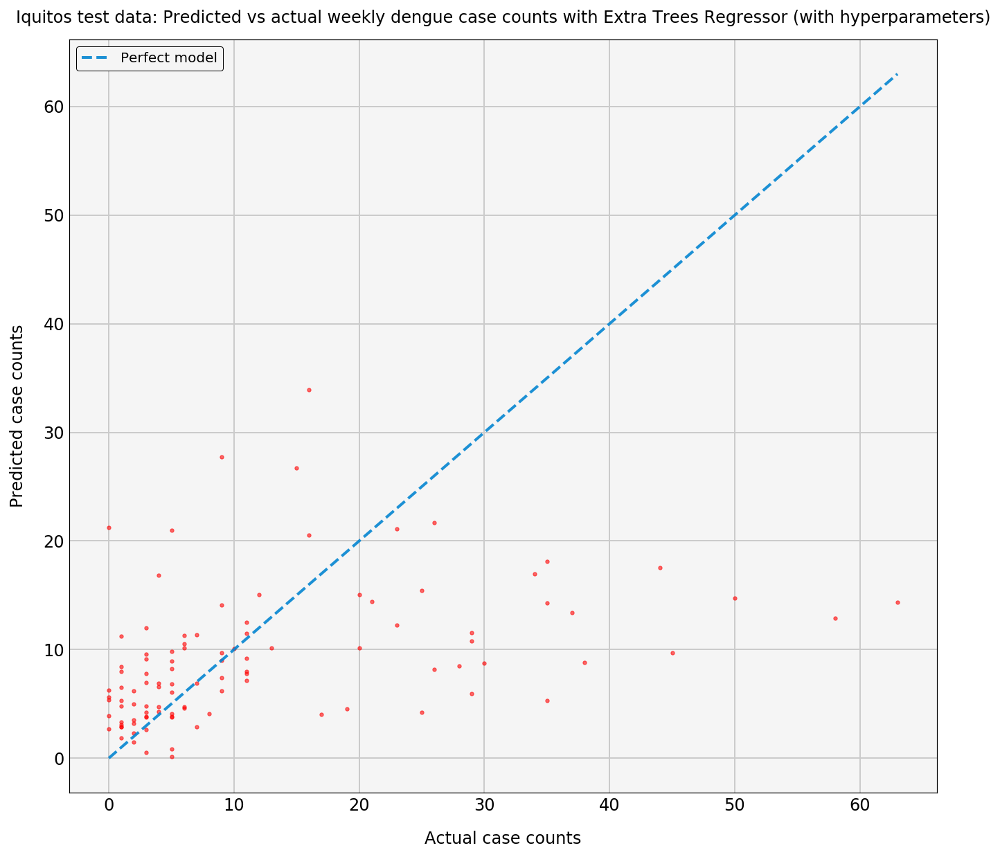

In [161]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(iq_predictions.loc['2007-07-01':,], 
                            'Iquitos', 'Extra Trees Regressor (with hyperparameters)')

The grid search has identified hyperparameters to improve the performance of the RFR however, the accuracy score remains low due to lagging and underestimating the amplitude of the peaks in the test data.

#### KNeighbors Regressor

In [740]:
KNR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=25)),
                        ('knr', KNeighborsRegressor())])

# Fit KNeighbor Pipeline to data
KNR_Pipeline.fit(iq_X_train_df, iq_y_train_df.total_cases)

scores = cross_val_score(KNR_Pipeline, iq_X_train_df, iq_y_train_df.total_cases, 
                         cv=KFold(n_splits=3, shuffle=True, random_state=1))
scores = [round(score,3) for score in scores]
mse = mean_squared_error(iq_y_test_df, KNR_Pipeline.predict(iq_X_test_df))

print(f'Individual cross validation scores on training data: {scores}')
print(f'Mean cross validation score on training data: {round(np.mean(scores),3)}')
print(f'R2 score on full training data set: {round(KNR_Pipeline.score(iq_X_train_df, \
iq_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(KNR_Pipeline.score(iq_X_test_df, \
iq_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')



Individual cross validation scores on training data: [0.294, 0.326, 0.013]
Mean cross validation score on training data: 0.211
R2 score on full training data set: 0.617
R2 score on test data: 0.002
Root mean square error on test data: 13


The cross validation and accuracy scores for the training data are low.  I'm going to try to improve the performance of this model through a GridSearch.

<b>GridSearch</b>

In [762]:
# Define GridSearch parameters 
KNR_Pipeline = Pipeline([('ss', StandardScaler()),
                        #('pca', PCA(n_components=18)),
                        ('pca', PCA()),
                        ('knr', KNeighborsRegressor())])

KNR_params = {'pca__n_components': list(range(17,27)),
              'knr__n_neighbors': list(range(11,101,2)),
              #'knr__weights':['uniform','distance'],
              'knr__metric':['euclidean','manhattan', 'minkowski']}

KNR_gs = GridSearchCV(KNR_Pipeline, KNR_params, verbose=1,
                     cv=KFold(n_splits=3, shuffle=True, random_state=1))

KNR_gs.fit(iq_X_train_df, iq_y_train_df.total_cases)

Fitting 3 folds for each of 1350 candidates, totalling 4050 fits


[Parallel(n_jobs=1)]: Done 4050 out of 4050 | elapsed:   36.6s finished


GridSearchCV(cv=KFold(n_splits=3, random_state=1, shuffle=True),
       error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('pca', PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('knr', KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=5, p=2,
          weights='uniform'))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'pca__n_components': [17, 18, 19, 20, 21, 22, 23, 24, 25, 26], 'knr__n_neighbors': [11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67, 69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99], 'knr__metric': ['euclidean', 'manhattan', 'minkowski']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [763]:
# Print Support Vector Regressor best paramaters
print(f"Best parameters: {KNR_gs.best_params_}")

Best parameters: {'knr__metric': 'manhattan', 'knr__n_neighbors': 11, 'pca__n_components': 22}


In [764]:
# Calculate MSE on test data using best model found in gridsearch
mse = mean_squared_error(iq_y_test_df, KNR_gs.predict(iq_X_test_df))

print(f'Best mean cross validated score from gridsearch: {round(KNR_gs.best_score_,3)}')
print(f'Best R2 score on full training data set: {round(KNR_gs.score(iq_X_train_df, \
iq_y_train_df.total_cases),3)}')
print(f'R2 score on test data: {round(KNR_gs.score(iq_X_test_df, \
iq_y_test_df.total_cases),3)}')
print(f'Root mean square error on test data: {int(np.sqrt(mse))}')


Best mean cross validated score from gridsearch: 0.241
Best R2 score on full training data set: 0.423
R2 score on test data: 0.012
Root mean square error on test data: 13


Poor model performance

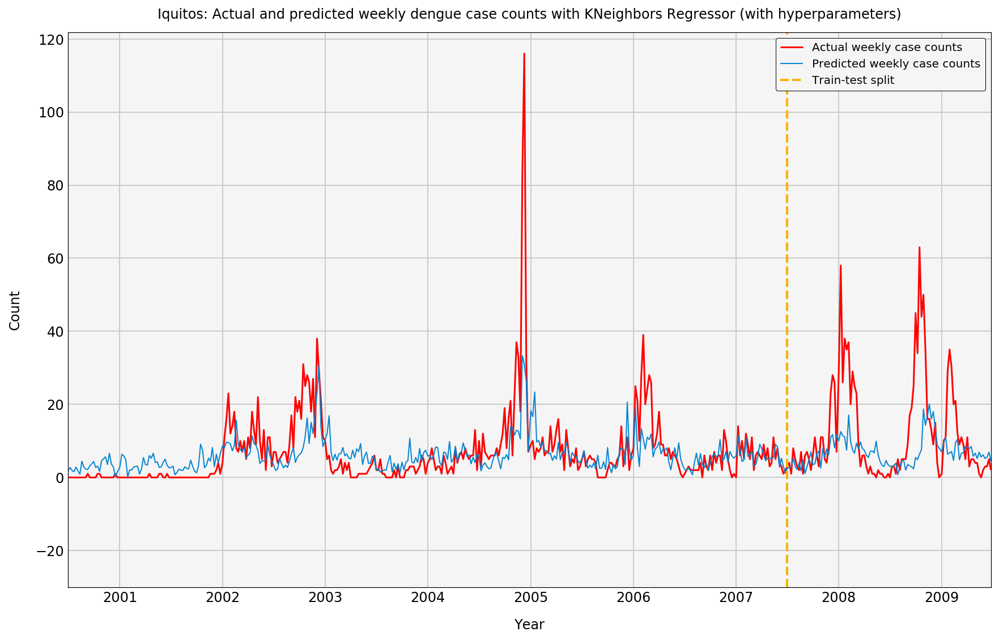

In [765]:
# Store modeled values for train and test set in dataframe with actual values
iq_predictions = iq_df[['total_cases']].copy()
predictions = KNR_gs.predict(iq_X_train_df).tolist() + \
              KNR_gs.predict(iq_X_test_df).tolist()
iq_predictions['model_predictions'] = predictions

# Call function to plot actuals vs modeled time series
plot_actual_vs_pred_line(iq_predictions, 'Iquitos', 'KNeighbors Regressor (with hyperparameters)')

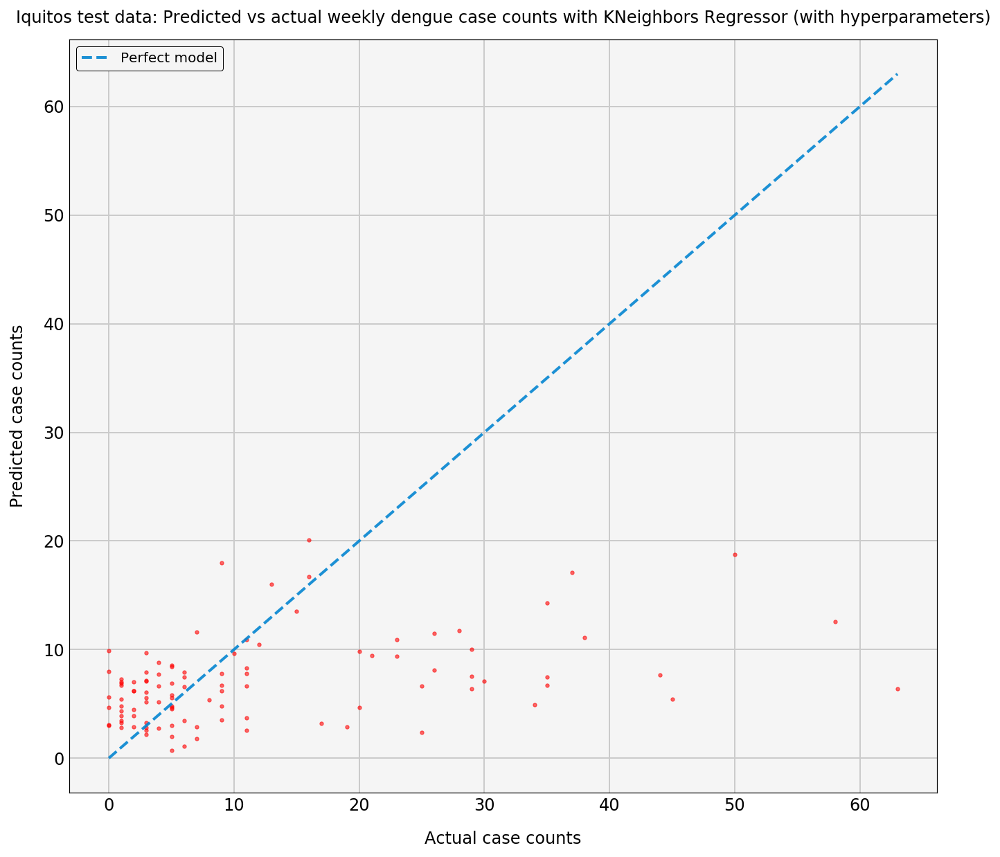

In [766]:
# Call function to plot predicted vs actual test data
plot_actual_vs_pred_scatter(iq_predictions.loc['2007-07-01':], 
                            'Iquitos', 'KNeighbors Regressor (with hyperparameters)')

The model doesn't perform well in learning the training data or predicting the test set.